In [248]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))

<img src=../images/criclytics-playing-the-game-of-cricket-with-Analytics-neelesh-vasnani.jpg>



# Criclytics: Playing the Game of Cricket with Analytics
By: Neelesh Vasnani | 14 February 2021

## - Toss: Background and Motivation

Having its origins in England, Cricket is a sport that is now watched and played by millions of people around the globe - especially among the commonwealth nations. Cricket is often called the "gentleman's game" and has been around for centuries with the first test match played way back in 1844 (ICC, 2018). The game has come a long way since then, but it arguably remains less well-known relative to other popular sports such as basketball, football, or tennis. The popularity of these sports to a large degree aligns with the level of sports analytics employed. While sports analytics has been widely adopted and applied in popular sports such as basketball, it is not as sophisticated in Cricket despite the extensive use of statistics in the game. 

For more general information about the game of Cricket, the following references may be useful:

   - https://www.youtube.com/watch?v=g-beFHld19c&ab_channel=ICC
   - https://en.wikipedia.org/wiki/Cricket

Cricket is bat and ball game played between two teams comprising of 11 players each. The aim of the game is simply to score more runs than the opposition. Compared to other sports, Cricket has a larger set of intricate rules and each match is played for a longer duration. As a result, much larger amounts of data are generated from each Cricket match. This data could relate to match outcomes, match types, players, teams, toss outcomes, grounds, and the like. For example, there is data related to batsmen such as the number of runs scored, balls faced, batting average, strike rate, etc. Similarly, bowlers generate data such as number of wickets taken, runs given, bowling average, economy rate, etc. Moreover, fielders generate data including number of catches, run outs, runs saved, and more. There is also a wealth of insights that can be derived from data at the ball-by-ball granularity. Collectively, the degree to which all this data is analyzed could make all the difference for players maximizing their potential and teams winning matches, series, or tournaments.  

It follows that the current level of analytics sophistication in the sport does injustice to the large amounts of generated data and that big data analytics should definitely be applied more and more in Cricket. Like in any sport, there are a number of Cricket statisticians that have dedicated their entire lives to crunching numbers. However, the need to evolve from traditional descriptive-type statistics (e.g. runs scored) to insightful analytics (e.g. value of player for the team, forecasting performance, etc.) has only recently been recognized. Enthusiasts have started to refer to analytics in Cricket as "Criclytics", yet the proliferation of analytics in the sport is still much undersubscribed. 

This analysis explores the game of Cricket through the lens of analytics. There is a lot that can be covered but the main emphasis of this analysis is to mine out insights from a pool of publicly available data relating to Cricket teams, players, and matches. An exploratory data analysis approach is applied through the use of distributions, visualizations, statistical tests, and trends analysis in order to understand the data and uncover insights. These insights can be incredibly valuable for players and teams in making decisions that improve their performance and ultimately their ability to win matches. 

## - Game Plan: Driving Questions

In light of the above discussion, this analysis is guided by the following investigatory questions:
 - How does the toss outcome impact the win rate percentage for teams?
 - Which teams win more games on average and how do they perform against every other team?
 - How do the 12 main cricketing nations compare in terms of various Cricket statistics?
 - What do the team-level break outs tell us about the strengths or weaknesses of each team?
 - Does batting first or second in a match favor some teams more than others?
 - Across all three formats of the game, which players have historically scored the most runs, taken the most wickets, etc?
 - Which variables (i.e runs, wickets, etc) have the closest association to a team's win rate percentage?
 - Is there a correlation between a country's population or GDP indicators and the number of Cricket players produced or number of matches played?
 - What insights can be derived from looking at various year-over-year trends such as matches played or matches won over time?
 - What factors can be utilized to build a novel "Player Value" index or metric measuring the overall value of a player for his country or team?

## - Game Preparation: Data Acquisiton and Wrangling

A thorough data preparation and cleaning task is done before proceeding into analysis. This process is essential to ensure accurate results and valid inferences from the analyses. 

### - Importing Modules and Setting Options

In [580]:
#importing required modules

import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from pylab import rcParams
import requests                 
from bs4 import BeautifulSoup  
from matplotlib import cm
import json
import pprint as pp
from scipy.stats import f_oneway, ttest_ind, pearsonr, linregress, normaltest
from ipython_memwatcher import MemWatcher #for memory watching and optimization
mw = MemWatcher()
mw.start_watching_memory()

#setting up plotting options

%matplotlib inline
%reload_ext autoreload
%autoreload 2

rcParams['figure.figsize'] = 14,8
rcParams['font.size'] = 20
rcParams['axes.facecolor'] = 'white'
plt.style.use('seaborn-white')
sns.set_style('white')
sns.set_context('paper', font_scale=1.5)
palette = sns.color_palette("Greens")

#display options for Pandas

pd.set_option('max_columns', 20)
pd.set_option('max_rows', 20)

Setting up some custom functions for efficiency:

In [582]:
#counting records with at least one null value in a dataset

def rowcountofnull(d):
    return len(d[d.isnull().any(axis=1)].index)

#viewing datatypes, columns, and sample records in a dataset

def quickviewdf(d):
    print("Columns and data types:\n")
    print(d.dtypes, "\n")
    print("Quick Glance at Data Set (1st 2 rows):")
    return d.head(2)

#custom function to add bar labels to bar chart        
        
def addbarhlabels(ax, spacing=5):
    
    for rect in ax.patches:
        x_value = rect.get_width()
        y_value = rect.get_y() + rect.get_height() / 2
        space = 5
        ha = 'left'
        if x_value < 0:
            space *= -1
            ha = 'right'
        label = "{:.0f}".format(x_value)
        plt.annotate(
            label,                      
            (x_value, y_value),        
            xytext=(space, 0),          
            textcoords="offset points", 
            va='center',            
            ha=ha)  
        
#no borders in plot

def noborders(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    
#test for normal distribution

def isnormal(d):
    stat, pvalue = normaltest(d)
    print("Test for Normality Results: Statistic = %g , p-value = %g\n" % (stat, pvalue))
    if pvalue < 0.05:  # null hypothesis: x comes from a normal distribution
        print("The null hypothesis can be rejected - the variable is normally distributed.")
    else:
        print("The null hypothesis cannot be rejected - not enough evidence to claim the variable is normally distributed.")
        
#linear regression function

def linreg(x,y):
    s,i,r,p,e = linregress(x,y)
    print("Linear regression output:", 
          "\n\nEquation: y =", s,"x  + ", i,
          "\nCorrelation coefficient (r): ",r,
          "\np-value", p,
          "\nStandard error:", e)
    
#upper tailed hypothesis test function

def uppertailtest(a,b):
    stat, pvalue = ttest_ind(a,b, equal_var=False)
    print("Upper-tailed Hypothesis Test Results: \n\nStatistic = %g  P-Value = %g" % (stat, pvalue/2))
    if pvalue/2 < 0.05:
        print("Decision: Reject null hypothesis")
    else:
        print("Decision: Failed to reject null hypothesis")

#ANOVA test function

def anova(a,b,c,d,e,f,g,h,i,j,k,l):
    stat, pvalue = f_oneway(a,b,c,d,e,f,g,h,i,j,k,l) 
    print("ANOVA results: \n\nF-statistic = %g  P-Value = %g" % (stat, pvalue))
    if pvalue < 0.05:
        print("Decision: Reject null hypothesis")
    else:
        print("Decision: Not enough evidence to reject null hypothesis")

### - Acquiring Data

A variety of methods are employed to obtain and import data for this analysis. Primarily, large datasets pertaining to Cricket matches and players are scraped from the official web records hosted at espncricinfo.com. For secondary analysis, country data for the relevant teams are pulled through a web API or directly imported from static CSV files.

The following data sources are used for the analysis:

1. All-time cricket players database

    - Source: espncricinfo.com
    - Acquisition Method: Web Scraping
    
    
2. All-time cricket match results database

    - Source: espncricinfo.com
    - Acquisition Method: Web Scraping
    
    
3. Country population and GDP per capita database

    - Source: api.worldbank.org
    - Acquisition Method: Web API
    
    
4. Full member countries of the International Cricket Council (ICC)

    - Source: icc-cricket.com
    - Acquisition Method: static CSV
    
    
5. Member countries of the West Indies for mapping

    - Source: data.world
    - Acquisition Method: static CSV
    
    
6. Player to country code map

    - Source: espncricinfo.com
    - Acquisition Method: static CSV


Scraping Cricket players data from ESPN Cricinfo:

In [669]:
#accessing page containing players data and reading into BeautifulSoup

%time
url = "https://stats.espncricinfo.com/ci/engine/stats/index.html?class=11;filter=advanced;orderby=start;page=1;size=200;template=results;type=allround"
response = requests.get(url)
response

Wall time: 0 ns


<Response [200]>

In [669] used 7.398 MiB RAM in 11.026s, peaked 0.000 MiB above current, total RAM usage 418.020 MiB


In [7]:
#attempt to scrape first page of players data

scraping_html_table = BeautifulSoup(response.content, "lxml") 
scraping_html_table = scraping_html_table.find_all("table", "engineTable")
df = pd.read_html(str(scraping_html_table))
players_df = df[2]
players_df.head(2)

,Player,Span,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,Unnamed: 14
0,T Armitage (ENG),1877-1877,2,33,21,11.00,0,0,-,-,0,0,0,-,NaN
1,C Bannerman (AUS),1877-1879,3,239,165*,59.75,1,-,-,-,-,0,0,-,NaN


In [8]:
#looping through all the pages and concatenating/appending each page to the data frame 

for page in range(2,100): # "50" is specified as a safe upper limit but not necessarily the last page
    url = "https://stats.espncricinfo.com/ci/engine/stats/index.html?class=11;filter=advanced;orderby=start;page=%s;size=200;template=results;type=allround" % page
    response = requests.get(url)
    scraping_html_table = BeautifulSoup(response.content, "lxml") 
    scraping_html_table = scraping_html_table.find_all("table", "engineTable")
    dftemp = pd.read_html(str(scraping_html_table))
    players_dftemp = dftemp[2]
    if players_dftemp.iloc[0,0] == 'No records available to match this query':
        break #stop looping after last page is reached
    else:
        players_df = pd.concat([players_df, players_dftemp], ignore_index=True) #append each page to exisiting df
players_df.tail(2)

,Player,Span,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,Unnamed: 14
5181,GA Stuurman (SA),2021-2021,1,-,-,-,-,0,-,-,0,0,0,-,NaN
5182,Zahid Mahmood (PAK),2021-2021,1,-,-,-,-,3,3/40,13.33,0,0,0,-,NaN


Scraping Cricket Matches data from ESPN Cricinfo:

In [670]:
#accessing page containing matches data and reading into BeautifulSoup

%time
url = "https://stats.espncricinfo.com/ci/engine/stats/index.html?class=11;filter=advanced;orderby=start;page=1;size=200;template=results;type=team;view=results"
response = requests.get(url)
response

Wall time: 0 ns


<Response [200]>

In [670] used 1.328 MiB RAM in 5.402s, peaked 0.000 MiB above current, total RAM usage 419.348 MiB


In [10]:
#attempt to scrape first page of matches data

scraping_html_table = BeautifulSoup(response.content, "lxml") 
scraping_html_table = scraping_html_table.find_all("table", "engineTable")
df = pd.read_html(str(scraping_html_table))
matches_df = df[2]
matches_df.head(2)

,Team,Result,Margin,BR,Toss,Bat,Unnamed: 6,Opposition,Ground,Start Date,Unnamed: 10
0,Australia,won,45 runs,NaN,won,1st,NaN,Test v England,Melbourne,15 Mar 1877,NaN
1,England,lost,45 runs,NaN,lost,2nd,NaN,Test v Australia,Melbourne,15 Mar 1877,NaN


In [11]:
#looping through all the pages and appending each page to the data frame 

for page in range(2,100): # "100" is specified as a safe upper limit but not necessarily the last page
    url = "https://stats.espncricinfo.com/ci/engine/stats/index.html?class=11;filter=advanced;orderby=start;page=%s;size=200;template=results;type=team;view=results" % page
    response = requests.get(url)
    scraping_html_table = BeautifulSoup(response.content, "lxml") 
    scraping_html_table = scraping_html_table.find_all("table", "engineTable")
    dftemp = pd.read_html(str(scraping_html_table))
    matches_dftemp = dftemp[2]
    if matches_dftemp.iloc[0,0] == 'No records available to match this query':
        break #stop looping after last page is reached
    else:
        matches_df = pd.concat([matches_df, matches_dftemp], ignore_index=True) #append each page to exisiting df
matches_df.tail(2)

,Team,Result,Margin,BR,Toss,Bat,Unnamed: 6,Opposition,Ground,Start Date,Unnamed: 10
16090,Pakistan,won,4 wickets,8.0,won,2nd,NaN,T20I v South Africa,Lahore,14 Feb 2021,NaN
16091,South Africa,lost,4 wickets,8.0,lost,1st,NaN,T20I v Pakistan,Lahore,14 Feb 2021,NaN


Importing country-level indicators using an API:

In [671]:
#accessing API to fetch country population data

%time
indicator =  'SP.POP.TOTL?date=1970:2020'
url = "http://api.worldbank.org/v2/countries/all/indicators/%s&format=json&per_page=30000&source=2" % indicator
print(url)
response = requests.get(url)
print(response)
result = response.content
result = json.loads(result)
pp.pprint(result)

Wall time: 0 ns
http://api.worldbank.org/v2/countries/all/indicators/SP.POP.TOTL?date=1970:2020&format=json&per_page=30000&source=2
<Response [200]>
[{'lastupdated': '2020-12-16',
  'page': 1,
  'pages': 1,
  'per_page': 30000,
  'sourceid': '2',
  'total': 13464},
 [{'country': {'id': '1A', 'value': 'Arab World'},
   'countryiso3code': 'ARB',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': '1A', 'value': 'Arab World'},
   'countryiso3code': 'ARB',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 427870270},
  {'country': {'id': '1A', 'value': 'Arab World'},
   'countryiso3code': 'ARB',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 419790591},
  {'

   'obs_status': '',
   'unit': '',
   'value': 6170355},
  {'country': {'id': 'S3', 'value': 'Caribbean small states'},
   'countryiso3code': 'CSS',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6112812},
  {'country': {'id': 'S3', 'value': 'Caribbean small states'},
   'countryiso3code': 'CSS',
   'date': '1991',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6058314},
  {'country': {'id': 'S3', 'value': 'Caribbean small states'},
   'countryiso3code': 'CSS',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6009253},
  {'country': {'id': 'S3', 'value': 'Caribbean small states'},
   'countryiso3code': 'CSS',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'P

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2560101445},
  {'country': {'id': 'V2', 'value': 'Early-demographic dividend'},
   'countryiso3code': 'EAR',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2516662231},
  {'country': {'id': 'V2', 'value': 'Early-demographic dividend'},
   'countryiso3code': 'EAR',
   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2472852818},
  {'country': {'id': 'V2', 'value': 'Early-demographic dividend'},
   'countryiso3code': 'EAR',
   'date': '1999',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2428606148},
  {'country': {'id': 'V2', 'value': 'Early-demographic dividend'},
   'countryiso3co

   'obs_status': '',
   'unit': '',
   'value': 1684294889},
  {'country': {'id': 'Z4', 'value': 'East Asia & Pacific'},
   'countryiso3code': 'EAS',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1659131214},
  {'country': {'id': 'Z4', 'value': 'East Asia & Pacific'},
   'countryiso3code': 'EAS',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1634539937},
  {'country': {'id': 'Z4', 'value': 'East Asia & Pacific'},
   'countryiso3code': 'EAS',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1608678553},
  {'country': {'id': 'Z4', 'value': 'East Asia & Pacific'},
   'countryiso3code': 'EAS',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'P

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1927560609},
  {'country': {'id': 'T4',
               'value': 'East Asia & Pacific (IDA & IBRD countries)'},
   'countryiso3code': 'TEA',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1913718210},
  {'country': {'id': 'T4',
               'value': 'East Asia & Pacific (IDA & IBRD countries)'},
   'countryiso3code': 'TEA',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1899800530},
  {'country': {'id': 'T4',
               'value': 'East Asia & Pacific (IDA & IBRD countries)'},
   'countryiso3code': 'TEA',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1885

  {'country': {'id': 'XC', 'value': 'Euro area'},
   'countryiso3code': 'EMU',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 306640638},
  {'country': {'id': 'XC', 'value': 'Euro area'},
   'countryiso3code': 'EMU',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 305877727},
  {'country': {'id': 'XC', 'value': 'Euro area'},
   'countryiso3code': 'EMU',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 305299134},
  {'country': {'id': 'XC', 'value': 'Euro area'},
   'countryiso3code': 'EMU',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 304787493},
  {'country': {'id': 'XC

  {'country': {'id': '7E',
               'value': 'Europe & Central Asia (excluding high income)'},
   'countryiso3code': 'ECA',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 368734967},
  {'country': {'id': '7E',
               'value': 'Europe & Central Asia (excluding high income)'},
   'countryiso3code': 'ECA',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 368313051},
  {'country': {'id': '7E',
               'value': 'Europe & Central Asia (excluding high income)'},
   'countryiso3code': 'ECA',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 367887319},
  {'country': {'id': '7E',
               'value': 'Europe & Central Asia (excluding high income)'},
   'countryiso

   'unit': '',
   'value': 413657277},
  {'country': {'id': 'T7',
               'value': 'Europe & Central Asia (IDA & IBRD countries)'},
   'countryiso3code': 'TEC',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 409642794},
  {'country': {'id': 'T7',
               'value': 'Europe & Central Asia (IDA & IBRD countries)'},
   'countryiso3code': 'TEC',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 405559692},
  {'country': {'id': 'T7',
               'value': 'Europe & Central Asia (IDA & IBRD countries)'},
   'countryiso3code': 'TEC',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 401434285},
  {'country': {'id': 'T7',
               'value': 'Europe & Central Asia (IDA 

   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 481098947},
  {'country': {'id': 'F1', 'value': 'Fragile and conflict affected situations'},
   'countryiso3code': 'FCS',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 470020836},
  {'country': {'id': 'F1', 'value': 'Fragile and conflict affected situations'},
   'countryiso3code': 'FCS',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 458764367},
  {'country': {'id': 'F1', 'value': 'Fragile and conflict affected situations'},
   'countryiso3code': 'FCS',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 447316926},
  {'countr

   'date': '1979',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 263721622},
  {'country': {'id': 'XE', 'value': 'Heavily indebted poor countries (HIPC)'},
   'countryiso3code': 'HPC',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 256880793},
  {'country': {'id': 'XE', 'value': 'Heavily indebted poor countries (HIPC)'},
   'countryiso3code': 'HPC',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 250160346},
  {'country': {'id': 'XE', 'value': 'Heavily indebted poor countries (HIPC)'},
   'countryiso3code': 'HPC',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 243590895},
  {'country': {'

  {'country': {'id': 'XF', 'value': 'IBRD only'},
   'countryiso3code': 'IBD',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4032822503},
  {'country': {'id': 'XF', 'value': 'IBRD only'},
   'countryiso3code': 'IBD',
   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3987195305},
  {'country': {'id': 'XF', 'value': 'IBRD only'},
   'countryiso3code': 'IBD',
   'date': '1999',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3940459765},
  {'country': {'id': 'XF', 'value': 'IBRD only'},
   'countryiso3code': 'IBD',
   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3892058667},
  {'country': {'id':

   'countryiso3code': 'IDB',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 434469613},
  {'country': {'id': 'XH', 'value': 'IDA blend'},
   'countryiso3code': 'IDB',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 424192635},
  {'country': {'id': 'XH', 'value': 'IDA blend'},
   'countryiso3code': 'IDB',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 414232526},
  {'country': {'id': 'XH', 'value': 'IDA blend'},
   'countryiso3code': 'IDB',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 404615758},
  {'country': {'id': 'XH', 'value': 'IDA blend'},
   'countryiso3code': 'I

   'countryiso3code': 'IDX',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 810355271},
  {'country': {'id': 'XI', 'value': 'IDA only'},
   'countryiso3code': 'IDX',
   'date': '2004',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 791288291},
  {'country': {'id': 'XI', 'value': 'IDA only'},
   'countryiso3code': 'IDX',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 772456490},
  {'country': {'id': 'XI', 'value': 'IDA only'},
   'countryiso3code': 'IDX',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 753924112},
  {'country': {'id': 'XI', 'value': 'IDA only'},
   'countryiso3code': 'IDX',

  {'country': {'id': 'V3', 'value': 'Late-demographic dividend'},
   'countryiso3code': 'LTE',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2114307505},
  {'country': {'id': 'V3', 'value': 'Late-demographic dividend'},
   'countryiso3code': 'LTE',
   'date': '2004',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2100746529},
  {'country': {'id': 'V3', 'value': 'Late-demographic dividend'},
   'countryiso3code': 'LTE',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2087310557},
  {'country': {'id': 'V3', 'value': 'Late-demographic dividend'},
   'countryiso3code': 'LTE',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': 

  {'country': {'id': 'ZJ', 'value': 'Latin America & Caribbean'},
   'countryiso3code': 'LCN',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 336887191},
  {'country': {'id': 'ZJ', 'value': 'Latin America & Caribbean'},
   'countryiso3code': 'LCN',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 329337968},
  {'country': {'id': 'ZJ', 'value': 'Latin America & Caribbean'},
   'countryiso3code': 'LCN',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 321874182},
  {'country': {'id': 'ZJ', 'value': 'Latin America & Caribbean'},
   'countryiso3code': 'LCN',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',

   'countryiso3code': 'TLA',
   'date': '1999',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 497441716},
  {'country': {'id': 'T2',
               'value': 'Latin America & the Caribbean (IDA & IBRD countries)'},
   'countryiso3code': 'TLA',
   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 489832045},
  {'country': {'id': 'T2',
               'value': 'Latin America & the Caribbean (IDA & IBRD countries)'},
   'countryiso3code': 'TLA',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 482112380},
  {'country': {'id': 'T2',
               'value': 'Latin America & the Caribbean (IDA & IBRD countries)'},
   'countryiso3code': 'TLA',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.PO

               'value': 'Least developed countries: UN classification'},
   'countryiso3code': 'LDC',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 492803028},
  {'country': {'id': 'XL',
               'value': 'Least developed countries: UN classification'},
   'countryiso3code': 'LDC',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 479814021},
  {'country': {'id': 'XL',
               'value': 'Least developed countries: UN classification'},
   'countryiso3code': 'LDC',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 467290514},
  {'country': {'id': 'XL',
               'value': 'Least developed countries: UN classification'},
   'countryiso3code': 'LDC',
   'date': '1986

   'unit': '',
   'value': 462679645},
  {'country': {'id': 'XM', 'value': 'Low income'},
   'countryiso3code': '',
   'date': '2004',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 449765047},
  {'country': {'id': 'XM', 'value': 'Low income'},
   'countryiso3code': '',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 437166682},
  {'country': {'id': 'XM', 'value': 'Low income'},
   'countryiso3code': '',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 424933735},
  {'country': {'id': 'XM', 'value': 'Low income'},
   'countryiso3code': '',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 41312

  {'country': {'id': 'ZQ', 'value': 'Middle East & North Africa'},
   'countryiso3code': 'MEA',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 369823252},
  {'country': {'id': 'ZQ', 'value': 'Middle East & North Africa'},
   'countryiso3code': 'MEA',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 361929136},
  {'country': {'id': 'ZQ', 'value': 'Middle East & North Africa'},
   'countryiso3code': 'MEA',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 354302463},
  {'country': {'id': 'ZQ', 'value': 'Middle East & North Africa'},
   'countryiso3code': 'MEA',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status':

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 264504166},
  {'country': {'id': 'XQ',
               'value': 'Middle East & North Africa (excluding high income)'},
   'countryiso3code': 'MNA',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 259431597},
  {'country': {'id': 'XQ',
               'value': 'Middle East & North Africa (excluding high income)'},
   'countryiso3code': 'MNA',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 254233351},
  {'country': {'id': 'XQ',
               'value': 'Middle East & North Africa (excluding high income)'},
   'countryiso3code': 'MNA',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 157192233},
  {'country': {'id': 'T3',
               'value': 'Middle East & North Africa (IDA & IBRD countries)'},
   'countryiso3code': 'TMN',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 152881209},
  {'country': {'id': 'T3',
               'value': 'Middle East & North Africa (IDA & IBRD countries)'},
   'countryiso3code': 'TMN',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 148781931},
  {'country': {'id': 'T3',
               'value': 'Middle East & North Africa (IDA & IBRD countries)'},
   'countryiso3code': 'TMN',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': 

   'date': '1991',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 281077441},
  {'country': {'id': 'XU', 'value': 'North America'},
   'countryiso3code': 'NAC',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 277373464},
  {'country': {'id': 'XU', 'value': 'North America'},
   'countryiso3code': 'NAC',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 274154622},
  {'country': {'id': 'XU', 'value': 'North America'},
   'countryiso3code': 'NAC',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 271349094},
  {'country': {'id': 'XU', 'value': 'North America'},
   'countryiso3code': 'NAC',
   'date

  {'country': {'id': 'OE', 'value': 'OECD members'},
   'countryiso3code': 'OED',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1153301290},
  {'country': {'id': 'OE', 'value': 'OECD members'},
   'countryiso3code': 'OED',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1144072690},
  {'country': {'id': 'OE', 'value': 'OECD members'},
   'countryiso3code': 'OED',
   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1134697660},
  {'country': {'id': 'OE', 'value': 'OECD members'},
   'countryiso3code': 'OED',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1124867020},
  {'coun

   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 11255183},
  {'country': {'id': 'S4', 'value': 'Other small states'},
   'countryiso3code': 'OSS',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 11029142},
  {'country': {'id': 'S2', 'value': 'Pacific island small states'},
   'countryiso3code': 'PSS',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'S2', 'value': 'Pacific island small states'},
   'countryiso3code': 'PSS',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2493696},
  {'country': {'id': 'S2', 'value': 'Pacific island small states'},

   'value': 1082327434},
  {'country': {'id': 'V4', 'value': 'Post-demographic dividend'},
   'countryiso3code': 'PST',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1077815367},
  {'country': {'id': 'V4', 'value': 'Post-demographic dividend'},
   'countryiso3code': 'PST',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1074865103},
  {'country': {'id': 'V4', 'value': 'Post-demographic dividend'},
   'countryiso3code': 'PST',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1069878414},
  {'country': {'id': 'V4', 'value': 'Post-demographic dividend'},
   'countryiso3code': 'PST',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, t

   'value': 282049515},
  {'country': {'id': 'V1', 'value': 'Pre-demographic dividend'},
   'countryiso3code': 'PRE',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 273877851},
  {'country': {'id': 'V1', 'value': 'Pre-demographic dividend'},
   'countryiso3code': 'PRE',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 266195005},
  {'country': {'id': 'V1', 'value': 'Pre-demographic dividend'},
   'countryiso3code': 'PRE',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 258953043},
  {'country': {'id': 'V1', 'value': 'Pre-demographic dividend'},
   'countryiso3code': 'PRE',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},


   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1108702403},
  {'country': {'id': '8S', 'value': 'South Asia'},
   'countryiso3code': 'SAS',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1084281155},
  {'country': {'id': '8S', 'value': 'South Asia'},
   'countryiso3code': 'SAS',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1060208539},
  {'country': {'id': '8S', 'value': 'South Asia'},
   'countryiso3code': 'SAS',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1036437892},
  {'country': {'id': '8S', 'value': 'South Asia'},
   'countryiso3code': 'SAS',
   'date': '1985',
   'decimal': 0,

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 417425681},
  {'country': {'id': 'ZG', 'value': 'Sub-Saharan Africa'},
   'countryiso3code': 'SSF',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 405688903},
  {'country': {'id': 'ZG', 'value': 'Sub-Saharan Africa'},
   'countryiso3code': 'SSF',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 394281956},
  {'country': {'id': 'ZG', 'value': 'Sub-Saharan Africa'},
   'countryiso3code': 'SSF',
   'date': '1980',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 383188232},
  {'country': {'id': 'ZG', 'value': 'Sub-Saharan Africa'},
   'countryiso3code': 'SSF',
   'date': '1979',
   'd

   'obs_status': '',
   'unit': '',
   'value': 630161389},
  {'country': {'id': 'ZF',
               'value': 'Sub-Saharan Africa (excluding high income)'},
   'countryiso3code': 'SSA',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 613828768},
  {'country': {'id': 'ZF',
               'value': 'Sub-Saharan Africa (excluding high income)'},
   'countryiso3code': 'SSA',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 597857366},
  {'country': {'id': 'ZF',
               'value': 'Sub-Saharan Africa (excluding high income)'},
   'countryiso3code': 'SSA',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 582215500},
  {'country': {'id': 'ZF',
               'value': 'Sub-Saharan 

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2706457074},
  {'country': {'id': 'XT', 'value': 'Upper middle income'},
   'countryiso3code': '',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2684416240},
  {'country': {'id': 'XT', 'value': 'Upper middle income'},
   'countryiso3code': '',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2663127523},
  {'country': {'id': 'XT', 'value': 'Upper middle income'},
   'countryiso3code': '',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2642571330},
  {'country': {'id': 'XT', 'value': 'Upper middle income'},
   'countryiso3code': '',
   'date': 

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5280076280},
  {'country': {'id': '1W', 'value': 'World'},
   'countryiso3code': 'WLD',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5189996794},
  {'country': {'id': '1W', 'value': 'World'},
   'countryiso3code': 'WLD',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5101297271},
  {'country': {'id': '1W', 'value': 'World'},
   'countryiso3code': 'WLD',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5012555212},
  {'country': {'id': '1W', 'value': 'World'},
   'countryiso3code': 'WLD',
   'date': '1986',
   'decimal': 0,
   'indicator': {'i

   'obs_status': '',
   'unit': '',
   'value': 2927519},
  {'country': {'id': 'AL', 'value': 'Albania'},
   'countryiso3code': 'ALB',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2947314},
  {'country': {'id': 'AL', 'value': 'Albania'},
   'countryiso3code': 'ALB',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2970017},
  {'country': {'id': 'AL', 'value': 'Albania'},
   'countryiso3code': 'ALB',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2992547},
  {'country': {'id': 'AL', 'value': 'Albania'},
   'countryiso3code': 'ALB',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   '

   'unit': '',
   'value': 55713},
  {'country': {'id': 'AS', 'value': 'American Samoa'},
   'countryiso3code': 'ASM',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 55667},
  {'country': {'id': 'AS', 'value': 'American Samoa'},
   'countryiso3code': 'ASM',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 55759},
  {'country': {'id': 'AS', 'value': 'American Samoa'},
   'countryiso3code': 'ASM',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 56079},
  {'country': {'id': 'AS', 'value': 'American Samoa'},
   'countryiso3code': 'ASM',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'v

   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 52448},
  {'country': {'id': 'AD', 'value': 'Andorra'},
   'countryiso3code': 'AND',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 50434},
  {'country': {'id': 'AD', 'value': 'Andorra'},
   'countryiso3code': 'AND',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 48455},
  {'country': {'id': 'AD', 'value': 'Andorra'},
   'countryiso3code': 'AND',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 46517},
  {'country': {'id': 'AD', 'value': 'Andorra'},
   'countryiso3code': 'AND',
   'date': '1985',
   'decimal': 0,
   'indicato

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 61952},
  {'country': {'id': 'AG', 'value': 'Antigua and Barbuda'},
   'countryiso3code': 'ATG',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 62036},
  {'country': {'id': 'AG', 'value': 'Antigua and Barbuda'},
   'countryiso3code': 'ATG',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 62159},
  {'country': {'id': 'AG', 'value': 'Antigua and Barbuda'},
   'countryiso3code': 'ATG',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 62367},
  {'country': {'id': 'AG', 'value': 'Antigua and Barbuda'},
   'countryiso3code': 'ATG',
   'date': '1975',
   'decimal': 0,


   'date': '2004',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3000720},
  {'country': {'id': 'AM', 'value': 'Armenia'},
   'countryiso3code': 'ARM',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3017932},
  {'country': {'id': 'AM', 'value': 'Armenia'},
   'countryiso3code': 'ARM',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3033978},
  {'country': {'id': 'AM', 'value': 'Armenia'},
   'countryiso3code': 'ARM',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3050687},
  {'country': {'id': 'AM', 'value': 'Armenia'},
   'countryiso3code': 'ARM',
   'date': '2000',
   'decimal': 0,
   '

  {'country': {'id': 'AU', 'value': 'Australia'},
   'countryiso3code': 'AUS',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 25364307},
  {'country': {'id': 'AU', 'value': 'Australia'},
   'countryiso3code': 'AUS',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 24982688},
  {'country': {'id': 'AU', 'value': 'Australia'},
   'countryiso3code': 'AUS',
   'date': '2017',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 24601860},
  {'country': {'id': 'AU', 'value': 'Australia'},
   'countryiso3code': 'AUS',
   'date': '2016',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 24190907},
  {'country': {'id': 'AU', '

   'unit': '',
   'value': 7561434},
  {'country': {'id': 'AT', 'value': 'Austria'},
   'countryiso3code': 'AUT',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7561910},
  {'country': {'id': 'AT', 'value': 'Austria'},
   'countryiso3code': 'AUT',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7574140},
  {'country': {'id': 'AT', 'value': 'Austria'},
   'countryiso3code': 'AUT',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7568710},
  {'country': {'id': 'AT', 'value': 'Austria'},
   'countryiso3code': 'AUT',
   'date': '1980',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7549433},
  {

   'value': 290597},
  {'country': {'id': 'BS', 'value': 'Bahamas, The'},
   'countryiso3code': 'BHS',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 287358},
  {'country': {'id': 'BS', 'value': 'Bahamas, The'},
   'countryiso3code': 'BHS',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 283978},
  {'country': {'id': 'BS', 'value': 'Bahamas, The'},
   'countryiso3code': 'BHS',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 280184},
  {'country': {'id': 'BS', 'value': 'Bahamas, The'},
   'countryiso3code': 'BHS',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 275846},
  {

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 120160564},
  {'country': {'id': 'BD', 'value': 'Bangladesh'},
   'countryiso3code': 'BGD',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 117649932},
  {'country': {'id': 'BD', 'value': 'Bangladesh'},
   'countryiso3code': 'BGD',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 115169930},
  {'country': {'id': 'BD', 'value': 'Bangladesh'},
   'countryiso3code': 'BGD',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 112737683},
  {'country': {'id': 'BD', 'value': 'Bangladesh'},
   'countryiso3code': 'BGD',
   'date': '1993',
   'decimal': 0,
   'indicator': {'id

   'countryiso3code': 'BRB',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 256263},
  {'country': {'id': 'BB', 'value': 'Barbados'},
   'countryiso3code': 'BRB',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 255497},
  {'country': {'id': 'BB', 'value': 'Barbados'},
   'countryiso3code': 'BRB',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 254788},
  {'country': {'id': 'BB', 'value': 'Barbados'},
   'countryiso3code': 'BRB',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 254082},
  {'country': {'id': 'BB', 'value': 'Barbados'},
   'countryiso3code': 'BRB',
   'date': 

   'unit': '',
   'value': 10332785},
  {'country': {'id': 'BE', 'value': 'Belgium'},
   'countryiso3code': 'BEL',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10286570},
  {'country': {'id': 'BE', 'value': 'Belgium'},
   'countryiso3code': 'BEL',
   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10251250},
  {'country': {'id': 'BE', 'value': 'Belgium'},
   'countryiso3code': 'BEL',
   'date': '1999',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10226419},
  {'country': {'id': 'BE', 'value': 'Belgium'},
   'countryiso3code': 'BEL',
   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10203008}

   'value': 11175204},
  {'country': {'id': 'BJ', 'value': 'Benin'},
   'countryiso3code': 'BEN',
   'date': '2016',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10872067},
  {'country': {'id': 'BJ', 'value': 'Benin'},
   'countryiso3code': 'BEN',
   'date': '2015',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10575952},
  {'country': {'id': 'BJ', 'value': 'Benin'},
   'countryiso3code': 'BEN',
   'date': '2014',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10286842},
  {'country': {'id': 'BJ', 'value': 'Benin'},
   'countryiso3code': 'BEN',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10004588},
  {'country': {'id': 

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 53600},
  {'country': {'id': 'BM', 'value': 'Bermuda'},
   'countryiso3code': 'BMU',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 53400},
  {'country': {'id': 'BM', 'value': 'Bermuda'},
   'countryiso3code': 'BMU',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 53200},
  {'country': {'id': 'BM', 'value': 'Bermuda'},
   'countryiso3code': 'BMU',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 53000},
  {'country': {'id': 'BM', 'value': 'Bermuda'},
   'countryiso3code': 'BMU',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.

   'unit': '',
   'value': 6179460},
  {'country': {'id': 'BO', 'value': 'Bolivia'},
   'countryiso3code': 'BOL',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6054123},
  {'country': {'id': 'BO', 'value': 'Bolivia'},
   'countryiso3code': 'BOL',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5932810},
  {'country': {'id': 'BO', 'value': 'Bolivia'},
   'countryiso3code': 'BOL',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5814345},
  {'country': {'id': 'BO', 'value': 'Bolivia'},
   'countryiso3code': 'BOL',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5697096},
  {

  {'country': {'id': 'BW', 'value': 'Botswana'},
   'countryiso3code': 'BWA',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1835908},
  {'country': {'id': 'BW', 'value': 'Botswana'},
   'countryiso3code': 'BWA',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1799078},
  {'country': {'id': 'BW', 'value': 'Botswana'},
   'countryiso3code': 'BWA',
   'date': '2004',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1765527},
  {'country': {'id': 'BW', 'value': 'Botswana'},
   'countryiso3code': 'BWA',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1734398},
  {'country': {'id': 'BW', 'value': 

   'value': 107216205},
  {'country': {'id': 'BR', 'value': 'Brazil'},
   'countryiso3code': 'BRA',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 104706198},
  {'country': {'id': 'BR', 'value': 'Brazil'},
   'countryiso3code': 'BRA',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 102259497},
  {'country': {'id': 'BR', 'value': 'Brazil'},
   'countryiso3code': 'BRA',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 99859383},
  {'country': {'id': 'BR', 'value': 'Brazil'},
   'countryiso3code': 'BRA',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 97482920},
  {'country': 

   'countryiso3code': 'BRN',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 297114},
  {'country': {'id': 'BN', 'value': 'Brunei Darussalam'},
   'countryiso3code': 'BRN',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 289454},
  {'country': {'id': 'BN', 'value': 'Brunei Darussalam'},
   'countryiso3code': 'BRN',
   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 281681},
  {'country': {'id': 'BN', 'value': 'Brunei Darussalam'},
   'countryiso3code': 'BRN',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 273892},
  {'country': {'id': 'BN', 'value': 'Brunei Darussalam'},
   '

  {'country': {'id': 'BF', 'value': 'Burkina Faso'},
   'countryiso3code': 'BFA',
   'date': '2014',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 17586017},
  {'country': {'id': 'BF', 'value': 'Burkina Faso'},
   'countryiso3code': 'BFA',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 17072775},
  {'country': {'id': 'BF', 'value': 'Burkina Faso'},
   'countryiso3code': 'BFA',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 16571246},
  {'country': {'id': 'BF', 'value': 'Burkina Faso'},
   'countryiso3code': 'BFA',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 16081911},
  {'country': {'

  {'country': {'id': 'BI', 'value': 'Burundi'},
   'countryiso3code': 'BDI',
   'date': '1980',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4157298},
  {'country': {'id': 'BI', 'value': 'Burundi'},
   'countryiso3code': 'BDI',
   'date': '1979',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4051234},
  {'country': {'id': 'BI', 'value': 'Burundi'},
   'countryiso3code': 'BDI',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3949266},
  {'country': {'id': 'BI', 'value': 'Burundi'},
   'countryiso3code': 'BDI',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3854445},
  {'country': {'id': 'BI', 'value': 'Bur

   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6957265},
  {'country': {'id': 'KH', 'value': 'Cambodia'},
   'countryiso3code': 'KHM',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7196042},
  {'country': {'id': 'KH', 'value': 'Cambodia'},
   'countryiso3code': 'KHM',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7404684},
  {'country': {'id': 'KH', 'value': 'Cambodia'},
   'countryiso3code': 'KHM',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7524447},
  {'country': {'id': 'KH', 'value': 'Cambodia'},
   'countryiso3code': 'KHM',
   'date': '1974',
   'decimal': 0,


   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6519762},
  {'country': {'id': 'CA', 'value': 'Canada'},
   'countryiso3code': 'CAN',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'CA', 'value': 'Canada'},
   'countryiso3code': 'CAN',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 37589262},
  {'country': {'id': 'CA', 'value': 'Canada'},
   'countryiso3code': 'CAN',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 37057765},
  {'country': {'id': 'CA', 'value': 'Canada'},
   'countryiso3code': 'CAN',
   'date': '2017',
   'decimal': 0,
   'indicator': {'id': 'SP.P

  {'country': {'id': 'KY', 'value': 'Cayman Islands'},
   'countryiso3code': 'CYM',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 18670},
  {'country': {'id': 'KY', 'value': 'Cayman Islands'},
   'countryiso3code': 'CYM',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 18011},
  {'country': {'id': 'KY', 'value': 'Cayman Islands'},
   'countryiso3code': 'CYM',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 17439},
  {'country': {'id': 'KY', 'value': 'Cayman Islands'},
   'countryiso3code': 'CYM',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 16860},
  {'country': {'id':

  {'country': {'id': 'TD', 'value': 'Chad'},
   'countryiso3code': 'TCD',
   'date': '1979',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4422745},
  {'country': {'id': 'TD', 'value': 'Chad'},
   'countryiso3code': 'TCD',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4337291},
  {'country': {'id': 'TD', 'value': 'Chad'},
   'countryiso3code': 'TCD',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4255248},
  {'country': {'id': 'TD', 'value': 'Chad'},
   'countryiso3code': 'TCD',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4173135},
  {'country': {'id': 'TD', 'value': 'Chad'},
   'cou

   'unit': '',
   'value': 16708258},
  {'country': {'id': 'CL', 'value': 'Chile'},
   'countryiso3code': 'CHL',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 16530195},
  {'country': {'id': 'CL', 'value': 'Chile'},
   'countryiso3code': 'CHL',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 16354504},
  {'country': {'id': 'CL', 'value': 'Chile'},
   'countryiso3code': 'CHL',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 16182721},
  {'country': {'id': 'CL', 'value': 'Chile'},
   'countryiso3code': 'CHL',
   'date': '2004',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 16014971},
  {'co

  {'country': {'id': 'CN', 'value': 'China'},
   'countryiso3code': 'CHN',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 818315000},
  {'country': {'id': 'CO', 'value': 'Colombia'},
   'countryiso3code': 'COL',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'CO', 'value': 'Colombia'},
   'countryiso3code': 'COL',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 50339443},
  {'country': {'id': 'CO', 'value': 'Colombia'},
   'countryiso3code': 'COL',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 49661056},
  {'country': {'id': 'CO', 'value': 'C

   'countryiso3code': 'COM',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 345466},
  {'country': {'id': 'KM', 'value': 'Comoros'},
   'countryiso3code': 'COM',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 336096},
  {'country': {'id': 'KM', 'value': 'Comoros'},
   'countryiso3code': 'COM',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 326946},
  {'country': {'id': 'KM', 'value': 'Comoros'},
   'countryiso3code': 'COM',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 317606},
  {'country': {'id': 'KM', 'value': 'Comoros'},
   'countryiso3code': 'COM',
   'date': '198

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2951647},
  {'country': {'id': 'CG', 'value': 'Congo, Rep.'},
   'countryiso3code': 'COG',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2867280},
  {'country': {'id': 'CG', 'value': 'Congo, Rep.'},
   'countryiso3code': 'COG',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2785810},
  {'country': {'id': 'CG', 'value': 'Congo, Rep.'},
   'countryiso3code': 'COG',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2707537},
  {'country': {'id': 'CG', 'value': 'Congo, Rep.'},
   'countryiso3code': 'COG',
   'date': '1994',
   'decimal': 0,
   'ind

   'value': 1992514},
  {'country': {'id': 'CR', 'value': 'Costa Rica'},
   'countryiso3code': 'CRI',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1944169},
  {'country': {'id': 'CR', 'value': 'Costa Rica'},
   'countryiso3code': 'CRI',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1896077},
  {'country': {'id': 'CR', 'value': 'Costa Rica'},
   'countryiso3code': 'CRI',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1847394},
  {'country': {'id': 'CI', 'value': "Cote d'Ivoire"},
   'countryiso3code': 'CIV',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'co

   'obs_status': '',
   'unit': '',
   'value': 4689022},
  {'country': {'id': 'HR', 'value': 'Croatia'},
   'countryiso3code': 'HRV',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4777368},
  {'country': {'id': 'HR', 'value': 'Croatia'},
   'countryiso3code': 'HRV',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4767260},
  {'country': {'id': 'HR', 'value': 'Croatia'},
   'countryiso3code': 'HRV',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4755207},
  {'country': {'id': 'HR', 'value': 'Croatia'},
   'countryiso3code': 'HRV',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   '

  {'country': {'id': 'CW', 'value': 'Curacao'},
   'countryiso3code': 'CUW',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 149254},
  {'country': {'id': 'CW', 'value': 'Curacao'},
   'countryiso3code': 'CUW',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 151456},
  {'country': {'id': 'CW', 'value': 'Curacao'},
   'countryiso3code': 'CUW',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 152662},
  {'country': {'id': 'CW', 'value': 'Curacao'},
   'countryiso3code': 'CUW',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 152711},
  {'country': {'id': 'CW', 'value': 'Curacao

   'value': 10197101},
  {'country': {'id': 'CZ', 'value': 'Czech Republic'},
   'countryiso3code': 'CZE',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10193998},
  {'country': {'id': 'CZ', 'value': 'Czech Republic'},
   'countryiso3code': 'CZE',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10196916},
  {'country': {'id': 'CZ', 'value': 'Czech Republic'},
   'countryiso3code': 'CZE',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10216605},
  {'country': {'id': 'CZ', 'value': 'Czech Republic'},
   'countryiso3code': 'CZE',
   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'valu

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5116801},
  {'country': {'id': 'DK', 'value': 'Denmark'},
   'countryiso3code': 'DNK',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5104248},
  {'country': {'id': 'DK', 'value': 'Denmark'},
   'countryiso3code': 'DNK',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5088419},
  {'country': {'id': 'DK', 'value': 'Denmark'},
   'countryiso3code': 'DNK',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5072596},
  {'country': {'id': 'DK', 'value': 'Denmark'},
   'countryiso3code': 'DNK',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 

   'value': 73201},
  {'country': {'id': 'DM', 'value': 'Dominica'},
   'countryiso3code': 'DMA',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 73851},
  {'country': {'id': 'DM', 'value': 'Dominica'},
   'countryiso3code': 'DMA',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 74483},
  {'country': {'id': 'DM', 'value': 'Dominica'},
   'countryiso3code': 'DMA',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 75003},
  {'country': {'id': 'DM', 'value': 'Dominica'},
   'countryiso3code': 'DMA',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 75309},
  {'country': {'id': 'DM

   'unit': '',
   'value': 5671797},
  {'country': {'id': 'DO', 'value': 'Dominican Republic'},
   'countryiso3code': 'DOM',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5539590},
  {'country': {'id': 'DO', 'value': 'Dominican Republic'},
   'countryiso3code': 'DOM',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5407500},
  {'country': {'id': 'DO', 'value': 'Dominican Republic'},
   'countryiso3code': 'DOM',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5275770},
  {'country': {'id': 'DO', 'value': 'Dominican Republic'},
   'countryiso3code': 'DOM',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': 

   'value': 34513850},
  {'country': {'id': 'SV', 'value': 'El Salvador'},
   'countryiso3code': 'SLV',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SV', 'value': 'El Salvador'},
   'countryiso3code': 'SLV',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6453553},
  {'country': {'id': 'SV', 'value': 'El Salvador'},
   'countryiso3code': 'SLV',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6420744},
  {'country': {'id': 'SV', 'value': 'El Salvador'},
   'countryiso3code': 'SLV',
   'date': '2017',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6388122},
  {'

   'value': 581770},
  {'country': {'id': 'GQ', 'value': 'Equatorial Guinea'},
   'countryiso3code': 'GNQ',
   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 558492},
  {'country': {'id': 'GQ', 'value': 'Equatorial Guinea'},
   'countryiso3code': 'GNQ',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 536460},
  {'country': {'id': 'GQ', 'value': 'Equatorial Guinea'},
   'countryiso3code': 'GNQ',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 515853},
  {'country': {'id': 'GQ', 'value': 'Equatorial Guinea'},
   'countryiso3code': 'GNQ',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   '

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1505439},
  {'country': {'id': 'ER', 'value': 'Eritrea'},
   'countryiso3code': 'ERI',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1463983},
  {'country': {'id': 'ER', 'value': 'Eritrea'},
   'countryiso3code': 'ERI',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1423761},
  {'country': {'id': 'ER', 'value': 'Eritrea'},
   'countryiso3code': 'ERI',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1384797},
  {'country': {'id': 'ER', 'value': 'Eritrea'},
   'countryiso3code': 'ERI',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 

   'value': 748632},
  {'country': {'id': 'SZ', 'value': 'Eswatini'},
   'countryiso3code': 'SWZ',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 723595},
  {'country': {'id': 'SZ', 'value': 'Eswatini'},
   'countryiso3code': 'SWZ',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 699080},
  {'country': {'id': 'SZ', 'value': 'Eswatini'},
   'countryiso3code': 'SWZ',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 675239},
  {'country': {'id': 'SZ', 'value': 'Eswatini'},
   'countryiso3code': 'SWZ',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 652115},
  {'country': {'id'

   'value': 47600},
  {'country': {'id': 'FO', 'value': 'Faroe Islands'},
   'countryiso3code': 'FRO',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 47432},
  {'country': {'id': 'FO', 'value': 'Faroe Islands'},
   'countryiso3code': 'FRO',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 47233},
  {'country': {'id': 'FO', 'value': 'Faroe Islands'},
   'countryiso3code': 'FRO',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 46997},
  {'country': {'id': 'FO', 'value': 'Faroe Islands'},
   'countryiso3code': 'FRO',
   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 46735},
  {'

  {'country': {'id': 'FJ', 'value': 'Fiji'},
   'countryiso3code': 'FJI',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 576626},
  {'country': {'id': 'FJ', 'value': 'Fiji'},
   'countryiso3code': 'FJI',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 565415},
  {'country': {'id': 'FJ', 'value': 'Fiji'},
   'countryiso3code': 'FJI',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 554138},
  {'country': {'id': 'FJ', 'value': 'Fiji'},
   'countryiso3code': 'FJI',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 542844},
  {'country': {'id': 'FJ', 'value': 'Fiji'},
   'country

   'value': 276103},
  {'country': {'id': 'PF', 'value': 'French Polynesia'},
   'countryiso3code': 'PYF',
   'date': '2016',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 274575},
  {'country': {'id': 'PF', 'value': 'French Polynesia'},
   'countryiso3code': 'PYF',
   'date': '2015',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 273124},
  {'country': {'id': 'PF', 'value': 'French Polynesia'},
   'countryiso3code': 'PYF',
   'date': '2014',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 271705},
  {'country': {'id': 'PF', 'value': 'French Polynesia'},
   'countryiso3code': 'PYF',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'valu

  {'country': {'id': 'GA', 'value': 'Gabon'},
   'countryiso3code': 'GAB',
   'date': '1979',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 708788},
  {'country': {'id': 'GA', 'value': 'Gabon'},
   'countryiso3code': 'GAB',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 692077},
  {'country': {'id': 'GA', 'value': 'Gabon'},
   'countryiso3code': 'GAB',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 676255},
  {'country': {'id': 'GA', 'value': 'Gabon'},
   'countryiso3code': 'GAB',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 661402},
  {'country': {'id': 'GA', 'value': 'Gabon'},
   'co

   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4911100},
  {'country': {'id': 'GE', 'value': 'Georgia'},
   'countryiso3code': 'GEO',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4873500},
  {'country': {'id': 'GE', 'value': 'Georgia'},
   'countryiso3code': 'GEO',
   'date': '1991',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4835900},
  {'country': {'id': 'GE', 'value': 'Georgia'},
   'countryiso3code': 'GEO',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4802000},
  {'country': {'id': 'GE', 'value': 'Georgia'},
   'countryiso3code': 'GEO',
   'date': '1989',
   'decimal': 0,
   '

   'obs_status': '',
   'unit': '',
   'value': 78312842},
  {'country': {'id': 'DE', 'value': 'Germany'},
   'countryiso3code': 'DEU',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 78169289},
  {'country': {'id': 'GH', 'value': 'Ghana'},
   'countryiso3code': 'GHA',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GH', 'value': 'Ghana'},
   'countryiso3code': 'GHA',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 30417856},
  {'country': {'id': 'GH', 'value': 'Ghana'},
   'countryiso3code': 'GHA',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value'

   'obs_status': '',
   'unit': '',
   'value': 29187},
  {'country': {'id': 'GI', 'value': 'Gibraltar'},
   'countryiso3code': 'GIB',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 29159},
  {'country': {'id': 'GI', 'value': 'Gibraltar'},
   'countryiso3code': 'GIB',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 29115},
  {'country': {'id': 'GI', 'value': 'Gibraltar'},
   'countryiso3code': 'GIB',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 29094},
  {'country': {'id': 'GI', 'value': 'Gibraltar'},
   'countryiso3code': 'GIB',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   '

   'countryiso3code': 'GRL',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 53200},
  {'country': {'id': 'GL', 'value': 'Greenland'},
   'countryiso3code': 'GRL',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 52700},
  {'country': {'id': 'GL', 'value': 'Greenland'},
   'countryiso3code': 'GRL',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 52100},
  {'country': {'id': 'GL', 'value': 'Greenland'},
   'countryiso3code': 'GRL',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 51500},
  {'country': {'id': 'GL', 'value': 'Greenland'},
   'countryiso3code': 'GRL',
   'date': 

   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 92494},
  {'country': {'id': 'GD', 'value': 'Grenada'},
   'countryiso3code': 'GRD',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 93191},
  {'country': {'id': 'GD', 'value': 'Grenada'},
   'countryiso3code': 'GRD',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 93669},
  {'country': {'id': 'GD', 'value': 'Grenada'},
   'countryiso3code': 'GRD',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 93983},
  {'country': {'id': 'GD', 'value': 'Grenada'},
   'countryiso3code': 'GRD',
   'date': '1971',
   'decimal': 0,
   'indicato

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 9296814},
  {'country': {'id': 'GT', 'value': 'Guatemala'},
   'countryiso3code': 'GTM',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 9050115},
  {'country': {'id': 'GT', 'value': 'Guatemala'},
   'countryiso3code': 'GTM',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8805995},
  {'country': {'id': 'GT', 'value': 'Guatemala'},
   'countryiso3code': 'GTM',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8566331},
  {'country': {'id': 'GT', 'value': 'Guatemala'},
   'countryiso3code': 'GTM',
   'date': '1987',
   'decimal': 0,
   'indicator':

   'value': 1313492},
  {'country': {'id': 'GW', 'value': 'Guinea-Bissau'},
   'countryiso3code': 'GNB',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1283305},
  {'country': {'id': 'GW', 'value': 'Guinea-Bissau'},
   'countryiso3code': 'GNB',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1254453},
  {'country': {'id': 'GW', 'value': 'Guinea-Bissau'},
   'countryiso3code': 'GNB',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1227106},
  {'country': {'id': 'GW', 'value': 'Guinea-Bissau'},
   'countryiso3code': 'GNB',
   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1201

   'value': 776254},
  {'country': {'id': 'GY', 'value': 'Guyana'},
   'countryiso3code': 'GUY',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 770125},
  {'country': {'id': 'GY', 'value': 'Guyana'},
   'countryiso3code': 'GUY',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 762424},
  {'country': {'id': 'GY', 'value': 'Guyana'},
   'countryiso3code': 'GUY',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 754101},
  {'country': {'id': 'GY', 'value': 'Guyana'},
   'countryiso3code': 'GUY',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 745841},
  {'country': {'id': 'GY', 

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3678279},
  {'country': {'id': 'HN', 'value': 'Honduras'},
   'countryiso3code': 'HND',
   'date': '1979',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3566654},
  {'country': {'id': 'HN', 'value': 'Honduras'},
   'countryiso3code': 'HND',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3458095},
  {'country': {'id': 'HN', 'value': 'Honduras'},
   'countryiso3code': 'HND',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3352825},
  {'country': {'id': 'HN', 'value': 'Honduras'},
   'countryiso3code': 'HND',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL'

   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3959000},
  {'country': {'id': 'HU', 'value': 'Hungary'},
   'countryiso3code': 'HUN',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'HU', 'value': 'Hungary'},
   'countryiso3code': 'HUN',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 9769949},
  {'country': {'id': 'HU', 'value': 'Hungary'},
   'countryiso3code': 'HUN',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 9775564},
  {'country': {'id': 'HU', 'value': 'Hungary'},
   'countryiso3code': 'HUN',
   'date': '2017',
   'decimal': 0,
   'ind

   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 243180},
  {'country': {'id': 'IS', 'value': 'Iceland'},
   'countryiso3code': 'ISL',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 241405},
  {'country': {'id': 'IS', 'value': 'Iceland'},
   'countryiso3code': 'ISL',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 239511},
  {'country': {'id': 'IS', 'value': 'Iceland'},
   'countryiso3code': 'ISL',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 236977},
  {'country': {'id': 'IS', 'value': 'Iceland'},
   'countryiso3code': 'ISL',
   'date': '1982',
   'decimal': 0,
   'indi

   'unit': '',
   'value': 211513823},
  {'country': {'id': 'ID', 'value': 'Indonesia'},
   'countryiso3code': 'IDN',
   'date': '1999',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 208615169},
  {'country': {'id': 'ID', 'value': 'Indonesia'},
   'countryiso3code': 'IDN',
   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 205724592},
  {'country': {'id': 'ID', 'value': 'Indonesia'},
   'countryiso3code': 'IDN',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 202826446},
  {'country': {'id': 'ID', 'value': 'Indonesia'},
   'countryiso3code': 'IDN',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value

   'value': 34411951},
  {'country': {'id': 'IQ', 'value': 'Iraq'},
   'countryiso3code': 'IRQ',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 33157050},
  {'country': {'id': 'IQ', 'value': 'Iraq'},
   'countryiso3code': 'IRQ',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 31890011},
  {'country': {'id': 'IQ', 'value': 'Iraq'},
   'countryiso3code': 'IRQ',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 30725300},
  {'country': {'id': 'IQ', 'value': 'Iraq'},
   'countryiso3code': 'IRQ',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 29741976},
  {'country': {'id': 'IQ'

   'countryiso3code': 'IRL',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3238050},
  {'country': {'id': 'IE', 'value': 'Ireland'},
   'countryiso3code': 'IRL',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3189550},
  {'country': {'id': 'IE', 'value': 'Ireland'},
   'countryiso3code': 'IRL',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3137500},
  {'country': {'id': 'IE', 'value': 'Ireland'},
   'countryiso3code': 'IRL',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3085950},
  {'country': {'id': 'IE', 'value': 'Ireland'},
   'countryiso3code': 'IRL',
   'date': 

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7765800},
  {'country': {'id': 'IL', 'value': 'Israel'},
   'countryiso3code': 'ISR',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7623600},
  {'country': {'id': 'IL', 'value': 'Israel'},
   'countryiso3code': 'ISR',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7485600},
  {'country': {'id': 'IL', 'value': 'Israel'},
   'countryiso3code': 'ISR',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7308800},
  {'country': {'id': 'IL', 'value': 'Israel'},
   'countryiso3code': 'ISR',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value

   'value': 55441001},
  {'country': {'id': 'IT', 'value': 'Italy'},
   'countryiso3code': 'ITA',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 55110868},
  {'country': {'id': 'IT', 'value': 'Italy'},
   'countryiso3code': 'ITA',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 54751406},
  {'country': {'id': 'IT', 'value': 'Italy'},
   'countryiso3code': 'ITA',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 54381345},
  {'country': {'id': 'IT', 'value': 'Italy'},
   'countryiso3code': 'ITA',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 54073490},
  {'country': {'id': 

   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 121492000},
  {'country': {'id': 'JP', 'value': 'Japan'},
   'countryiso3code': 'JPN',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 120754000},
  {'country': {'id': 'JP', 'value': 'Japan'},
   'countryiso3code': 'JPN',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 120018000},
  {'country': {'id': 'JP', 'value': 'Japan'},
   'countryiso3code': 'JPN',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 119259000},
  {'country': {'id': 'JP', 'value': 'Japan'},
   'countryiso3code': 'JPN',
   'date': '1982',
   'decimal': 0,
   '

   'value': 15484192},
  {'country': {'id': 'KZ', 'value': 'Kazakhstan'},
   'countryiso3code': 'KAZ',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 15308084},
  {'country': {'id': 'KZ', 'value': 'Kazakhstan'},
   'countryiso3code': 'KAZ',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 15147029},
  {'country': {'id': 'KZ', 'value': 'Kazakhstan'},
   'countryiso3code': 'KAZ',
   'date': '2004',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 15012985},
  {'country': {'id': 'KZ', 'value': 'Kazakhstan'},
   'countryiso3code': 'KAZ',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 14909018},
 

   'countryiso3code': 'KEN',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 11713048},
  {'country': {'id': 'KE', 'value': 'Kenya'},
   'countryiso3code': 'KEN',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 11301394},
  {'country': {'id': 'KI', 'value': 'Kiribati'},
   'countryiso3code': 'KIR',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KI', 'value': 'Kiribati'},
   'countryiso3code': 'KIR',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 117606},
  {'country': {'id': 'KI', 'value': 'Kiribati'},
   'countryiso3code': 'KIR',
   'date': '

   'value': 19431986},
  {'country': {'id': 'KP', 'value': 'Korea, Dem. People’s Rep.'},
   'countryiso3code': 'PRK',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 19156795},
  {'country': {'id': 'KP', 'value': 'Korea, Dem. People’s Rep.'},
   'countryiso3code': 'PRK',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 18877238},
  {'country': {'id': 'KP', 'value': 'Korea, Dem. People’s Rep.'},
   'countryiso3code': 'PRK',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 18590138},
  {'country': {'id': 'KP', 'value': 'Korea, Dem. People’s Rep.'},
   'countryiso3code': 'PRK',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},


   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1761474},
  {'country': {'id': 'XK', 'value': 'Kosovo'},
   'countryiso3code': 'XKX',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1747383},
  {'country': {'id': 'XK', 'value': 'Kosovo'},
   'countryiso3code': 'XKX',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1733404},
  {'country': {'id': 'XK', 'value': 'Kosovo'},
   'countryiso3code': 'XKX',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1719536},
  {'country': {'id': 'XK', 'value': 'Kosovo'},
   'countryiso3code': 'XKX',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value

  {'country': {'id': 'KW', 'value': 'Kuwait'},
   'countryiso3code': 'KWT',
   'date': '1980',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1368677},
  {'country': {'id': 'KW', 'value': 'Kuwait'},
   'countryiso3code': 'KWT',
   'date': '1979',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1296081},
  {'country': {'id': 'KW', 'value': 'Kuwait'},
   'countryiso3code': 'KWT',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1224067},
  {'country': {'id': 'KW', 'value': 'Kuwait'},
   'countryiso3code': 'KWT',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1153583},
  {'country': {'id': 'KW', 'value': 'Kuwait'

   'value': 5235346},
  {'country': {'id': 'LA', 'value': 'Lao PDR'},
   'countryiso3code': 'LAO',
   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5144602},
  {'country': {'id': 'LA', 'value': 'Lao PDR'},
   'countryiso3code': 'LAO',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5050315},
  {'country': {'id': 'LA', 'value': 'Lao PDR'},
   'countryiso3code': 'LAO',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4951195},
  {'country': {'id': 'LA', 'value': 'Lao PDR'},
   'countryiso3code': 'LAO',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4846483},
  {'country': {'id

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5914621},
  {'country': {'id': 'LB', 'value': 'Lebanon'},
   'countryiso3code': 'LBN',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5538634},
  {'country': {'id': 'LB', 'value': 'Lebanon'},
   'countryiso3code': 'LBN',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5202343},
  {'country': {'id': 'LB', 'value': 'Lebanon'},
   'countryiso3code': 'LBN',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4953061},
  {'country': {'id': 'LB', 'value': 'Lebanon'},
   'countryiso3code': 'LBN',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 

   'countryiso3code': 'LBR',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3607860},
  {'country': {'id': 'LR', 'value': 'Liberia'},
   'countryiso3code': 'LBR',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3461911},
  {'country': {'id': 'LR', 'value': 'Liberia'},
   'countryiso3code': 'LBR',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3329211},
  {'country': {'id': 'LR', 'value': 'Liberia'},
   'countryiso3code': 'LBR',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3218116},
  {'country': {'id': 'LR', 'value': 'Liberia'},
   'countryiso3code': 'LBR',
   'date': 

   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4755133},
  {'country': {'id': 'LY', 'value': 'Libya'},
   'countryiso3code': 'LBY',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4650885},
  {'country': {'id': 'LY', 'value': 'Libya'},
   'countryiso3code': 'LBY',
   'date': '1991',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4544242},
  {'country': {'id': 'LY', 'value': 'Libya'},
   'countryiso3code': 'LBY',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4436661},
  {'country': {'id': 'LY', 'value': 'Libya'},
   'countryiso3code': 'LBY',
   'date': '1989',
   'decimal': 0,
   'indicato

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3028115},
  {'country': {'id': 'LT', 'value': 'Lithuania'},
   'countryiso3code': 'LTU',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3097282},
  {'country': {'id': 'LT', 'value': 'Lithuania'},
   'countryiso3code': 'LTU',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3162916},
  {'country': {'id': 'LT', 'value': 'Lithuania'},
   'countryiso3code': 'LTU',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3198231},
  {'country': {'id': 'LT', 'value': 'Lithuania'},
   'countryiso3code': 'LTU',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.T

   'value': 342421},
  {'country': {'id': 'LU', 'value': 'Luxembourg'},
   'countryiso3code': 'LUX',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 339171},
  {'country': {'id': 'MO', 'value': 'Macao SAR, China'},
   'countryiso3code': 'MAC',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MO', 'value': 'Macao SAR, China'},
   'countryiso3code': 'MAC',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 640445},
  {'country': {'id': 'MO', 'value': 'Macao SAR, China'},
   'countryiso3code': 'MAC',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6316

   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10352120},
  {'country': {'id': 'MG', 'value': 'Madagascar'},
   'countryiso3code': 'MDG',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10063495},
  {'country': {'id': 'MG', 'value': 'Madagascar'},
   'countryiso3code': 'MDG',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 9780872},
  {'country': {'id': 'MG', 'value': 'Madagascar'},
   'countryiso3code': 'MDG',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 9504281},
  {'country': {'id': 'MG', 'value': 'Madagascar'},
   'countryiso3code': 'MDG',
   'date': '1982',
   'dec

  {'country': {'id': 'MY', 'value': 'Malaysia'},
   'countryiso3code': 'MYS',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 11062433},
  {'country': {'id': 'MY', 'value': 'Malaysia'},
   'countryiso3code': 'MYS',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10804131},
  {'country': {'id': 'MV', 'value': 'Maldives'},
   'countryiso3code': 'MDV',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MV', 'value': 'Maldives'},
   'countryiso3code': 'MDV',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 530953},
  {'country': {'id': 'MV', 'value': 'M

   'unit': '',
   'value': 14581429},
  {'country': {'id': 'ML', 'value': 'Mali'},
   'countryiso3code': 'MLI',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 14113577},
  {'country': {'id': 'ML', 'value': 'Mali'},
   'countryiso3code': 'MLI',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 13651464},
  {'country': {'id': 'ML', 'value': 'Mali'},
   'countryiso3code': 'MLI',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 13203378},
  {'country': {'id': 'ML', 'value': 'Mali'},
   'countryiso3code': 'MLI',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 12775516},
  {'countr

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 57439},
  {'country': {'id': 'MH', 'value': 'Marshall Islands'},
   'countryiso3code': 'MHL',
   'date': '2014',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 57179},
  {'country': {'id': 'MH', 'value': 'Marshall Islands'},
   'countryiso3code': 'MHL',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 56938},
  {'country': {'id': 'MH', 'value': 'Marshall Islands'},
   'countryiso3code': 'MHL',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 56717},
  {'country': {'id': 'MH', 'value': 'Marshall Islands'},
   'countryiso3code': 'MHL',
   'date': '2011',
   'decimal'

   'value': 1540640},
  {'country': {'id': 'MR', 'value': 'Mauritania'},
   'countryiso3code': 'MRT',
   'date': '1979',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1496185},
  {'country': {'id': 'MR', 'value': 'Mauritania'},
   'countryiso3code': 'MRT',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1453032},
  {'country': {'id': 'MR', 'value': 'Mauritania'},
   'countryiso3code': 'MRT',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1411140},
  {'country': {'id': 'MR', 'value': 'Mauritania'},
   'countryiso3code': 'MRT',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1370357},
  {'co

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 83943132},
  {'country': {'id': 'MX', 'value': 'Mexico'},
   'countryiso3code': 'MEX',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 82368931},
  {'country': {'id': 'MX', 'value': 'Mexico'},
   'countryiso3code': 'MEX',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 80788721},
  {'country': {'id': 'MX', 'value': 'Mexico'},
   'countryiso3code': 'MEX',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 79200081},
  {'country': {'id': 'MX', 'value': 'Mexico'},
   'countryiso3code': 'MEX',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'v

   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2902320},
  {'country': {'id': 'MD', 'value': 'Moldova'},
   'countryiso3code': 'MDA',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2910504},
  {'country': {'id': 'MD', 'value': 'Moldova'},
   'countryiso3code': 'MDA',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2917252},
  {'country': {'id': 'MD', 'value': 'Moldova'},
   'countryiso3code': 'MDA',
   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2923783},
  {'country': {'id': 'MD', 'value': 'Moldova'},
   'countryiso3code': 'MDA',
   'date': '1999',
   'decimal': 0,
   '

   'value': 27627},
  {'country': {'id': 'MC', 'value': 'Monaco'},
   'countryiso3code': 'MCO',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 27162},
  {'country': {'id': 'MC', 'value': 'Monaco'},
   'countryiso3code': 'MCO',
   'date': '1980',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 26745},
  {'country': {'id': 'MC', 'value': 'Monaco'},
   'countryiso3code': 'MCO',
   'date': '1979',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 26394},
  {'country': {'id': 'MC', 'value': 'Monaco'},
   'countryiso3code': 'MCO',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 26087},
  {'country': {'id': 'MC', 'valu

  {'country': {'id': 'ME', 'value': 'Montenegro'},
   'countryiso3code': 'MNE',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 606372},
  {'country': {'id': 'ME', 'value': 'Montenegro'},
   'countryiso3code': 'MNE',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 606571},
  {'country': {'id': 'ME', 'value': 'Montenegro'},
   'countryiso3code': 'MNE',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 607413},
  {'country': {'id': 'ME', 'value': 'Montenegro'},
   'countryiso3code': 'MNE',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 608144},
  {'country': {'id': 'ME', 'valu

  {'country': {'id': 'MZ', 'value': 'Mozambique'},
   'countryiso3code': 'MOZ',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 24187487},
  {'country': {'id': 'MZ', 'value': 'Mozambique'},
   'countryiso3code': 'MOZ',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 23531574},
  {'country': {'id': 'MZ', 'value': 'Mozambique'},
   'countryiso3code': 'MOZ',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 22894710},
  {'country': {'id': 'MZ', 'value': 'Mozambique'},
   'countryiso3code': 'MOZ',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 22276596},
  {'country': {'id': 'MZ

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 31314341},
  {'country': {'id': 'MM', 'value': 'Myanmar'},
   'countryiso3code': 'MMR',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 30611095},
  {'country': {'id': 'MM', 'value': 'Myanmar'},
   'countryiso3code': 'MMR',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 29918461},
  {'country': {'id': 'MM', 'value': 'Myanmar'},
   'countryiso3code': 'MMR',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 29238168},
  {'country': {'id': 'MM', 'value': 'Myanmar'},
   'countryiso3code': 'MMR',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL'

   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10565},
  {'country': {'id': 'NR', 'value': 'Nauru'},
   'countryiso3code': 'NRU',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10647},
  {'country': {'id': 'NR', 'value': 'Nauru'},
   'countryiso3code': 'NRU',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10672},
  {'country': {'id': 'NR', 'value': 'Nauru'},
   'countryiso3code': 'NRU',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10628},
  {'country': {'id': 'NR', 'value': 'Nauru'},
   'countryiso3code': 'NRU',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id

   'value': 15925513},
  {'country': {'id': 'NL', 'value': 'Netherlands'},
   'countryiso3code': 'NLD',
   'date': '1999',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 15812088},
  {'country': {'id': 'NL', 'value': 'Netherlands'},
   'countryiso3code': 'NLD',
   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 15707209},
  {'country': {'id': 'NL', 'value': 'Netherlands'},
   'countryiso3code': 'NLD',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 15610650},
  {'country': {'id': 'NL', 'value': 'Netherlands'},
   'countryiso3code': 'NLD',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 15530498

   'obs_status': '',
   'unit': '',
   'value': 160500},
  {'country': {'id': 'NC', 'value': 'New Caledonia'},
   'countryiso3code': 'NCL',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 157350},
  {'country': {'id': 'NC', 'value': 'New Caledonia'},
   'countryiso3code': 'NCL',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 154450},
  {'country': {'id': 'NC', 'value': 'New Caledonia'},
   'countryiso3code': 'NCL',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 151650},
  {'country': {'id': 'NC', 'value': 'New Caledonia'},
   'countryiso3code': 'NCL',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5145366},
  {'country': {'id': 'NI', 'value': 'Nicaragua'},
   'countryiso3code': 'NIC',
   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5069302},
  {'country': {'id': 'NI', 'value': 'Nicaragua'},
   'countryiso3code': 'NIC',
   'date': '1999',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4991040},
  {'country': {'id': 'NI', 'value': 'Nicaragua'},
   'countryiso3code': 'NIC',
   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4910647},
  {'country': {'id': 'NI', 'value': 'Nicaragua'},
   'countryiso3code': 'NIC',
   'date': '1997',
   'decimal': 0,
   'indicator':

   'countryiso3code': 'NGA',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 195874740},
  {'country': {'id': 'NG', 'value': 'Nigeria'},
   'countryiso3code': 'NGA',
   'date': '2017',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 190873311},
  {'country': {'id': 'NG', 'value': 'Nigeria'},
   'countryiso3code': 'NGA',
   'date': '2016',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 185960289},
  {'country': {'id': 'NG', 'value': 'Nigeria'},
   'countryiso3code': 'NGA',
   'date': '2015',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 181137448},
  {'country': {'id': 'NG', 'value': 'Nigeria'},
   'countryiso3code': 'NGA',
   

   'obs_status': '',
   'unit': '',
   'value': 1992274},
  {'country': {'id': 'MK', 'value': 'North Macedonia'},
   'countryiso3code': 'MKD',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1987538},
  {'country': {'id': 'MK', 'value': 'North Macedonia'},
   'countryiso3code': 'MKD',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1981534},
  {'country': {'id': 'MK', 'value': 'North Macedonia'},
   'countryiso3code': 'MKD',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1974415},
  {'country': {'id': 'MK', 'value': 'North Macedonia'},
   'countryiso3code': 'MKD',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4381336},
  {'country': {'id': 'NO', 'value': 'Norway'},
   'countryiso3code': 'NOR',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4359184},
  {'country': {'id': 'NO', 'value': 'Norway'},
   'countryiso3code': 'NOR',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4336613},
  {'country': {'id': 'NO', 'value': 'Norway'},
   'countryiso3code': 'NOR',
   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4311991},
  {'country': {'id': 'NO', 'value': 'Norway'},
   'countryiso3code': 'NOR',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value

   'obs_status': '',
   'unit': '',
   'value': 179424641},
  {'country': {'id': 'PK', 'value': 'Pakistan'},
   'countryiso3code': 'PAK',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 175525609},
  {'country': {'id': 'PK', 'value': 'Pakistan'},
   'countryiso3code': 'PAK',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 171648986},
  {'country': {'id': 'PK', 'value': 'Pakistan'},
   'countryiso3code': 'PAK',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 167808105},
  {'country': {'id': 'PK', 'value': 'Pakistan'},
   'countryiso3code': 'PAK',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'uni

   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 13831},
  {'country': {'id': 'PW', 'value': 'Palau'},
   'countryiso3code': 'PLW',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 13528},
  {'country': {'id': 'PW', 'value': 'Palau'},
   'countryiso3code': 'PLW',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 13195},
  {'country': {'id': 'PW', 'value': 'Palau'},
   'countryiso3code': 'PLW',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 12843},
  {'country': {'id': 'PW', 'value': 'Palau'},
   'countryiso3code': 'PLW',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id

   'unit': '',
   'value': 7144776},
  {'country': {'id': 'PG', 'value': 'Papua New Guinea'},
   'countryiso3code': 'PNG',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6976201},
  {'country': {'id': 'PG', 'value': 'Papua New Guinea'},
   'countryiso3code': 'PNG',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6808514},
  {'country': {'id': 'PG', 'value': 'Papua New Guinea'},
   'countryiso3code': 'PNG',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6646895},
  {'country': {'id': 'PG', 'value': 'Papua New Guinea'},
   'countryiso3code': 'PNG',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   '

   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 26459944},
  {'country': {'id': 'PE', 'value': 'Peru'},
   'countryiso3code': 'PER',
   'date': '1999',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 26078293},
  {'country': {'id': 'PE', 'value': 'Peru'},
   'countryiso3code': 'PER',
   'date': '1998',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 25658062},
  {'country': {'id': 'PE', 'value': 'Peru'},
   'countryiso3code': 'PER',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 25210954},
  {'country': {'id': 'PE', 'value': 'Peru'},
   'countryiso3code': 'PER',
   'date': '1996',
   'decimal': 0,
   'indicato

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 38011735},
  {'country': {'id': 'PL', 'value': 'Poland'},
   'countryiso3code': 'POL',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 38040196},
  {'country': {'id': 'PL', 'value': 'Poland'},
   'countryiso3code': 'POL',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 38063164},
  {'country': {'id': 'PL', 'value': 'Poland'},
   'countryiso3code': 'POL',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 38063255},
  {'country': {'id': 'PL', 'value': 'Poland'},
   'countryiso3code': 'POL',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'v

   'obs_status': '',
   'unit': '',
   'value': 10063945},
  {'country': {'id': 'PT', 'value': 'Portugal'},
   'countryiso3code': 'PRT',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 10026176},
  {'country': {'id': 'PT', 'value': 'Portugal'},
   'countryiso3code': 'PRT',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 9991525},
  {'country': {'id': 'PT', 'value': 'Portugal'},
   'countryiso3code': 'PRT',
   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 9964675},
  {'country': {'id': 'PT', 'value': 'Portugal'},
   'countryiso3code': 'PRT',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': ''

   'unit': '',
   'value': 2565710},
  {'country': {'id': 'QA', 'value': 'Qatar'},
   'countryiso3code': 'QAT',
   'date': '2014',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2459198},
  {'country': {'id': 'QA', 'value': 'Qatar'},
   'countryiso3code': 'QAT',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2336574},
  {'country': {'id': 'QA', 'value': 'Qatar'},
   'countryiso3code': 'QAT',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2196074},
  {'country': {'id': 'QA', 'value': 'Qatar'},
   'countryiso3code': 'QAT',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2035871},
  {'country

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 23201835},
  {'country': {'id': 'RO', 'value': 'Romania'},
   'countryiso3code': 'ROU',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 23161458},
  {'country': {'id': 'RO', 'value': 'Romania'},
   'countryiso3code': 'ROU',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 23057662},
  {'country': {'id': 'RO', 'value': 'Romania'},
   'countryiso3code': 'ROU',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 22949430},
  {'country': {'id': 'RO', 'value': 'Romania'},
   'countryiso3code': 'ROU',
   'date': '1986',
   'decimal': 0,
   'indicator': {'i

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8557161},
  {'country': {'id': 'RW', 'value': 'Rwanda'},
   'countryiso3code': 'RWA',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8427060},
  {'country': {'id': 'RW', 'value': 'Rwanda'},
   'countryiso3code': 'RWA',
   'date': '2001',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8231156},
  {'country': {'id': 'RW', 'value': 'Rwanda'},
   'countryiso3code': 'RWA',
   'date': '2000',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7933681},
  {'country': {'id': 'RW', 'value': 'Rwanda'},
   'countryiso3code': 'RWA',
   'date': '1999',
   'decimal': 0,
   'indicator': {'id': 'SP.

  {'country': {'id': 'SM', 'value': 'San Marino'},
   'countryiso3code': 'SMR',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 29700},
  {'country': {'id': 'SM', 'value': 'San Marino'},
   'countryiso3code': 'SMR',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 29324},
  {'country': {'id': 'SM', 'value': 'San Marino'},
   'countryiso3code': 'SMR',
   'date': '2004',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 28940},
  {'country': {'id': 'SM', 'value': 'San Marino'},
   'countryiso3code': 'SMR',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 28562},
  {'country': {'id': 'SM', 'value': 

   'value': 104924},
  {'country': {'id': 'ST', 'value': 'Sao Tome and Principe'},
   'countryiso3code': 'STP',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 102829},
  {'country': {'id': 'ST', 'value': 'Sao Tome and Principe'},
   'countryiso3code': 'STP',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 101066},
  {'country': {'id': 'ST', 'value': 'Sao Tome and Principe'},
   'countryiso3code': 'STP',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 99473},
  {'country': {'id': 'ST', 'value': 'Sao Tome and Principe'},
   'countryiso3code': 'STP',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   '

   'countryiso3code': 'SEN',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8690164},
  {'country': {'id': 'SN', 'value': 'Senegal'},
   'countryiso3code': 'SEN',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8461068},
  {'country': {'id': 'SN', 'value': 'Senegal'},
   'countryiso3code': 'SEN',
   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8226760},
  {'country': {'id': 'SN', 'value': 'Senegal'},
   'countryiso3code': 'SEN',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 7990096},
  {'country': {'id': 'SN', 'value': 'Senegal'},
   'countryiso3code': 'SEN',
   'date': 

   'unit': '',
   'value': 89770},
  {'country': {'id': 'SC', 'value': 'Seychelles'},
   'countryiso3code': 'SYC',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 87298},
  {'country': {'id': 'SC', 'value': 'Seychelles'},
   'countryiso3code': 'SYC',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 86956},
  {'country': {'id': 'SC', 'value': 'Seychelles'},
   'countryiso3code': 'SYC',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 85033},
  {'country': {'id': 'SC', 'value': 'Seychelles'},
   'countryiso3code': 'SYC',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 84600},
 

   'value': 5535002},
  {'country': {'id': 'SG', 'value': 'Singapore'},
   'countryiso3code': 'SGP',
   'date': '2014',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5469724},
  {'country': {'id': 'SG', 'value': 'Singapore'},
   'countryiso3code': 'SGP',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5399162},
  {'country': {'id': 'SG', 'value': 'Singapore'},
   'countryiso3code': 'SGP',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5312437},
  {'country': {'id': 'SG', 'value': 'Singapore'},
   'countryiso3code': 'SGP',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5183688},
  {'countr

   'countryiso3code': 'SXM',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SX', 'value': 'Sint Maarten (Dutch part)'},
   'countryiso3code': 'SXM',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SX', 'value': 'Sint Maarten (Dutch part)'},
   'countryiso3code': 'SXM',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SX', 'value': 'Sint Maarten (Dutch part)'},
   'countryiso3code': 'SXM',
   'date': '1974',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SX', 'value': 'Sint Maar

  {'country': {'id': 'SI', 'value': 'Slovenia'},
   'countryiso3code': 'SVN',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2059953},
  {'country': {'id': 'SI', 'value': 'Slovenia'},
   'countryiso3code': 'SVN',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2057159},
  {'country': {'id': 'SI', 'value': 'Slovenia'},
   'countryiso3code': 'SVN',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2052843},
  {'country': {'id': 'SI', 'value': 'Slovenia'},
   'countryiso3code': 'SVN',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2048583},
  {'country': {'id': 'SI', 'value': 

  {'country': {'id': 'SO', 'value': 'Somalia'},
   'countryiso3code': 'SOM',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SO', 'value': 'Somalia'},
   'countryiso3code': 'SOM',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 15442905},
  {'country': {'id': 'SO', 'value': 'Somalia'},
   'countryiso3code': 'SOM',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 15008154},
  {'country': {'id': 'SO', 'value': 'Somalia'},
   'countryiso3code': 'SOM',
   'date': '2017',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 14589119},
  {'country': {'id': 'SO', 'value': 'Som

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 24552540},
  {'country': {'id': 'ZA', 'value': 'South Africa'},
   'countryiso3code': 'ZAF',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 23913099},
  {'country': {'id': 'ZA', 'value': 'South Africa'},
   'countryiso3code': 'ZAF',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 23281508},
  {'country': {'id': 'ZA', 'value': 'South Africa'},
   'countryiso3code': 'ZAF',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 22665271},
  {'country': {'id': 'ZA', 'value': 'South Africa'},
   'countryiso3code': 'ZAF',
   'date': '1970',
   'decimal': 0,

   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 46742697},
  {'country': {'id': 'ES', 'value': 'Spain'},
   'countryiso3code': 'ESP',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 46576897},
  {'country': {'id': 'ES', 'value': 'Spain'},
   'countryiso3code': 'ESP',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 46362946},
  {'country': {'id': 'ES', 'value': 'Spain'},
   'countryiso3code': 'ESP',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 45954106},
  {'country': {'id': 'ES', 'value': 'Spain'},
   'countryiso3code': 'ESP',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value

   'obs_status': '',
   'unit': '',
   'value': 14788862},
  {'country': {'id': 'LK', 'value': 'Sri Lanka'},
   'countryiso3code': 'LKA',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 14533690},
  {'country': {'id': 'LK', 'value': 'Sri Lanka'},
   'countryiso3code': 'LKA',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 14273495},
  {'country': {'id': 'LK', 'value': 'Sri Lanka'},
   'countryiso3code': 'LKA',
   'date': '1976',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 14012899},
  {'country': {'id': 'LK', 'value': 'Sri Lanka'},
   'countryiso3code': 'LKA',
   'date': '1975',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'uni

  {'country': {'id': 'LC', 'value': 'St. Lucia'},
   'countryiso3code': 'LCA',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 130856},
  {'country': {'id': 'LC', 'value': 'St. Lucia'},
   'countryiso3code': 'LCA',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 128449},
  {'country': {'id': 'LC', 'value': 'St. Lucia'},
   'countryiso3code': 'LCA',
   'date': '1985',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 126244},
  {'country': {'id': 'LC', 'value': 'St. Lucia'},
   'countryiso3code': 'LCA',
   'date': '1984',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 124292},
  {'country': {'id': 'LC', 'value': 

   'value': 109459},
  {'country': {'id': 'VC', 'value': 'St. Vincent and the Grenadines'},
   'countryiso3code': 'VCT',
   'date': '2015',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 109148},
  {'country': {'id': 'VC', 'value': 'St. Vincent and the Grenadines'},
   'countryiso3code': 'VCT',
   'date': '2014',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 108861},
  {'country': {'id': 'VC', 'value': 'St. Vincent and the Grenadines'},
   'countryiso3code': 'VCT',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 108622},
  {'country': {'id': 'VC', 'value': 'St. Vincent and the Grenadines'},
   'countryiso3code': 'VCT',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Populatio

   'date': '1980',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 14507468},
  {'country': {'id': 'SD', 'value': 'Sudan'},
   'countryiso3code': 'SDN',
   'date': '1979',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 14002303},
  {'country': {'id': 'SD', 'value': 'Sudan'},
   'countryiso3code': 'SDN',
   'date': '1978',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 13510421},
  {'country': {'id': 'SD', 'value': 'Sudan'},
   'countryiso3code': 'SDN',
   'date': '1977',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 13034625},
  {'country': {'id': 'SD', 'value': 'Sudan'},
   'countryiso3code': 'SDN',
   'date': '1976',
   'decimal': 0,
   'indi

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8617375},
  {'country': {'id': 'SE', 'value': 'Sweden'},
   'countryiso3code': 'SWE',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8558835},
  {'country': {'id': 'SE', 'value': 'Sweden'},
   'countryiso3code': 'SWE',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8492964},
  {'country': {'id': 'SE', 'value': 'Sweden'},
   'countryiso3code': 'SWE',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8436489},
  {'country': {'id': 'SE', 'value': 'Sweden'},
   'countryiso3code': 'SWE',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.

   'value': 18715672},
  {'country': {'id': 'SY', 'value': 'Syrian Arab Republic'},
   'countryiso3code': 'SYR',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 19584274},
  {'country': {'id': 'SY', 'value': 'Syrian Arab Republic'},
   'countryiso3code': 'SYR',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 20442541},
  {'country': {'id': 'SY', 'value': 'Syrian Arab Republic'},
   'countryiso3code': 'SYR',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 21082966},
  {'country': {'id': 'SY', 'value': 'Syrian Arab Republic'},
   'countryiso3code': 'SYR',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',

  {'country': {'id': 'TZ', 'value': 'Tanzania'},
   'countryiso3code': 'TZA',
   'date': '2005',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 38450320},
  {'country': {'id': 'TZ', 'value': 'Tanzania'},
   'countryiso3code': 'TZA',
   'date': '2004',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 37379767},
  {'country': {'id': 'TZ', 'value': 'Tanzania'},
   'countryiso3code': 'TZA',
   'date': '2003',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 36337782},
  {'country': {'id': 'TZ', 'value': 'Tanzania'},
   'countryiso3code': 'TZA',
   'date': '2002',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 35334788},
  {'country': {'id': 'TZ', 'valu

   'countryiso3code': 'TLS',
   'date': '2019',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1293119},
  {'country': {'id': 'TL', 'value': 'Timor-Leste'},
   'countryiso3code': 'TLS',
   'date': '2018',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1267972},
  {'country': {'id': 'TL', 'value': 'Timor-Leste'},
   'countryiso3code': 'TLS',
   'date': '2017',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1243261},
  {'country': {'id': 'TL', 'value': 'Timor-Leste'},
   'countryiso3code': 'TLS',
   'date': '2016',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1219288},
  {'country': {'id': 'TL', 'value': 'Timor-Leste'},
   'countryiso3code': 'T

   'unit': '',
   'value': 4348805},
  {'country': {'id': 'TG', 'value': 'Togo'},
   'countryiso3code': 'TGO',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4226291},
  {'country': {'id': 'TG', 'value': 'Togo'},
   'countryiso3code': 'TGO',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4120616},
  {'country': {'id': 'TG', 'value': 'Togo'},
   'countryiso3code': 'TGO',
   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 4029053},
  {'country': {'id': 'TG', 'value': 'Togo'},
   'countryiso3code': 'TGO',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3945905},
  {'country': {

  {'country': {'id': 'TT', 'value': 'Trinidad and Tobago'},
   'countryiso3code': 'TTO',
   'date': '2011',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1336178},
  {'country': {'id': 'TT', 'value': 'Trinidad and Tobago'},
   'countryiso3code': 'TTO',
   'date': '2010',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1328147},
  {'country': {'id': 'TT', 'value': 'Trinidad and Tobago'},
   'countryiso3code': 'TTO',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1320930},
  {'country': {'id': 'TT', 'value': 'Trinidad and Tobago'},
   'countryiso3code': 'TTO',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 13

   'value': 72326988},
  {'country': {'id': 'TR', 'value': 'Turkey'},
   'countryiso3code': 'TUR',
   'date': '2009',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 71321399},
  {'country': {'id': 'TR', 'value': 'Turkey'},
   'countryiso3code': 'TUR',
   'date': '2008',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 70418604},
  {'country': {'id': 'TR', 'value': 'Turkey'},
   'countryiso3code': 'TUR',
   'date': '2007',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 69581848},
  {'country': {'id': 'TR', 'value': 'Turkey'},
   'countryiso3code': 'TUR',
   'date': '2006',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 68756810},
  {'country': {'i

  {'country': {'id': 'TM', 'value': 'Turkmenistan'},
   'countryiso3code': 'TKM',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3683967},
  {'country': {'id': 'TM', 'value': 'Turkmenistan'},
   'countryiso3code': 'TKM',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3585868},
  {'country': {'id': 'TM', 'value': 'Turkmenistan'},
   'countryiso3code': 'TKM',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3493895},
  {'country': {'id': 'TM', 'value': 'Turkmenistan'},
   'countryiso3code': 'TKM',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 3407321},
  {'country': {'id':

   'value': 6606},
  {'country': {'id': 'TC', 'value': 'Turks and Caicos Islands'},
   'countryiso3code': 'TCA',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6381},
  {'country': {'id': 'TC', 'value': 'Turks and Caicos Islands'},
   'countryiso3code': 'TCA',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 6157},
  {'country': {'id': 'TC', 'value': 'Turks and Caicos Islands'},
   'countryiso3code': 'TCA',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5971},
  {'country': {'id': 'TC', 'value': 'Turks and Caicos Islands'},
   'countryiso3code': 'TCA',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',

   'countryiso3code': 'UGA',
   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 19175988},
  {'country': {'id': 'UG', 'value': 'Uganda'},
   'countryiso3code': 'UGA',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 18561674},
  {'country': {'id': 'UG', 'value': 'Uganda'},
   'countryiso3code': 'UGA',
   'date': '1991',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 17953531},
  {'country': {'id': 'UG', 'value': 'Uganda'},
   'countryiso3code': 'UGA',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 17354392},
  {'country': {'id': 'UG', 'value': 'Uganda'},
   'countryiso3code': 'UGA',
   'date': 

   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2052891},
  {'country': {'id': 'AE', 'value': 'United Arab Emirates'},
   'countryiso3code': 'ARE',
   'date': '1991',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1937153},
  {'country': {'id': 'AE', 'value': 'United Arab Emirates'},
   'countryiso3code': 'ARE',
   'date': '1990',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1828432},
  {'country': {'id': 'AE', 'value': 'United Arab Emirates'},
   'countryiso3code': 'ARE',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 1725681},
  {'country': {'id': 'AE', 'value': 'United Arab Emirates'},
   'countryiso3co

   'countryiso3code': 'GBR',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 56086065},
  {'country': {'id': 'GB', 'value': 'United Kingdom'},
   'countryiso3code': 'GBR',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 55896223},
  {'country': {'id': 'GB', 'value': 'United Kingdom'},
   'countryiso3code': 'GBR',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 55663250},
  {'country': {'id': 'US', 'value': 'United States'},
   'countryiso3code': 'USA',
   'date': '2020',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'US', 'value': 'United States'},
   'countryiso

   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2992246},
  {'country': {'id': 'UY', 'value': 'Uruguay'},
   'countryiso3code': 'URY',
   'date': '1983',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2973036},
  {'country': {'id': 'UY', 'value': 'Uruguay'},
   'countryiso3code': 'URY',
   'date': '1982',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2953852},
  {'country': {'id': 'UY', 'value': 'Uruguay'},
   'countryiso3code': 'URY',
   'date': '1981',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 2934613},
  {'country': {'id': 'UY', 'value': 'Uruguay'},
   'countryiso3code': 'URY',
   'date': '1980',
   'decimal': 0,
   'indicator': {'id': 

   'obs_status': '',
   'unit': '',
   'value': 13491117},
  {'country': {'id': 'UZ', 'value': 'Uzbekistan'},
   'countryiso3code': 'UZB',
   'date': '1973',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 13140797},
  {'country': {'id': 'UZ', 'value': 'Uzbekistan'},
   'countryiso3code': 'UZB',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 12796980},
  {'country': {'id': 'UZ', 'value': 'Uzbekistan'},
   'countryiso3code': 'UZB',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 12446443},
  {'country': {'id': 'UZ', 'value': 'Uzbekistan'},
   'countryiso3code': 'UZB',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   

   'obs_status': '',
   'unit': '',
   'value': 19632665},
  {'country': {'id': 'VE', 'value': 'Venezuela, RB'},
   'countryiso3code': 'VEN',
   'date': '1989',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 19166471},
  {'country': {'id': 'VE', 'value': 'Venezuela, RB'},
   'countryiso3code': 'VEN',
   'date': '1988',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 18698847},
  {'country': {'id': 'VE', 'value': 'Venezuela, RB'},
   'countryiso3code': 'VEN',
   'date': '1987',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 18232730},
  {'country': {'id': 'VE', 'value': 'Venezuela, RB'},
   'countryiso3code': 'VEN',
   'date': '1986',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_stat

   'value': 108537},
  {'country': {'id': 'VI', 'value': 'Virgin Islands (U.S.)'},
   'countryiso3code': 'VIR',
   'date': '1997',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 108357},
  {'country': {'id': 'VI', 'value': 'Virgin Islands (U.S.)'},
   'countryiso3code': 'VIR',
   'date': '1996',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 108095},
  {'country': {'id': 'VI', 'value': 'Virgin Islands (U.S.)'},
   'countryiso3code': 'VIR',
   'date': '1995',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 107818},
  {'country': {'id': 'VI', 'value': 'Virgin Islands (U.S.)'},
   'countryiso3code': 'VIR',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   

   'date': '2015',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 26497889},
  {'country': {'id': 'YE', 'value': 'Yemen, Rep.'},
   'countryiso3code': 'YEM',
   'date': '2014',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 25823485},
  {'country': {'id': 'YE', 'value': 'Yemen, Rep.'},
   'countryiso3code': 'YEM',
   'date': '2013',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 25147109},
  {'country': {'id': 'YE', 'value': 'Yemen, Rep.'},
   'countryiso3code': 'YEM',
   'date': '2012',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 24473178},
  {'country': {'id': 'YE', 'value': 'Yemen, Rep.'},
   'countryiso3code': 'YEM',
   'date': '2011',
 

   'value': 9096607},
  {'country': {'id': 'ZM', 'value': 'Zambia'},
   'countryiso3code': 'ZMB',
   'date': '1994',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8869740},
  {'country': {'id': 'ZM', 'value': 'Zambia'},
   'countryiso3code': 'ZMB',
   'date': '1993',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8656486},
  {'country': {'id': 'ZM', 'value': 'Zambia'},
   'countryiso3code': 'ZMB',
   'date': '1992',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8451347},
  {'country': {'id': 'ZM', 'value': 'Zambia'},
   'countryiso3code': 'ZMB',
   'date': '1991',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 8246656},
  {'country': {'id': '

   'countryiso3code': 'ZWE',
   'date': '1972',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5673911},
  {'country': {'id': 'ZW', 'value': 'Zimbabwe'},
   'countryiso3code': 'ZWE',
   'date': '1971',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5476982},
  {'country': {'id': 'ZW', 'value': 'Zimbabwe'},
   'countryiso3code': 'ZWE',
   'date': '1970',
   'decimal': 0,
   'indicator': {'id': 'SP.POP.TOTL', 'value': 'Population, total'},
   'obs_status': '',
   'unit': '',
   'value': 5289303}]]
In [671] used 26.758 MiB RAM in 37.756s, peaked 11.430 MiB above current, total RAM usage 446.105 MiB


In [15]:
#converting JSON object from api into dataframe

pop_df = pd.DataFrame.from_dict(result[1])
pop_df['country'] = pop_df[['country']].applymap(lambda x : x['value'])
pop_df = pop_df[['country', 'date', 'value']]
pop_df.columns = ['country', 'year', 'population_total']
pop_df.tail(2)

,country,year,population_total
13462,Zimbabwe,1971,5476982.0
13463,Zimbabwe,1970,5289303.0


In [16]:
#accessing API to fetch country GDP per capita data

indicator =  'NY.GDP.PCAP.CD?date=1970:2020'
url = "http://api.worldbank.org/v2/countries/all/indicators/%s&format=json&per_page=30000&source=2" % indicator
print(url)
response = requests.get(url)
print(response)
result = response.content
result = json.loads(result)
pp.pprint(result)

http://api.worldbank.org/v2/countries/all/indicators/NY.GDP.PCAP.CD?date=1970:2020&format=json&per_page=30000&source=2
<Response [200]>
[{'lastupdated': '2020-12-16',
  'page': 1,
  'pages': 1,
  'per_page': 30000,
  'sourceid': '2',
  'total': 13464},
 [{'country': {'id': '1A', 'value': 'Arab World'},
   'countryiso3code': 'ARB',
   'date': '2020',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': '1A', 'value': 'Arab World'},
   'countryiso3code': 'ARB',
   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6584.74024069285},
  {'country': {'id': '1A', 'value': 'Arab World'},
   'countryiso3code': 'ARB',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per c

   'obs_status': '',
   'unit': '',
   'value': 10187.2123091569},
  {'country': {'id': 'S3', 'value': 'Caribbean small states'},
   'countryiso3code': 'CSS',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9767.97005850011},
  {'country': {'id': 'S3', 'value': 'Caribbean small states'},
   'countryiso3code': 'CSS',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9518.1838733579},
  {'country': {'id': 'S3', 'value': 'Caribbean small states'},
   'countryiso3code': 'CSS',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10083.9648675967},
  {'country': {'id': 'S3', 'value': 'Caribbean sm

  {'country': {'id': 'B8', 'value': 'Central Europe and the Baltics'},
   'countryiso3code': 'CEB',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2482.31249077683},
  {'country': {'id': 'B8', 'value': 'Central Europe and the Baltics'},
   'countryiso3code': 'CEB',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2358.05347287957},
  {'country': {'id': 'B8', 'value': 'Central Europe and the Baltics'},
   'countryiso3code': 'CEB',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2205.0052540874},
  {'country': {'id': 'B8', 'value': 'Central Europe and the Baltics'},
   'countryiso3code':

   'countryiso3code': 'EAR',
   'date': '1977',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 524.526545053988},
  {'country': {'id': 'V2', 'value': 'Early-demographic dividend'},
   'countryiso3code': 'EAR',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 480.625746461496},
  {'country': {'id': 'V2', 'value': 'Early-demographic dividend'},
   'countryiso3code': 'EAR',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 451.497806212636},
  {'country': {'id': 'V2', 'value': 'Early-demographic dividend'},
   'countryiso3code': 'EAR',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD

   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1275.4377734352},
  {'country': {'id': 'Z4', 'value': 'East Asia & Pacific'},
   'countryiso3code': 'EAS',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1217.4949209687},
  {'country': {'id': 'Z4', 'value': 'East Asia & Pacific'},
   'countryiso3code': 'EAS',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1262.73509571497},
  {'country': {'id': 'Z4', 'value': 'East Asia & Pacific'},
   'countryiso3code': 'EAS',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (curren

  {'country': {'id': '4E',
               'value': 'East Asia & Pacific (excluding high income)'},
   'countryiso3code': 'EAP',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 178.369807018897},
  {'country': {'id': '4E',
               'value': 'East Asia & Pacific (excluding high income)'},
   'countryiso3code': 'EAP',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 161.583270381088},
  {'country': {'id': '4E',
               'value': 'East Asia & Pacific (excluding high income)'},
   'countryiso3code': 'EAP',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 131.395723966493},
  {'cou

   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 38667.0694135763},
  {'country': {'id': 'XC', 'value': 'Euro area'},
   'countryiso3code': 'EMU',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 33767.3020910767},
  {'country': {'id': 'XC', 'value': 'Euro area'},
   'countryiso3code': 'EMU',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 31936.1497904881},
  {'country': {'id': 'XC', 'value': 'Euro area'},
   'countryiso3code': 'EMU',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10521.0957783916},
  {'country': {'id': 'Z7', 'value': 'Europe & Central Asia'},
   'countryiso3code': 'ECS',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8642.04558554527},
  {'country': {'id': 'Z7', 'value': 'Europe & Central Asia'},
   'countryiso3code': 'ECS',
   'date': '1988',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8577.95847961319},
  {'country': {'id': 'Z7', 'value': 'Europe & Central Asia'},
   'countryiso3code': 'ECS',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '

  {'country': {'id': '7E',
               'value': 'Europe & Central Asia (excluding high income)'},
   'countryiso3code': 'ECA',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1965.61580383482},
  {'country': {'id': '7E',
               'value': 'Europe & Central Asia (excluding high income)'},
   'countryiso3code': 'ECA',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1842.1791755225},
  {'country': {'id': '7E',
               'value': 'Europe & Central Asia (excluding high income)'},
   'countryiso3code': 'ECA',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2149.44316724735},
  

   'value': 2057.38358047786},
  {'country': {'id': 'T7',
               'value': 'Europe & Central Asia (IDA & IBRD countries)'},
   'countryiso3code': 'TEC',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1891.02741174427},
  {'country': {'id': 'T7',
               'value': 'Europe & Central Asia (IDA & IBRD countries)'},
   'countryiso3code': 'TEC',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2181.24214662079},
  {'country': {'id': 'T7',
               'value': 'Europe & Central Asia (IDA & IBRD countries)'},
   'countryiso3code': 'TEC',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   '

   'value': 17184.9399433894},
  {'country': {'id': 'EU', 'value': 'European Union'},
   'countryiso3code': 'EUU',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 16909.8732568021},
  {'country': {'id': 'EU', 'value': 'European Union'},
   'countryiso3code': 'EUU',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 18477.2267477159},
  {'country': {'id': 'EU', 'value': 'European Union'},
   'countryiso3code': 'EUU',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 18615.5073169739},
  {'country': {'id': 'EU', 'value': 'European Union'},
   'countryiso3code': 'EUU',
   'date': '1997',
   'd

   'countryiso3code': 'FCS',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 436.311385889983},
  {'country': {'id': 'F1', 'value': 'Fragile and conflict affected situations'},
   'countryiso3code': 'FCS',
   'date': '1988',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 487.746543171721},
  {'country': {'id': 'F1', 'value': 'Fragile and conflict affected situations'},
   'countryiso3code': 'FCS',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 472.728175352056},
  {'country': {'id': 'F1', 'value': 'Fragile and conflict affected situations'},
   'countryiso3code': 'FCS',
   'date': '1986',
   'decimal':

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 34799.0475839999},
  {'country': {'id': 'XD', 'value': 'High income'},
   'countryiso3code': '',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 33172.9560578333},
  {'country': {'id': 'XD', 'value': 'High income'},
   'countryiso3code': '',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 31559.039644877},
  {'country': {'id': 'XD', 'value': 'High income'},
   'countryiso3code': '',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 28530.6591

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 814.082605513367},
  {'country': {'id': 'XF', 'value': 'IBRD only'},
   'countryiso3code': 'IBD',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 796.905261707616},
  {'country': {'id': 'XF', 'value': 'IBRD only'},
   'countryiso3code': 'IBD',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 768.401292584076},
  {'country': {'id': 'XF', 'value': 'IBRD only'},
   'countryiso3code': 'IBD',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 765.35

  {'country': {'id': 'ZT', 'value': 'IDA & IBRD total'},
   'countryiso3code': 'IBT',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 780.370938207464},
  {'country': {'id': 'ZT', 'value': 'IDA & IBRD total'},
   'countryiso3code': 'IBT',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 704.749580167738},
  {'country': {'id': 'ZT', 'value': 'IDA & IBRD total'},
   'countryiso3code': 'IBT',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 609.080753446337},
  {'country': {'id': 'ZT', 'value': 'IDA & IBRD total'},
   'countryiso3code': 'IBT',
   'date': '1978',
   'decimal': 1,
   'indicat

   'unit': '',
   'value': None},
  {'country': {'id': 'XI', 'value': 'IDA only'},
   'countryiso3code': 'IDX',
   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1200.91860733875},
  {'country': {'id': 'XI', 'value': 'IDA only'},
   'countryiso3code': 'IDX',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1170.10560560528},
  {'country': {'id': 'XI', 'value': 'IDA only'},
   'countryiso3code': 'IDX',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1118.02654719899},
  {'country': {'id': 'XI', 'value': 'IDA only'},
   'countryiso3code': 'IDX',
   'date': '2016',
   'decimal': 1,
   'indic

   'date': '1996',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 398.964313432326},
  {'country': {'id': 'XG', 'value': 'IDA total'},
   'countryiso3code': 'IDA',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 372.274053709806},
  {'country': {'id': 'XG', 'value': 'IDA total'},
   'countryiso3code': 'IDA',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 333.744510495109},
  {'country': {'id': 'XG', 'value': 'IDA total'},
   'countryiso3code': 'IDA',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 776.181764642759},
  {'country': {'id': 'V3', 'value': 'Late-demographic dividend'},
   'countryiso3code': 'LTE',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 852.636936388146},
  {'country': {'id': 'V3', 'value': 'Late-demographic dividend'},
   'countryiso3code': 'LTE',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 846.093659171903},
  {'country': {'id': 'V3', 'value': 'Late-demographic dividend'},
   'countryiso3code': 'LTE',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'ob

   'value': 3587.25328619824},
  {'country': {'id': 'XJ',
               'value': 'Latin America & Caribbean (excluding high income)'},
   'countryiso3code': 'LAC',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3572.82975785163},
  {'country': {'id': 'XJ',
               'value': 'Latin America & Caribbean (excluding high income)'},
   'countryiso3code': 'LAC',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4071.97125473042},
  {'country': {'id': 'XJ',
               'value': 'Latin America & Caribbean (excluding high income)'},
   'countryiso3code': 'LAC',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   '

   'countryiso3code': 'TLA',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3628.44614256833},
  {'country': {'id': 'T2',
               'value': 'Latin America & the Caribbean (IDA & IBRD countries)'},
   'countryiso3code': 'TLA',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4136.91467141442},
  {'country': {'id': 'T2',
               'value': 'Latin America & the Caribbean (IDA & IBRD countries)'},
   'countryiso3code': 'TLA',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4312.24276029239},
  {'country': {'id': 'T2',
               'value': 'Latin America & the Caribbean (IDA &

   'countryiso3code': 'LDC',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 527.13139265459},
  {'country': {'id': 'XL',
               'value': 'Least developed countries: UN classification'},
   'countryiso3code': 'LDC',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 463.288590980488},
  {'country': {'id': 'XL',
               'value': 'Least developed countries: UN classification'},
   'countryiso3code': 'LDC',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 404.755310097519},
  {'country': {'id': 'XL',
               'value': 'Least developed countries: UN classification'},
   'c

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2607.18563192109},
  {'country': {'id': 'XO', 'value': 'Low & middle income'},
   'countryiso3code': 'LMY',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2135.93756202407},
  {'country': {'id': 'XO', 'value': 'Low & middle income'},
   'countryiso3code': 'LMY',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1821.38156902224},
  {'country': {'id': 'XO', 'value': 'Low & middle income'},
   'countryiso3code': 'LMY',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1549.2266455261},

   'obs_status': '',
   'unit': '',
   'value': 378.96789259149},
  {'country': {'id': 'XM', 'value': 'Low income'},
   'countryiso3code': '',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 376.393954682544},
  {'country': {'id': 'XM', 'value': 'Low income'},
   'countryiso3code': '',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 363.116057644596},
  {'country': {'id': 'XM', 'value': 'Low income'},
   'countryiso3code': '',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 343.451572075274},
  {'country': {'id': 'XM', 'value': 'Low income'},
   'countryiso3code': '',
   'date': '1977'

   'countryiso3code': 'MEA',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8327.3778948229},
  {'country': {'id': 'ZQ', 'value': 'Middle East & North Africa'},
   'countryiso3code': 'MEA',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7172.64341832774},
  {'country': {'id': 'ZQ', 'value': 'Middle East & North Africa'},
   'countryiso3code': 'MEA',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6278.53885181376},
  {'country': {'id': 'ZQ', 'value': 'Middle East & North Africa'},
   'countryiso3code': 'MEA',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD'

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3670.95143289883},
  {'country': {'id': 'XQ',
               'value': 'Middle East & North Africa (excluding high income)'},
   'countryiso3code': 'MNA',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3870.83809466401},
  {'country': {'id': 'XQ',
               'value': 'Middle East & North Africa (excluding high income)'},
   'countryiso3code': 'MNA',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3179.07421161482},
  {'country': {'id': 'XQ',
               'value': 'Middle East & North Africa (excluding high income)'},
   'countryiso3code': 'MNA',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.

   'unit': '',
   'value': 3687.82933945032},
  {'country': {'id': 'T3',
               'value': 'Middle East & North Africa (IDA & IBRD countries)'},
   'countryiso3code': 'TMN',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3891.7480268067},
  {'country': {'id': 'T3',
               'value': 'Middle East & North Africa (IDA & IBRD countries)'},
   'countryiso3code': 'TMN',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3196.17010496152},
  {'country': {'id': 'T3',
               'value': 'Middle East & North Africa (IDA & IBRD countries)'},
   'countryiso3code': 'TMN',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_sta

   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2294.12090489099},
  {'country': {'id': 'XP', 'value': 'Middle income'},
   'countryiso3code': 'MIC',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1952.90886641514},
  {'country': {'id': 'XP', 'value': 'Middle income'},
   'countryiso3code': 'MIC',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1658.24157075955},
  {'country': {'id': 'XP', 'value': 'Middle income'},
   'countryiso3code': 'MIC',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'ob

   'unit': '',
   'value': 26925.4615117441},
  {'country': {'id': 'XU', 'value': 'North America'},
   'countryiso3code': 'NAC',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 25765.5415533788},
  {'country': {'id': 'XU', 'value': 'North America'},
   'countryiso3code': 'NAC',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 24967.7063201875},
  {'country': {'id': 'XU', 'value': 'North America'},
   'countryiso3code': 'NAC',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 24086.216451797},
  {'country': {'id': 'XU', 'value': 'North America'},
   'countryiso3code': 'NAC',
   'date': '19

   'value': 28740.8723818738},
  {'country': {'id': 'OE', 'value': 'OECD members'},
   'countryiso3code': 'OED',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 26003.0369523036},
  {'country': {'id': 'OE', 'value': 'OECD members'},
   'countryiso3code': 'OED',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 23407.6147784977},
  {'country': {'id': 'OE', 'value': 'OECD members'},
   'countryiso3code': 'OED',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 22605.5484696301},
  {'country': {'id': 'OE', 'value': 'OECD members'},
   'countryiso3code': 'OED',
   'date': '2000',
   'decimal':

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2314.04392385958},
  {'country': {'id': 'S4', 'value': 'Other small states'},
   'countryiso3code': 'OSS',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2509.1621506392},
  {'country': {'id': 'S4', 'value': 'Other small states'},
   'countryiso3code': 'OSS',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2716.82247958522},
  {'country': {'id': 'S4', 'value': 'Other small states'},
   'countryiso3code': 'OSS',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_sta

   'obs_status': '',
   'unit': '',
   'value': 43071.2360675602},
  {'country': {'id': 'V4', 'value': 'Post-demographic dividend'},
   'countryiso3code': 'PST',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 42391.5414460158},
  {'country': {'id': 'V4', 'value': 'Post-demographic dividend'},
   'countryiso3code': 'PST',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 42151.4480321847},
  {'country': {'id': 'V4', 'value': 'Post-demographic dividend'},
   'countryiso3code': 'PST',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 42366.7405184594},
  {'country': {'id': 'V4', 'value': 'Po

   'countryiso3code': 'PRE',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 344.958718113716},
  {'country': {'id': 'V1', 'value': 'Pre-demographic dividend'},
   'countryiso3code': 'PRE',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 405.466144101961},
  {'country': {'id': 'V1', 'value': 'Pre-demographic dividend'},
   'countryiso3code': 'PRE',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 449.2001962691},
  {'country': {'id': 'V1', 'value': 'Pre-demographic dividend'},
   'countryiso3code': 'PRE',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
     

   'unit': '',
   'value': 1234.61219523956},
  {'country': {'id': 'S1', 'value': 'Small states'},
   'countryiso3code': 'SST',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1104.40675797841},
  {'country': {'id': 'S1', 'value': 'Small states'},
   'countryiso3code': 'SST',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 723.895882521547},
  {'country': {'id': 'S1', 'value': 'Small states'},
   'countryiso3code': 'SST',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 591.48221970427},
  {'country': {'id': 'S1', 'value': 'Small states'},
   'countryiso3code': 'SST',
   'date': '1971',

   'value': 613.94779740106},
  {'country': {'id': 'T5', 'value': 'South Asia (IDA & IBRD)'},
   'countryiso3code': 'TSA',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 538.711136357217},
  {'country': {'id': 'T5', 'value': 'South Asia (IDA & IBRD)'},
   'countryiso3code': 'TSA',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 469.712181469426},
  {'country': {'id': 'T5', 'value': 'South Asia (IDA & IBRD)'},
   'countryiso3code': 'TSA',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 455.858136497817},
  {'country': {'id': 'T5', 'value': 'South Asia (IDA & IBRD)'},
   'countryiso3cod

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 878.800911185419},
  {'country': {'id': 'ZG', 'value': 'Sub-Saharan Africa'},
   'countryiso3code': 'SSF',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 725.409706327449},
  {'country': {'id': 'ZG', 'value': 'Sub-Saharan Africa'},
   'countryiso3code': 'SSF',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 594.355729928102},
  {'country': {'id': 'ZG', 'value': 'Sub-Saharan Africa'},
   'countryiso3code': 'SSF',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 559.56504636888},
  

  {'country': {'id': 'ZF',
               'value': 'Sub-Saharan Africa (excluding high income)'},
   'countryiso3code': 'SSA',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 431.711492128801},
  {'country': {'id': 'ZF',
               'value': 'Sub-Saharan Africa (excluding high income)'},
   'countryiso3code': 'SSA',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 408.776850266787},
  {'country': {'id': 'ZF',
               'value': 'Sub-Saharan Africa (excluding high income)'},
   'countryiso3code': 'SSA',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 381.297871177232},
  {'countr

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 731.261041830724},
  {'country': {'id': 'T6',
               'value': 'Sub-Saharan Africa (IDA & IBRD countries)'},
   'countryiso3code': 'TSS',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 864.009592342942},
  {'country': {'id': 'T6',
               'value': 'Sub-Saharan Africa (IDA & IBRD countries)'},
   'countryiso3code': 'TSS',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 966.622963852999},
  {'country': {'id': 'T6',
               'value': 'Sub-Saharan Africa (IDA & IBRD countries)'},
   'countryiso3code': 'TSS',
   'date': '1980',
   'decimal': 1,
   'indicator

   'obs_status': '',
   'unit': '',
   'value': 978.290302929717},
  {'country': {'id': 'XT', 'value': 'Upper middle income'},
   'countryiso3code': '',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 969.131824176795},
  {'country': {'id': 'XT', 'value': 'Upper middle income'},
   'countryiso3code': '',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 937.057323091629},
  {'country': {'id': 'XT', 'value': 'Upper middle income'},
   'countryiso3code': '',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 924.061370569038},
  {'country': {'id': 'XT', 'value': 'Upper middle income'},
   'co

   'unit': '',
   'value': None},
  {'country': {'id': 'AF', 'value': 'Afghanistan'},
   'countryiso3code': 'AFG',
   'date': '1996',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'AF', 'value': 'Afghanistan'},
   'countryiso3code': 'AFG',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'AF', 'value': 'Afghanistan'},
   'countryiso3code': 'AFG',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'AF', 'value': 'Afghanistan'},
   'countryiso3code': 'AFG',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PC

   'value': 1009.97766752106},
  {'country': {'id': 'AL', 'value': 'Albania'},
   'countryiso3code': 'ALB',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 750.604449178826},
  {'country': {'id': 'AL', 'value': 'Albania'},
   'countryiso3code': 'ALB',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 586.416339644261},
  {'country': {'id': 'AL', 'value': 'Albania'},
   'countryiso3code': 'ALB',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 367.279225077581},
  {'country': {'id': 'AL', 'value': 'Albania'},
   'countryiso3code': 'ALB',
   'date': '1992',
   'decimal': 1,
   'indicator': 

   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1776.03667438071},
  {'country': {'id': 'DZ', 'value': 'Algeria'},
   'countryiso3code': 'DZA',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1731.61127444317},
  {'country': {'id': 'DZ', 'value': 'Algeria'},
   'countryiso3code': 'DZA',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2408.68881482248},
  {'country': {'id': 'DZ', 'value': 'Algeria'},
   'countryiso3code': 'DZA',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   

   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 40886.3911648431},
  {'country': {'id': 'AD', 'value': 'Andorra'},
   'countryiso3code': 'AND',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 41793.0552583729},
  {'country': {'id': 'AD', 'value': 'Andorra'},
   'countryiso3code': 'AND',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 38962.8803536703},
  {'country': {'id': 'AD', 'value': 'Andorra'},
   'countryiso3code': 'AND',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   

   'value': 3122.78076649385},
  {'country': {'id': 'AO', 'value': 'Angola'},
   'countryiso3code': 'AGO',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4080.94140992346},
  {'country': {'id': 'AO', 'value': 'Angola'},
   'countryiso3code': 'AGO',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3121.99563726236},
  {'country': {'id': 'AO', 'value': 'Angola'},
   'countryiso3code': 'AGO',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2599.56646397608},
  {'country': {'id': 'AO', 'value': 'Angola'},
   'countryiso3code': 'AGO',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8770.75218185866},
  {'country': {'id': 'AG', 'value': 'Antigua and Barbuda'},
   'countryiso3code': 'ATG',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8136.18854727449},
  {'country': {'id': 'AG', 'value': 'Antigua and Barbuda'},
   'countryiso3code': 'ATG',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7744.28008688374},
  {'country': {'id': 'AG', 'value': 'Antigua and Barbuda'},
   'countryiso3code': 'ATG',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7601.86544111931}

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1948.22468587272},
  {'country': {'id': 'AR', 'value': 'Argentina'},
   'countryiso3code': 'ARG',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2027.33712384746},
  {'country': {'id': 'AR', 'value': 'Argentina'},
   'countryiso3code': 'ARG',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2844.86364753884},
  {'country': {'id': 'AR', 'value': 'Argentina'},
   'countryiso3code': 'ARG',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2097.0

  {'country': {'id': 'AW', 'value': 'Aruba'},
   'countryiso3code': 'ABW',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 26189.4355088129},
  {'country': {'id': 'AW', 'value': 'Aruba'},
   'countryiso3code': 'ABW',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 24713.6980451285},
  {'country': {'id': 'AW', 'value': 'Aruba'},
   'countryiso3code': 'ABW',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 24985.9932813737},
  {'country': {'id': 'AW', 'value': 'Aruba'},
   'countryiso3code': 'ABW',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
              

   'value': 20082.4832672749},
  {'country': {'id': 'AU', 'value': 'Australia'},
   'countryiso3code': 'AUS',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 19490.8611097303},
  {'country': {'id': 'AU', 'value': 'Australia'},
   'countryiso3code': 'AUS',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 21679.2478424147},
  {'country': {'id': 'AU', 'value': 'Australia'},
   'countryiso3code': 'AUS',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 20533.035061907},
  {'country': {'id': 'AU', 'value': 'Australia'},
   'countryiso3code': 'AUS',
   'date': '1998',
   'decimal': 1,
   'indic

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7891.31314749986},
  {'country': {'id': 'AZ', 'value': 'Azerbaijan'},
   'countryiso3code': 'AZE',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7875.75695254288},
  {'country': {'id': 'AZ', 'value': 'Azerbaijan'},
   'countryiso3code': 'AZE',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7496.29464768263},
  {'country': {'id': 'AZ', 'value': 'Azerbaijan'},
   'countryiso3code': 'AZE',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7189.69122920765},
  {'country': {'id': 'AZ'

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 31562.6397411168},
  {'country': {'id': 'BS', 'value': 'Bahamas, The'},
   'countryiso3code': 'BHS',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 31295.0620781067},
  {'country': {'id': 'BS', 'value': 'Bahamas, The'},
   'countryiso3code': 'BHS',
   'date': '2014',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 29980.0611386466},
  {'country': {'id': 'BS', 'value': 'Bahamas, The'},
   'countryiso3code': 'BHS',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'uni

   'obs_status': '',
   'unit': '',
   'value': 23654.3513912828},
  {'country': {'id': 'BH', 'value': 'Bahrain'},
   'countryiso3code': 'BHR',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 22514.2379458146},
  {'country': {'id': 'BH', 'value': 'Bahrain'},
   'countryiso3code': 'BHR',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 20722.1372891347},
  {'country': {'id': 'BH', 'value': 'Bahrain'},
   'countryiso3code': 'BHR',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 19355.9046720264},
  {'country': {'id': 'BH', 'value': 'Bahrain'},
   'countryiso3code': 'BHR',
   'date': '2008

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 702.264410019296},
  {'country': {'id': 'BD', 'value': 'Bangladesh'},
   'countryiso3code': 'BGD',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 634.987056467494},
  {'country': {'id': 'BD', 'value': 'Bangladesh'},
   'countryiso3code': 'BGD',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 558.051860266708},
  {'country': {'id': 'BD', 'value': 'Bangladesh'},
   'countryiso3code': 'BGD',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 509.640142873216},
  {'country': {'id': 'BD'

   'unit': '',
   'value': 2667.03713987762},
  {'country': {'id': 'BB', 'value': 'Barbados'},
   'countryiso3code': 'BRB',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2209.74051891919},
  {'country': {'id': 'BB', 'value': 'Barbados'},
   'countryiso3code': 'BRB',
   'date': '1977',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1988.84725022412},
  {'country': {'id': 'BB', 'value': 'Barbados'},
   'countryiso3code': 'BRB',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1760.66720489565},
  {'country': {'id': 'BB', 'value': 'Barbados'},
   'countryiso3code': 'BRB',
   'date': '1975',
   'decimal': 

   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'BY', 'value': 'Belarus'},
   'countryiso3code': 'BLR',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'BY', 'value': 'Belarus'},
   'countryiso3code': 'BLR',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'BY', 'value': 'Belarus'},
   'countryiso3code': 'BLR',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'c

   'obs_status': '',
   'unit': '',
   'value': 4423.48979672175},
  {'country': {'id': 'BZ', 'value': 'Belize'},
   'countryiso3code': 'BLZ',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4270.86434454699},
  {'country': {'id': 'BZ', 'value': 'Belize'},
   'countryiso3code': 'BLZ',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4186.48996519998},
  {'country': {'id': 'BZ', 'value': 'Belize'},
   'countryiso3code': 'BLZ',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4404.33083569354},
  {'country': {'id': 'BZ', 'value': 'Belize'},
   'countryiso3code': 'BLZ',
   'date': '2007',
 

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 511.40022696311},
  {'country': {'id': 'BJ', 'value': 'Benin'},
   'countryiso3code': 'BEN',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 551.619386872717},
  {'country': {'id': 'BJ', 'value': 'Benin'},
   'countryiso3code': 'BEN',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 379.442353954477},
  {'country': {'id': 'BJ', 'value': 'Benin'},
   'countryiso3code': 'BEN',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 361.100269794441},
  {'country': {'id': 'BJ', 'value': 'Beni

   'value': 22411.7956749468},
  {'country': {'id': 'BM', 'value': 'Bermuda'},
   'countryiso3code': 'BMU',
   'date': '1986',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 20450.6645289464},
  {'country': {'id': 'BM', 'value': 'Bermuda'},
   'countryiso3code': 'BMU',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 18269.5355197019},
  {'country': {'id': 'BM', 'value': 'Bermuda'},
   'countryiso3code': 'BMU',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 17469.8255675877},
  {'country': {'id': 'BM', 'value': 'Bermuda'},
   'countryiso3code': 'BMU',
   'date': '1983',
   'decimal': 1,
   'indicator': 

   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'BO', 'value': 'Bolivia'},
   'countryiso3code': 'BOL',
   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3552.0687602631},
  {'country': {'id': 'BO', 'value': 'Bolivia'},
   'countryiso3code': 'BOL',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3548.59015508448},
  {'country': {'id': 'BO', 'value': 'Bolivia'},
   'countryiso3code': 'BOL',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3351.1240444427},
  {'country': {'id': 'BO', 'value': 'Bolivia'},
   'countryiso3code': 'BOL',
   'date': '2016',
   'decimal

   'value': 5131.39450642932},
  {'country': {'id': 'BA', 'value': 'Bosnia and Herzegovina'},
   'countryiso3code': 'BIH',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4778.63608845506},
  {'country': {'id': 'BA', 'value': 'Bosnia and Herzegovina'},
   'countryiso3code': 'BIH',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 5092.55194328895},
  {'country': {'id': 'BA', 'value': 'Bosnia and Herzegovina'},
   'countryiso3code': 'BIH',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4635.51777931783},
  {'country': {'id': 'BA', 'value': 'Bosnia and Herzegovina'},
   'countryiso3code':

   'value': 3039.9707309768},
  {'country': {'id': 'BW', 'value': 'Botswana'},
   'countryiso3code': 'BWA',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3258.98031222073},
  {'country': {'id': 'BW', 'value': 'Botswana'},
   'countryiso3code': 'BWA',
   'date': '1996',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3221.6762095454},
  {'country': {'id': 'BW', 'value': 'Botswana'},
   'countryiso3code': 'BWA',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3219.91205059617},
  {'country': {'id': 'BW', 'value': 'Botswana'},
   'countryiso3code': 'BWA',
   'date': '1994',
   'decimal': 1,
   'indicator'

   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1578.92641703719},
  {'country': {'id': 'BR', 'value': 'Brazil'},
   'countryiso3code': 'BRA',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1570.5397473792},
  {'country': {'id': 'BR', 'value': 'Brazil'},
   'countryiso3code': 'BRA',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2226.76726079559},
  {'country': {'id': 'BR', 'value': 'Brazil'},
   'countryiso3code': 'BRA',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'uni

   'countryiso3code': 'VGB',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'VG', 'value': 'British Virgin Islands'},
   'countryiso3code': 'VGB',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'VG', 'value': 'British Virgin Islands'},
   'countryiso3code': 'VGB',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'VG', 'value': 'British Virgin Islands'},
   'countryiso3code': 'VGB',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (cu

  {'country': {'id': 'BG', 'value': 'Bulgaria'},
   'countryiso3code': 'BGR',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1963.57267618274},
  {'country': {'id': 'BG', 'value': 'Bulgaria'},
   'countryiso3code': 'BGR',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1852.81343442802},
  {'country': {'id': 'BG', 'value': 'Bulgaria'},
   'countryiso3code': 'BGR',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2169.00401089683},
  {'country': {'id': 'BG', 'value': 'Bulgaria'},
   'countryiso3code': 'BGR',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
  

   'obs_status': '',
   'unit': '',
   'value': 291.131963880905},
  {'country': {'id': 'BF', 'value': 'Burkina Faso'},
   'countryiso3code': 'BFA',
   'date': '1986',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 256.762318808596},
  {'country': {'id': 'BF', 'value': 'Burkina Faso'},
   'countryiso3code': 'BFA',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 200.8944225118},
  {'country': {'id': 'BF', 'value': 'Burkina Faso'},
   'countryiso3code': 'BFA',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 193.843240284709},
  {'country': {'id': 'BF', 'value': 'Burkina Faso'},
   'countryiso3code': 'BFA'

   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3517.40124546087},
  {'country': {'id': 'CV', 'value': 'Cabo Verde'},
   'countryiso3code': 'CPV',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3721.2509487106},
  {'country': {'id': 'CV', 'value': 'Cabo Verde'},
   'countryiso3code': 'CPV',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3186.82689181153},
  {'country': {'id': 'CV', 'value': 'Cabo Verde'},
   'countryiso3code': 'CPV',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status':

  {'country': {'id': 'KH', 'value': 'Cambodia'},
   'countryiso3code': 'KHM',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1013.4204006154},
  {'country': {'id': 'KH', 'value': 'Cambodia'},
   'countryiso3code': 'KHM',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 950.880345993697},
  {'country': {'id': 'KH', 'value': 'Cambodia'},
   'countryiso3code': 'KHM',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 882.275492640073},
  {'country': {'id': 'KH', 'value': 'Cambodia'},
   'countryiso3code': 'KHM',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
   

   'obs_status': '',
   'unit': '',
   'value': 1371.7467084914},
  {'country': {'id': 'CM', 'value': 'Cameroon'},
   'countryiso3code': 'CMR',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1194.06985039841},
  {'country': {'id': 'CM', 'value': 'Cameroon'},
   'countryiso3code': 'CMR',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1062.13743331336},
  {'country': {'id': 'CM', 'value': 'Cameroon'},
   'countryiso3code': 'CMR',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1011.88007278296},
  {'country': {'id': 'CM', 'value': 'Cameroon'},
   'countryiso3code': 'CMR',
   'date': '2

   'obs_status': '',
   'unit': '',
   'value': 40385.869955477},
  {'country': {'id': 'CA', 'value': 'Canada'},
   'countryiso3code': 'CAN',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 36266.1871235853},
  {'country': {'id': 'CA', 'value': 'Canada'},
   'countryiso3code': 'CAN',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 32034.3077408421},
  {'country': {'id': 'CA', 'value': 'Canada'},
   'countryiso3code': 'CAN',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 28200.6580773382},
  {'country': {'id': 'CA', 'value': 'Canada'},
   'countryiso3code': 'CAN',
   'date': '2002',
  

   'countryiso3code': 'CYM',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KY', 'value': 'Cayman Islands'},
   'countryiso3code': 'CYM',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KY', 'value': 'Cayman Islands'},
   'countryiso3code': 'CYM',
   'date': '1988',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KY', 'value': 'Cayman Islands'},
   'countryiso3code': 'CYM',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_st

   'countryiso3code': 'CAF',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 146.227615304509},
  {'country': {'id': 'CF', 'value': 'Central African Republic'},
   'countryiso3code': 'CAF',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 143.115619712788},
  {'country': {'id': 'CF', 'value': 'Central African Republic'},
   'countryiso3code': 'CAF',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 123.310915320227},
  {'country': {'id': 'CF', 'value': 'Central African Republic'},
   'countryiso3code': 'CAF',
   'date': '1971',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
   

  {'country': {'id': 'JG', 'value': 'Channel Islands'},
   'countryiso3code': 'CHI',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'JG', 'value': 'Channel Islands'},
   'countryiso3code': 'CHI',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'JG', 'value': 'Channel Islands'},
   'countryiso3code': 'CHI',
   'date': '1988',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'JG', 'value': 'Channel Islands'},
   'countryiso3code': 'CHI',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
          

   'unit': '',
   'value': 2026.83854529303},
  {'country': {'id': 'CL', 'value': 'Chile'},
   'countryiso3code': 'CHL',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1760.30542338939},
  {'country': {'id': 'CL', 'value': 'Chile'},
   'countryiso3code': 'CHL',
   'date': '1986',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1517.86256471288},
  {'country': {'id': 'CL', 'value': 'Chile'},
   'countryiso3code': 'CHL',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1444.28037393666},
  {'country': {'id': 'CL', 'value': 'Chile'},
   'countryiso3code': 'CHL',
   'date': '1984',
   'decimal': 1,
   'indic

  {'country': {'id': 'CN', 'value': 'China'},
   'countryiso3code': 'CHN',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 165.40554037242},
  {'country': {'id': 'CN', 'value': 'China'},
   'countryiso3code': 'CHN',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 178.341819608096},
  {'country': {'id': 'CN', 'value': 'China'},
   'countryiso3code': 'CHN',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 160.140093727686},
  {'country': {'id': 'CN', 'value': 'China'},
   'countryiso3code': 'CHN',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
               

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1403.34861983706},
  {'country': {'id': 'KM', 'value': 'Comoros'},
   'countryiso3code': 'COM',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1447.96358713476},
  {'country': {'id': 'KM', 'value': 'Comoros'},
   'countryiso3code': 'COM',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1316.49884810552},
  {'country': {'id': 'KM', 'value': 'Comoros'},
   'countryiso3code': 'COM',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1344.72840863468},
  {'country': {'id': 'KM', 'value'

   'unit': '',
   'value': 587.151722033544},
  {'country': {'id': 'CD', 'value': 'Congo, Dem. Rep.'},
   'countryiso3code': 'COD',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 615.978956984047},
  {'country': {'id': 'CD', 'value': 'Congo, Dem. Rep.'},
   'countryiso3code': 'COD',
   'date': '1977',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 509.066707282805},
  {'country': {'id': 'CD', 'value': 'Congo, Dem. Rep.'},
   'countryiso3code': 'COD',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 409.524329613887},
  {'country': {'id': 'CD', 'value': 'Congo, Dem. Rep.'},
   'countryiso3code': 'COD',
 

   'value': 694.176424777911},
  {'country': {'id': 'CG', 'value': 'Congo, Rep.'},
   'countryiso3code': 'COG',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 523.910454990952},
  {'country': {'id': 'CG', 'value': 'Congo, Rep.'},
   'countryiso3code': 'COG',
   'date': '1977',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 469.690525056317},
  {'country': {'id': 'CG', 'value': 'Congo, Rep.'},
   'countryiso3code': 'COG',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 476.85138290327},
  {'country': {'id': 'CG', 'value': 'Congo, Rep.'},
   'countryiso3code': 'COG',
   'date': '1975',
   'decimal': 1,
 

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 827.762005660526},
  {'country': {'id': 'CI', 'value': "Cote d'Ivoire"},
   'countryiso3code': 'CIV',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 774.671212059542},
  {'country': {'id': 'CI', 'value': "Cote d'Ivoire"},
   'countryiso3code': 'CIV',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 605.263587267481},
  {'country': {'id': 'CI', 'value': "Cote d'Ivoire"},
   'countryiso3code': 'CIV',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   '

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'HR', 'value': 'Croatia'},
   'countryiso3code': 'HRV',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'HR', 'value': 'Croatia'},
   'countryiso3code': 'HRV',
   'date': '1977',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'HR', 'value': 'Croatia'},
   'countryiso3code': 'HRV',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'HR

   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2107.93179284867},
  {'country': {'id': 'CU', 'value': 'Cuba'},
   'countryiso3code': 'CUB',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2035.60764206827},
  {'country': {'id': 'CU', 'value': 'Cuba'},
   'countryiso3code': 'CUB',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2021.72422476312},
  {'country': {'id': 'CU', 'value': 'Cuba'},
   'countryiso3code': 'CUB',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'CW', 'value': 'Curacao'},
   'countryiso3code': 'CUW',
   'date': '1970',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'CY', 'value': 'Cyprus'},
   'countryiso3code': 'CYP',
   'date': '2020',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'CY', 'value': 'Cyprus'},
   'countryiso3code': 'CYP',
   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 27858.3709958327},
  {'country': 

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'CZ', 'value': 'Czech Republic'},
   'countryiso3code': 'CZE',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'CZ', 'value': 'Czech Republic'},
   'countryiso3code': 'CZE',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'CZ', 'value': 'Czech Republic'},
   'countryiso3code': 'CZE',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'CZ', 'value': 'Czech Republic'},
   'co

  {'country': {'id': 'DK', 'value': 'Denmark'},
   'countryiso3code': 'DNK',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 12253.1002141785},
  {'country': {'id': 'DK', 'value': 'Denmark'},
   'countryiso3code': 'DNK',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 11562.9190778487},
  {'country': {'id': 'DK', 'value': 'Denmark'},
   'countryiso3code': 'DNK',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 11857.8921357231},
  {'country': {'id': 'DK', 'value': 'Denmark'},
   'countryiso3code': 'DNK',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
      

   'countryiso3code': 'DJI',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'DJ', 'value': 'Djibouti'},
   'countryiso3code': 'DJI',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'DJ', 'value': 'Djibouti'},
   'countryiso3code': 'DJI',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'DJ', 'value': 'Djibouti'},
   'countryiso3code': 'DJI',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'uni

   'unit': '',
   'value': None},
  {'country': {'id': 'DM', 'value': 'Dominica'},
   'countryiso3code': 'DMA',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'DM', 'value': 'Dominica'},
   'countryiso3code': 'DMA',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'DM', 'value': 'Dominica'},
   'countryiso3code': 'DMA',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'DM', 'value': 'Dominica'},
   'countryiso3code': 'DMA',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
    

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6213.50127649921},
  {'country': {'id': 'EC', 'value': 'Ecuador'},
   'countryiso3code': 'ECU',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6060.09332904416},
  {'country': {'id': 'EC', 'value': 'Ecuador'},
   'countryiso3code': 'ECU',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6124.49164262072},
  {'country': {'id': 'EC', 'value': 'Ecuador'},
   'countryiso3code': 'ECU',
   'date': '2014',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6377.09153014217},
  {'country': {'id': 'EC', 'value'

   'unit': '',
   'value': 426.346463384197},
  {'country': {'id': 'EG', 'value': 'Egypt, Arab Rep.'},
   'countryiso3code': 'EGY',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 358.847727465563},
  {'country': {'id': 'EG', 'value': 'Egypt, Arab Rep.'},
   'countryiso3code': 'EGY',
   'date': '1977',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 357.077947806179},
  {'country': {'id': 'EG', 'value': 'Egypt, Arab Rep.'},
   'countryiso3code': 'EGY',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 337.774377457271},
  {'country': {'id': 'EG', 'value': 'Egypt, Arab Rep.'},
   'countryiso3code': 'EGY',
 

  {'country': {'id': 'SV', 'value': 'El Salvador'},
   'countryiso3code': 'SLV',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 548.152796631997},
  {'country': {'id': 'SV', 'value': 'El Salvador'},
   'countryiso3code': 'SLV',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 453.492124085251},
  {'country': {'id': 'SV', 'value': 'El Salvador'},
   'countryiso3code': 'SLV',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 410.288996271175},
  {'country': {'id': 'SV', 'value': 'El Salvador'},
   'countryiso3code': 'SLV',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'ER', 'value': 'Eritrea'},
   'countryiso3code': 'ERI',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'ER', 'value': 'Eritrea'},
   'countryiso3code': 'ERI',
   'date': '2014',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'ER', 'value': 'Eritrea'},
   'countryiso3code': 'ERI',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'ER', 'value': 'Erit

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2681.82065319905},
  {'country': {'id': 'EE', 'value': 'Estonia'},
   'countryiso3code': 'EST',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'EE', 'value': 'Estonia'},
   'countryiso3code': 'EST',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'EE', 'value': 'Estonia'},
   'countryiso3code': 'EST',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country'

   'obs_status': '',
   'unit': '',
   'value': 939.450137377656},
  {'country': {'id': 'SZ', 'value': 'Eswatini'},
   'countryiso3code': 'SWZ',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 921.99223896023},
  {'country': {'id': 'SZ', 'value': 'Eswatini'},
   'countryiso3code': 'SWZ',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 725.113948709762},
  {'country': {'id': 'SZ', 'value': 'Eswatini'},
   'countryiso3code': 'SWZ',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 619.532290786012},
  {'country': {'id': 'SZ', 'value': 'Eswatini'},
   'countryiso3code': 'SWZ',
   'date': '1

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'ET', 'value': 'Ethiopia'},
   'countryiso3code': 'ETH',
   'date': '1971',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'ET', 'value': 'Ethiopia'},
   'countryiso3code': 'ETH',
   'date': '1970',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'FO', 'value': 'Faroe Islands'},
   'countryiso3code': 'FRO',
   'date': '2020',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'FO', 'value

   'unit': '',
   'value': 2057.57803286044},
  {'country': {'id': 'FJ', 'value': 'Fiji'},
   'countryiso3code': 'FJI',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1881.75411799099},
  {'country': {'id': 'FJ', 'value': 'Fiji'},
   'countryiso3code': 'FJI',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1835.12809591767},
  {'country': {'id': 'FJ', 'value': 'Fiji'},
   'countryiso3code': 'FJI',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1632.20586594211},
  {'country': {'id': 'FJ', 'value': 'Fiji'},
   'countryiso3code': 'FJI',
   'date': '1988',
   'decimal': 1,
   'indicator

  {'country': {'id': 'FI', 'value': 'Finland'},
   'countryiso3code': 'FIN',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 11398.1059531509},
  {'country': {'id': 'FI', 'value': 'Finland'},
   'countryiso3code': 'FIN',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10833.8662886935},
  {'country': {'id': 'FI', 'value': 'Finland'},
   'countryiso3code': 'FIN',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10497.479996566},
  {'country': {'id': 'FI', 'value': 'Finland'},
   'countryiso3code': 'FIN',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
       

   'countryiso3code': 'FRA',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10496.9298731656},
  {'country': {'id': 'FR', 'value': 'France'},
   'countryiso3code': 'FRA',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 11104.9777323235},
  {'country': {'id': 'FR', 'value': 'France'},
   'countryiso3code': 'FRA',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 12713.3612480565},
  {'country': {'id': 'FR', 'value': 'France'},
   'countryiso3code': 'FRA',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'}

   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GA', 'value': 'Gabon'},
   'countryiso3code': 'GAB',
   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7767.01340440788},
  {'country': {'id': 'GA', 'value': 'Gabon'},
   'countryiso3code': 'GAB',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7956.62781558686},
  {'country': {'id': 'GA', 'value': 'Gabon'},
   'countryiso3code': 'GAB',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7230.39639268426},
  {'country': {'id': 'GA', 'value': 'Gabon'},
   'countryiso3code': 'GAB',
   'date': '2016',
   'decimal': 1,


   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 780.380099148097},
  {'country': {'id': 'GM', 'value': 'Gambia, The'},
   'countryiso3code': 'GMB',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 662.362460976956},
  {'country': {'id': 'GM', 'value': 'Gambia, The'},
   'countryiso3code': 'GMB',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 665.721940653672},
  {'country': {'id': 'GM', 'value': 'Gambia, The'},
   'countryiso3code': 'GMB',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_stat

   'date': '1988',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GE', 'value': 'Georgia'},
   'countryiso3code': 'GEO',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GE', 'value': 'Georgia'},
   'countryiso3code': 'GEO',
   'date': '1986',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GE', 'value': 'Georgia'},
   'countryiso3code': 'GEO',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'c

   'obs_status': '',
   'unit': '',
   'value': 6634.85689909309},
  {'country': {'id': 'DE', 'value': 'Germany'},
   'countryiso3code': 'DEU',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6236.3588812986},
  {'country': {'id': 'DE', 'value': 'Germany'},
   'countryiso3code': 'DEU',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 5639.07762129679},
  {'country': {'id': 'DE', 'value': 'Germany'},
   'countryiso3code': 'DEU',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 5046.75510305815},
  {'country': {'id': 'DE', 'value': 'Germany'},
   'countryiso3code': 'DEU',
   'date': '1972'

   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GI', 'value': 'Gibraltar'},
   'countryiso3code': 'GIB',
   'date': '1988',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GI', 'value': 'Gibraltar'},
   'countryiso3code': 'GIB',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GI', 'value': 'Gibraltar'},
   'countryiso3code': 'GIB',
   'date': '1986',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GI', 'value': 'Gibraltar'},
   'countryiso3code': 'GIB',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id

  {'country': {'id': 'GL', 'value': 'Greenland'},
   'countryiso3code': 'GRL',
   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GL', 'value': 'Greenland'},
   'countryiso3code': 'GRL',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 54470.9563864255},
  {'country': {'id': 'GL', 'value': 'Greenland'},
   'countryiso3code': 'GRL',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 50321.3687543442},
  {'country': {'id': 'GL', 'value': 'Greenland'},
   'countryiso3code': 'GRL',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
          

   'value': 8369.88675513221},
  {'country': {'id': 'GD', 'value': 'Grenada'},
   'countryiso3code': 'GRD',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7789.77638079977},
  {'country': {'id': 'GD', 'value': 'Grenada'},
   'countryiso3code': 'GRD',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7444.5047675973},
  {'country': {'id': 'GD', 'value': 'Grenada'},
   'countryiso3code': 'GRD',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7291.05889664338},
  {'country': {'id': 'GD', 'value': 'Grenada'},
   'countryiso3code': 'GRD',
   'date': '2010',
   'decimal': 1,
   'indicator': {

   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GU', 'value': 'Guam'},
   'countryiso3code': 'GUM',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GU', 'value': 'Guam'},
   'countryiso3code': 'GUM',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GU', 'value': 'Guam'},
   'countryiso3code': 'GUM',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'GU', 'value': 'Guam'},
   'countryiso3code': 'GUM',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',

   'value': 1217.26402049105},
  {'country': {'id': 'GT', 'value': 'Guatemala'},
   'countryiso3code': 'GTM',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1143.44040197691},
  {'country': {'id': 'GT', 'value': 'Guatemala'},
   'countryiso3code': 'GTM',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1027.08369602514},
  {'country': {'id': 'GT', 'value': 'Guatemala'},
   'countryiso3code': 'GTM',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 925.12574446591},
  {'country': {'id': 'GT', 'value': 'Guatemala'},
   'countryiso3code': 'GTM',
   'date': '1977',
   'decimal': 1,
   'indic

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 616.376432113543},
  {'country': {'id': 'GW', 'value': 'Guinea-Bissau'},
   'countryiso3code': 'GNB',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 703.663718670535},
  {'country': {'id': 'GW', 'value': 'Guinea-Bissau'},
   'countryiso3code': 'GNB',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 558.176134508158},
  {'country': {'id': 'GW', 'value': 'Guinea-Bissau'},
   'countryiso3code': 'GNB',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 559.414193873264},
  {'country': {'

   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 954.404152491261},
  {'country': {'id': 'GY', 'value': 'Guyana'},
   'countryiso3code': 'GUY',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 926.742808551844},
  {'country': {'id': 'GY', 'value': 'Guyana'},
   'countryiso3code': 'GUY',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 951.91247710807},
  {'country': {'id': 'GY', 'value': 'Guyana'},
   'countryiso3code': 'GUY',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'uni

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 268.291707578563},
  {'country': {'id': 'HT', 'value': 'Haiti'},
   'countryiso3code': 'HTI',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 249.432043811515},
  {'country': {'id': 'HT', 'value': 'Haiti'},
   'countryiso3code': 'HTI',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 256.245663275115},
  {'country': {'id': 'HT', 'value': 'Haiti'},
   'countryiso3code': 'HTI',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2

   'value': 24928.1003722551},
  {'country': {'id': 'HK', 'value': 'Hong Kong SAR, China'},
   'countryiso3code': 'HKG',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 23977.0194516698},
  {'country': {'id': 'HK', 'value': 'Hong Kong SAR, China'},
   'countryiso3code': 'HKG',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 24665.8899982779},
  {'country': {'id': 'HK', 'value': 'Hong Kong SAR, China'},
   'countryiso3code': 'HKG',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 25230.2163329516},
  {'country': {'id': 'HK', 'value': 'Hong Kong SAR, China'},
   'countryiso3code': 'HKG',


   'countryiso3code': 'HUN',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4173.37302405441},
  {'country': {'id': 'HU', 'value': 'Hungary'},
   'countryiso3code': 'HUN',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3873.98772279767},
  {'country': {'id': 'HU', 'value': 'Hungary'},
   'countryiso3code': 'HUN',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3735.10582034276},
  {'country': {'id': 'HU', 'value': 'Hungary'},
   'countryiso3code': 'HUN',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 15160.007013496},
  {'country': {'id': 'IS', 'value': 'Iceland'},
   'countryiso3code': 'ISL',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 14844.0943683231},
  {'country': {'id': 'IS', 'value': 'Iceland'},
   'countryiso3code': 'ISL',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 12659.6422066689},
  {'country': {'id': 'IS', 'value': 'Iceland'},
   'countryiso3code': 'ISL',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 11253.6259556

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 681.938385611901},
  {'country': {'id': 'ID', 'value': 'Indonesia'},
   'countryiso3code': 'IDN',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 631.782837284761},
  {'country': {'id': 'ID', 'value': 'Indonesia'},
   'countryiso3code': 'IDN',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 585.076549951004},
  {'country': {'id': 'ID', 'value': 'Indonesia'},
   'countryiso3code': 'IDN',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
 

   'obs_status': '',
   'unit': '',
   'value': 570.350585853324},
  {'country': {'id': 'IR', 'value': 'Iran, Islamic Rep.'},
   'countryiso3code': 'IRN',
   'date': '1971',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 468.956811967117},
  {'country': {'id': 'IR', 'value': 'Iran, Islamic Rep.'},
   'countryiso3code': 'IRN',
   'date': '1970',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 384.944123481777},
  {'country': {'id': 'IQ', 'value': 'Iraq'},
   'countryiso3code': 'IRQ',
   'date': '2020',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'IQ', 'value': 'Iraq'},
   'countryiso3code': 'IRQ',
   'date': '

   'countryiso3code': 'IRL',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 32541.0985537978},
  {'country': {'id': 'IE', 'value': 'Ireland'},
   'countryiso3code': 'IRL',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 28227.7274582263},
  {'country': {'id': 'IE', 'value': 'Ireland'},
   'countryiso3code': 'IRL',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 26241.3646146973},
  {'country': {'id': 'IE', 'value': 'Ireland'},
   'countryiso3code': 'IRL',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$

  {'country': {'id': 'IM', 'value': 'Isle of Man'},
   'countryiso3code': 'IMN',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 70992.251711002},
  {'country': {'id': 'IM', 'value': 'Isle of Man'},
   'countryiso3code': 'IMN',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 54194.9864112231},
  {'country': {'id': 'IM', 'value': 'Isle of Man'},
   'countryiso3code': 'IMN',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 42106.8011803733},
  {'country': {'id': 'IM', 'value': 'Isle of Man'},
   'countryiso3code': 'IMN',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.P

   'countryiso3code': 'ISR',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 16048.13422048},
  {'country': {'id': 'IL', 'value': 'Israel'},
   'countryiso3code': 'ISR',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 14493.630502},
  {'country': {'id': 'IL', 'value': 'Israel'},
   'countryiso3code': 'ISR',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 14809.8328831457},
  {'country': {'id': 'IL', 'value': 'Israel'},
   'countryiso3code': 'ISR',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   '

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7556.52343693203},
  {'country': {'id': 'IT', 'value': 'Italy'},
   'countryiso3code': 'ITA',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7622.83332844583},
  {'country': {'id': 'IT', 'value': 'Italy'},
   'countryiso3code': 'ITA',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8456.91897443827},
  {'country': {'id': 'IT', 'value': 'Italy'},
   'countryiso3code': 'ITA',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6990.28580671461},

   'obs_status': '',
   'unit': '',
   'value': 748.957461521357},
  {'country': {'id': 'JP', 'value': 'Japan'},
   'countryiso3code': 'JPN',
   'date': '2020',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'JP', 'value': 'Japan'},
   'countryiso3code': 'JPN',
   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 40246.8801284164},
  {'country': {'id': 'JP', 'value': 'Japan'},
   'countryiso3code': 'JPN',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 39159.4235633952},
  {'country': {'id': 'JP', 'value': 'Japan'},
   'countryiso3code': 'JPN',
   'date': '2017',
   'decimal': 1,


   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2183.39615727392},
  {'country': {'id': 'JO', 'value': 'Jordan'},
   'countryiso3code': 'JOR',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2044.96262332378},
  {'country': {'id': 'JO', 'value': 'Jordan'},
   'countryiso3code': 'JOR',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1876.26141001151},
  {'country': {'id': 'JO', 'value': 'Jordan'},
   'countryiso3code': 'JOR',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1802.0577752879

   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1445.56941418299},
  {'country': {'id': 'KZ', 'value': 'Kazakhstan'},
   'countryiso3code': 'KAZ',
   'date': '1996',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1350.3338662339},
  {'country': {'id': 'KZ', 'value': 'Kazakhstan'},
   'countryiso3code': 'KAZ',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1288.23905213205},
  {'country': {'id': 'KZ', 'value': 'Kazakhstan'},
   'countryiso3code': 'KAZ',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status':

  {'country': {'id': 'KE', 'value': 'Kenya'},
   'countryiso3code': 'KEN',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 308.648625067587},
  {'country': {'id': 'KE', 'value': 'Kenya'},
   'countryiso3code': 'KEN',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 323.373431582012},
  {'country': {'id': 'KE', 'value': 'Kenya'},
   'countryiso3code': 'KEN',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 324.396484081486},
  {'country': {'id': 'KE', 'value': 'Kenya'},
   'countryiso3code': 'KEN',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
              

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KP', 'value': 'Korea, Dem. People’s Rep.'},
   'countryiso3code': 'PRK',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KP', 'value': 'Korea, Dem. People’s Rep.'},
   'countryiso3code': 'PRK',
   'date': '1996',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KP', 'value': 'Korea, Dem. People’s Rep.'},
   'countryiso3code': 'PRK',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   '

   'value': 8884.92831945455},
  {'country': {'id': 'KR', 'value': 'Korea, Rep.'},
   'countryiso3code': 'KOR',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8126.67038993422},
  {'country': {'id': 'KR', 'value': 'Korea, Rep.'},
   'countryiso3code': 'KOR',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7636.98242937015},
  {'country': {'id': 'KR', 'value': 'Korea, Rep.'},
   'countryiso3code': 'KOR',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6610.0365083067},
  {'country': {'id': 'KR', 'value': 'Korea, Rep.'},
   'countryiso3code': 'KOR',
   'date': '1989',
   'decimal': 1,
 

   'value': None},
  {'country': {'id': 'XK', 'value': 'Kosovo'},
   'countryiso3code': 'XKX',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'XK', 'value': 'Kosovo'},
   'countryiso3code': 'XKX',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'XK', 'value': 'Kosovo'},
   'countryiso3code': 'XKX',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'XK', 'value': 'Kosovo'},
   'countryiso3code': 'XKX',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': '

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 13233.8984084124},
  {'country': {'id': 'KW', 'value': 'Kuwait'},
   'countryiso3code': 'KWT',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 14312.3731183794},
  {'country': {'id': 'KW', 'value': 'Kuwait'},
   'countryiso3code': 'KWT',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 17408.5545065225},
  {'country': {'id': 'KW', 'value': 'Kuwait'},
   'countryiso3code': 'KWT',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 20924.257877822

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KG', 'value': 'Kyrgyz Republic'},
   'countryiso3code': 'KGZ',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KG', 'value': 'Kyrgyz Republic'},
   'countryiso3code': 'KGZ',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'KG', 'value': 'Kyrgyz Republic'},
   'countryiso3code': 'KGZ',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'i

   'unit': '',
   'value': 16422.1119788425},
  {'country': {'id': 'LV', 'value': 'Latvia'},
   'countryiso3code': 'LVA',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 14091.0476501135},
  {'country': {'id': 'LV', 'value': 'Latvia'},
   'countryiso3code': 'LVA',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9699.72166234066},
  {'country': {'id': 'LV', 'value': 'Latvia'},
   'countryiso3code': 'LVA',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7575.18339323919},
  {'country': {'id': 'LV', 'value': 'Latvia'},
   'countryiso3code': 'LVA',
   'date': '2004',
   'decimal': 1,
   'i

   'obs_status': '',
   'unit': '',
   'value': 996.903906819888},
  {'country': {'id': 'LB', 'value': 'Lebanon'},
   'countryiso3code': 'LBN',
   'date': '1988',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1234.24253137995},
  {'country': {'id': 'LB', 'value': 'Lebanon'},
   'countryiso3code': 'LBN',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'LB', 'value': 'Lebanon'},
   'countryiso3code': 'LBN',
   'date': '1986',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'LB', 'value': 'Lebanon'},
   'countryiso3code': 'LBN',
   'date': '1985',
   'decimal': 1,
   '

   'countryiso3code': 'LBR',
   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 621.892953622715},
  {'country': {'id': 'LR', 'value': 'Liberia'},
   'countryiso3code': 'LBR',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 677.322178545363},
  {'country': {'id': 'LR', 'value': 'Liberia'},
   'countryiso3code': 'LBR',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 698.70176435511},
  {'country': {'id': 'LR', 'value': 'Liberia'},
   'countryiso3code': 'LBR',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4035.1943155047},
  {'country': {'id': 'LY', 'value': 'Libya'},
   'countryiso3code': 'LBY',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4337.91913919348},
  {'country': {'id': 'LY', 'value': 'Libya'},
   'countryiso3code': 'LBY',
   'date': '2014',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6466.91027014384},
  {'country': {'id': 'LY', 'value': 'Libya'},
   'countryiso3code': 'LBY',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10363.7894894551},
  {'country': {'id': 'LY', 'value': 'Liby

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 74267.4864926848},
  {'country': {'id': 'LI', 'value': 'Liechtenstein'},
   'countryiso3code': 'LIE',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 74853.938729354},
  {'country': {'id': 'LI', 'value': 'Liechtenstein'},
   'countryiso3code': 'LIE',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 81297.143491122},
  {'country': {'id': 'LI', 'value': 'Liechtenstein'},
   'countryiso3code': 'LIE',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 76745.4223290707},
  {'country': {'id

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'LT', 'value': 'Lithuania'},
   'countryiso3code': 'LTU',
   'date': '1986',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'LT', 'value': 'Lithuania'},
   'countryiso3code': 'LTU',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'LT', 'value': 'Lithuania'},
   'countryiso3code': 'LTU',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'LT', 'value':

  {'country': {'id': 'MO', 'value': 'Macao SAR, China'},
   'countryiso3code': 'MAC',
   'date': '2020',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MO', 'value': 'Macao SAR, China'},
   'countryiso3code': 'MAC',
   'date': '2019',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 84096.3963112065},
  {'country': {'id': 'MO', 'value': 'Macao SAR, China'},
   'countryiso3code': 'MAC',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 87208.535912643},
  {'country': {'id': 'MO', 'value': 'Macao SAR, China'},
   'countryiso3code': 'MAC',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': '

   'value': 284.822792066456},
  {'country': {'id': 'MG', 'value': 'Madagascar'},
   'countryiso3code': 'MDG',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 269.560732533358},
  {'country': {'id': 'MG', 'value': 'Madagascar'},
   'countryiso3code': 'MDG',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 320.564217731491},
  {'country': {'id': 'MG', 'value': 'Madagascar'},
   'countryiso3code': 'MDG',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 301.997035702953},
  {'country': {'id': 'MG', 'value': 'Madagascar'},
   'countryiso3code': 'MDG',
   'date': '1991',
   'decimal': 1,
   '

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 87.2275751588033},
  {'country': {'id': 'MW', 'value': 'Malawi'},
   'countryiso3code': 'MWI',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 81.8914715275572},
  {'country': {'id': 'MW', 'value': 'Malawi'},
   'countryiso3code': 'MWI',
   'date': '1971',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 75.6637233588768},
  {'country': {'id': 'MW', 'value': 'Malawi'},
   'countryiso3code': 'MWI',
   'date': '1970',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 61.765537022092

   'unit': '',
   'value': 7265.61365556669},
  {'country': {'id': 'MV', 'value': 'Maldives'},
   'countryiso3code': 'MDV',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7291.42764039704},
  {'country': {'id': 'MV', 'value': 'Maldives'},
   'countryiso3code': 'MDV',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7076.66242320238},
  {'country': {'id': 'MV', 'value': 'Maldives'},
   'countryiso3code': 'MDV',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6636.41241602952},
  {'country': {'id': 'MV', 'value': 'Maldives'},
   'countryiso3code': 'MDV',
   'date': '2008',
   'decimal': 

   'value': 269.871137691703},
  {'country': {'id': 'ML', 'value': 'Mali'},
   'countryiso3code': 'MLI',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 323.168638837574},
  {'country': {'id': 'ML', 'value': 'Mali'},
   'countryiso3code': 'MLI',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 281.872630907954},
  {'country': {'id': 'ML', 'value': 'Mali'},
   'countryiso3code': 'MLI',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 267.18915875462},
  {'country': {'id': 'ML', 'value': 'Mali'},
   'countryiso3code': 'MLI',
   'date': '1996',
   'decimal': 1,
   'indicator': {'id': 'NY.GD

   'value': 3948.40312614976},
  {'country': {'id': 'MT', 'value': 'Malta'},
   'countryiso3code': 'MLT',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3195.55258574769},
  {'country': {'id': 'MT', 'value': 'Malta'},
   'countryiso3code': 'MLT',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2558.74025532938},
  {'country': {'id': 'MT', 'value': 'Malta'},
   'countryiso3code': 'MLT',
   'date': '1977',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2037.89733697812},
  {'country': {'id': 'MT', 'value': 'Malta'},
   'countryiso3code': 'MLT',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': '

  {'country': {'id': 'MR', 'value': 'Mauritania'},
   'countryiso3code': 'MRT',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1879.77142715638},
  {'country': {'id': 'MR', 'value': 'Mauritania'},
   'countryiso3code': 'MRT',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1610.92390847611},
  {'country': {'id': 'MR', 'value': 'Mauritania'},
   'countryiso3code': 'MRT',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1392.46414374343},
  {'country': {'id': 'MR', 'value': 'Mauritania'},
   'countryiso3code': 'MRT',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2973.20697742439},
  {'country': {'id': 'MU', 'value': 'Mauritius'},
   'countryiso3code': 'MUS',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2669.32770040611},
  {'country': {'id': 'MU', 'value': 'Mauritius'},
   'countryiso3code': 'MUS',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2506.17931226708},
  {'country': {'id': 'MU', 'value': 'Mauritius'},
   'countryiso3code': 'MUS',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
 

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1476.31306849272},
  {'country': {'id': 'MX', 'value': 'Mexico'},
   'countryiso3code': 'MEX',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1242.09021425435},
  {'country': {'id': 'MX', 'value': 'Mexico'},
   'countryiso3code': 'MEX',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 981.459104784661},
  {'country': {'id': 'MX', 'value': 'Mexico'},
   'countryiso3code': 'MEX',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 826.47736531742

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3328.80144892125},
  {'country': {'id': 'MD', 'value': 'Moldova'},
   'countryiso3code': 'MDA',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3322.0384362615},
  {'country': {'id': 'MD', 'value': 'Moldova'},
   'countryiso3code': 'MDA',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3045.73987422417},
  {'country': {'id': 'MD', 'value': 'Moldova'},
   'countryiso3code': 'MDA',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'valu

   'obs_status': '',
   'unit': '',
   'value': 91647.9826472252},
  {'country': {'id': 'MC', 'value': 'Monaco'},
   'countryiso3code': 'MCO',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 83738.3545522903},
  {'country': {'id': 'MC', 'value': 'Monaco'},
   'countryiso3code': 'MCO',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 84289.5595438943},
  {'country': {'id': 'MC', 'value': 'Monaco'},
   'countryiso3code': 'MCO',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 68592.9654053179},
  {'country': {'id': 'MC', 'value': 'Monaco'},
   'countryiso3code': 'MCO',
   'date': '1988',
 

   'value': None},
  {'country': {'id': 'MN', 'value': 'Mongolia'},
   'countryiso3code': 'MNG',
   'date': '1977',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MN', 'value': 'Mongolia'},
   'countryiso3code': 'MNG',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MN', 'value': 'Mongolia'},
   'countryiso3code': 'MNG',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MN', 'value': 'Mongolia'},
   'countryiso3code': 'MNG',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'v

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2875.25798516781},
  {'country': {'id': 'MA', 'value': 'Morocco'},
   'countryiso3code': 'MAR',
   'date': '2014',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3171.69919227376},
  {'country': {'id': 'MA', 'value': 'Morocco'},
   'countryiso3code': 'MAR',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3121.68117550498},
  {'country': {'id': 'MA', 'value': 'Morocco'},
   'countryiso3code': 'MAR',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2912.6582749

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 186.2386461593},
  {'country': {'id': 'MZ', 'value': 'Mozambique'},
   'countryiso3code': 'MOZ',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 187.499993121721},
  {'country': {'id': 'MZ', 'value': 'Mozambique'},
   'countryiso3code': 'MOZ',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 272.613846127542},
  {'country': {'id': 'MZ', 'value': 'Mozambique'},
   'countryiso3code': 'MOZ',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',


   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MM', 'value': 'Myanmar'},
   'countryiso3code': 'MMR',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MM', 'value': 'Myanmar'},
   'countryiso3code': 'MMR',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MM', 'value': 'Myanmar'},
   'countryiso3code': 'MMR',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'c

   'countryiso3code': 'NRU',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6956.25380055393},
  {'country': {'id': 'NR', 'value': 'Nauru'},
   'countryiso3code': 'NRU',
   'date': '2014',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8829.35671886048},
  {'country': {'id': 'NR', 'value': 'Nauru'},
   'countryiso3code': 'NRU',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9101.91698033437},
  {'country': {'id': 'NR', 'value': 'Nauru'},
   'countryiso3code': 'NRU',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
 

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 210.611487810509},
  {'country': {'id': 'NP', 'value': 'Nepal'},
   'countryiso3code': 'NPL',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 217.78795301415},
  {'country': {'id': 'NP', 'value': 'Nepal'},
   'countryiso3code': 'NPL',
   'date': '1996',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 204.685755187214},
  {'country': {'id': 'NP', 'value': 'Nepal'},
   'countryiso3code': 'NPL',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 203.980809002282},


   'obs_status': '',
   'unit': '',
   'value': 11520.4478716306},
  {'country': {'id': 'NL', 'value': 'Netherlands'},
   'countryiso3code': 'NLD',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 13791.8622639458},
  {'country': {'id': 'NL', 'value': 'Netherlands'},
   'countryiso3code': 'NLD',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 12798.5432457441},
  {'country': {'id': 'NL', 'value': 'Netherlands'},
   'countryiso3code': 'NLD',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 11179.3895620565},
  {'country': {'id': 'NL', 'value': 'Netherlands'},
   'countryiso3code': 'NLD',


                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 15322.2238340267},
  {'country': {'id': 'NZ', 'value': 'New Zealand'},
   'countryiso3code': 'NZL',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 14738.4455703918},
  {'country': {'id': 'NZ', 'value': 'New Zealand'},
   'countryiso3code': 'NZL',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 17474.187029724},
  {'country': {'id': 'NZ', 'value': 'New Zealand'},
   'countryiso3code': 'NZL',
   'date': '1996',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 18794.436039393},
  {'country': {'id': 'NZ

   'obs_status': '',
   'unit': '',
   'value': 1005.73247343454},
  {'country': {'id': 'NI', 'value': 'Nicaragua'},
   'countryiso3code': 'NIC',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1000.93594760549},
  {'country': {'id': 'NI', 'value': 'Nicaragua'},
   'countryiso3code': 'NIC',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1034.55158791486},
  {'country': {'id': 'NI', 'value': 'Nicaragua'},
   'countryiso3code': 'NIC',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1007.50142861723},
  {'country': {'id': 'NI', 'value': 'Nicaragua'},
   'countryiso3code': 'NIC',
   'date

   'obs_status': '',
   'unit': '',
   'value': 437.590049509162},
  {'country': {'id': 'NE', 'value': 'Niger'},
   'countryiso3code': 'NER',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 280.141191890691},
  {'country': {'id': 'NE', 'value': 'Niger'},
   'countryiso3code': 'NER',
   'date': '1988',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 302.096652143388},
  {'country': {'id': 'NE', 'value': 'Niger'},
   'countryiso3code': 'NER',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 304.683202282421},
  {'country': {'id': 'NE', 'value': 'Niger'},
   'countryiso3code': 'NER',
   'date': '1986',
   'd

  {'country': {'id': 'NG', 'value': 'Nigeria'},
   'countryiso3code': 'NGA',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 402.849847004577},
  {'country': {'id': 'NG', 'value': 'Nigeria'},
   'countryiso3code': 'NGA',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 252.232651989906},
  {'country': {'id': 'NG', 'value': 'Nigeria'},
   'countryiso3code': 'NGA',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 209.226062612102},
  {'country': {'id': 'NG', 'value': 'Nigeria'},
   'countryiso3code': 'NGA',
   'date': '1971',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
      

   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 14804.2467250931},
  {'country': {'id': 'MP', 'value': 'Northern Mariana Islands'},
   'countryiso3code': 'MNP',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 14669.7913014596},
  {'country': {'id': 'MP', 'value': 'Northern Mariana Islands'},
   'countryiso3code': 'MNP',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 17189.9313501144},
  {'country': {'id': 'MP', 'value': 'Northern Mariana Islands'},
   'countryiso3code': 'MNP',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP p

   'value': 66810.478520868},
  {'country': {'id': 'NO', 'value': 'Norway'},
   'countryiso3code': 'NOR',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 57603.836021826},
  {'country': {'id': 'NO', 'value': 'Norway'},
   'countryiso3code': 'NOR',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 50134.8907734947},
  {'country': {'id': 'NO', 'value': 'Norway'},
   'countryiso3code': 'NOR',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 43084.4724650717},
  {'country': {'id': 'NO', 'value': 'Norway'},
   'countryiso3code': 'NOR',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id':

   'date': '1978',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2653.27657142688},
  {'country': {'id': 'OM', 'value': 'Oman'},
   'countryiso3code': 'OMN',
   'date': '1977',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2803.3940829517},
  {'country': {'id': 'OM', 'value': 'Oman'},
   'countryiso3code': 'OMN',
   'date': '1976',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2760.53553532786},
  {'country': {'id': 'OM', 'value': 'Oman'},
   'countryiso3code': 'OMN',
   'date': '1975',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': ''

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10601.1494867408},
  {'country': {'id': 'PW', 'value': 'Palau'},
   'countryiso3code': 'PLW',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10381.9657584299},
  {'country': {'id': 'PW', 'value': 'Palau'},
   'countryiso3code': 'PLW',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9845.56806550665},
  {'country': {'id': 'PW', 'value': 'Palau'},
   'countryiso3code': 'PLW',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9628.07239270007},
  {'country': {'id': 'PW', 'value': 'Pal

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7576.14046655482},
  {'country': {'id': 'PA', 'value': 'Panama'},
   'countryiso3code': 'PAN',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7154.274496019},
  {'country': {'id': 'PA', 'value': 'Panama'},
   'countryiso3code': 'PAN',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6166.18072053682},
  {'country': {'id': 'PA', 'value': 'Panama'},
   'countryiso3code': 'PAN',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 5348.89529216615}

   'countryiso3code': 'PNG',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 568.246439882367},
  {'country': {'id': 'PG', 'value': 'Papua New Guinea'},
   'countryiso3code': 'PNG',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 491.834308148948},
  {'country': {'id': 'PG', 'value': 'Papua New Guinea'},
   'countryiso3code': 'PNG',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 515.684607768825},
  {'country': {'id': 'PG', 'value': 'Papua New Guinea'},
   'countryiso3code': 'PNG',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': '

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1897.09636155578},
  {'country': {'id': 'PY', 'value': 'Paraguay'},
   'countryiso3code': 'PRY',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1686.84600113489},
  {'country': {'id': 'PY', 'value': 'Paraguay'},
   'countryiso3code': 'PRY',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1591.37310975103},
  {'country': {'id': 'PY', 'value': 'Paraguay'},
   'countryiso3code': 'PRY',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1610.2133

   'date': '1986',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 753.531567066446},
  {'country': {'id': 'PE', 'value': 'Peru'},
   'countryiso3code': 'PER',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 836.946044979566},
  {'country': {'id': 'PE', 'value': 'Peru'},
   'countryiso3code': 'PER',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 910.967465839667},
  {'country': {'id': 'PE', 'value': 'Peru'},
   'countryiso3code': 'PER',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '

   'obs_status': '',
   'unit': '',
   'value': 15468.4822194105},
  {'country': {'id': 'PL', 'value': 'Poland'},
   'countryiso3code': 'POL',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 13864.6817579973},
  {'country': {'id': 'PL', 'value': 'Poland'},
   'countryiso3code': 'POL',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 12447.4395912808},
  {'country': {'id': 'PL', 'value': 'Poland'},
   'countryiso3code': 'POL',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 12578.4954734362},
  {'country': {'id': 'PL', 'value': 'Poland'},
   'countryiso3code': 'POL',
   'date': '2014',
 

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 18773.1253616354},
  {'country': {'id': 'PT', 'value': 'Portugal'},
   'countryiso3code': 'PRT',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 18031.0004215768},
  {'country': {'id': 'PT', 'value': 'Portugal'},
   'countryiso3code': 'PRT',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 15762.9757897367},
  {'country': {'id': 'PT', 'value': 'Portugal'},
   'countryiso3code': 'PRT',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 12875.3207922585},
  {'country': {'id': 'PT', 'val

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 62088.0618276987},
  {'country': {'id': 'QA', 'value': 'Qatar'},
   'countryiso3code': 'QAT',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 65908.0669010848},
  {'country': {'id': 'QA', 'value': 'Qatar'},
   'countryiso3code': 'QAT',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 59124.9323657393},
  {'country': {'id': 'QA', 'value': 'Qatar'},
   'countryiso3code': 'QAT',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 5

   'value': 8969.14892146193},
  {'country': {'id': 'RO', 'value': 'Romania'},
   'countryiso3code': 'ROU',
   'date': '2014',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10043.6774497614},
  {'country': {'id': 'RO', 'value': 'Romania'},
   'countryiso3code': 'ROU',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9547.85215096612},
  {'country': {'id': 'RO', 'value': 'Romania'},
   'countryiso3code': 'ROU',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8507.10477456436},
  {'country': {'id': 'RO', 'value': 'Romania'},
   'countryiso3code': 'ROU',
   'date': '2011',
   'decimal': 1,
   'indicator': 

   'obs_status': '',
   'unit': '',
   'value': 3098.80263930177},
  {'country': {'id': 'RU', 'value': 'Russian Federation'},
   'countryiso3code': 'RUS',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3490.45250498822},
  {'country': {'id': 'RU', 'value': 'Russian Federation'},
   'countryiso3code': 'RUS',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3492.7103142473},
  {'country': {'id': 'RU', 'value': 'Russian Federation'},
   'countryiso3code': 'RUS',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3428.76215270861},
  {'country': {'id': 'RU', 'value': 'Russian Federation'},
  

   'unit': '',
   'value': 260.005855913253},
  {'country': {'id': 'RW', 'value': 'Rwanda'},
   'countryiso3code': 'RWA',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 255.637244489871},
  {'country': {'id': 'RW', 'value': 'Rwanda'},
   'countryiso3code': 'RWA',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 264.026285045658},
  {'country': {'id': 'RW', 'value': 'Rwanda'},
   'countryiso3code': 'RWA',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 243.48716901516},
  {'country': {'id': 'RW', 'value': 'Rwanda'},
   'countryiso3code': 'RWA',
   'date': '1979',
   'decimal': 1,
   'in

   'obs_status': '',
   'unit': '',
   'value': 48995.1420019023},
  {'country': {'id': 'SM', 'value': 'San Marino'},
   'countryiso3code': 'SMR',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 45399.0290605549},
  {'country': {'id': 'SM', 'value': 'San Marino'},
   'countryiso3code': 'SMR',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 43826.9243116818},
  {'country': {'id': 'SM', 'value': 'San Marino'},
   'countryiso3code': 'SMR',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 42660.3381585202},
  {'country': {'id': 'SM', 'value': 'San Marino'},
   'countryiso3code': 'SMR',
   '

   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'ST', 'value': 'Sao Tome and Principe'},
   'countryiso3code': 'STP',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'ST', 'value': 'Sao Tome and Principe'},
   'countryiso3code': 'STP',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'ST', 'value': 'Sao Tome and Principe'},
   'countryiso3code': 'STP',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '

   'obs_status': '',
   'unit': '',
   'value': 1269.90210810516},
  {'country': {'id': 'SN', 'value': 'Senegal'},
   'countryiso3code': 'SEN',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1219.24866243037},
  {'country': {'id': 'SN', 'value': 'Senegal'},
   'countryiso3code': 'SEN',
   'date': '2014',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1396.65822533925},
  {'country': {'id': 'SN', 'value': 'Senegal'},
   'countryiso3code': 'SEN',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1376.06981577192},
  {'country': {'id': 'SN', 'value': 'Senegal'},
   'countryiso3code': 'SEN',
   'date': '2012

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4382.61727851692},
  {'country': {'id': 'RS', 'value': 'Serbia'},
   'countryiso3code': 'SRB',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3720.47915467431},
  {'country': {'id': 'RS', 'value': 'Serbia'},
   'countryiso3code': 'SRB',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3502.80292389567},
  {'country': {'id': 'RS', 'value': 'Serbia'},
   'countryiso3code': 'SRB',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value'

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 806.23264447194},
  {'country': {'id': 'SC', 'value': 'Seychelles'},
   'countryiso3code': 'SYC',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 744.506941901819},
  {'country': {'id': 'SC', 'value': 'Seychelles'},
   'countryiso3code': 'SYC',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 648.53192405897},
  {'country': {'id': 'SC', 'value': 'Seychelles'},
   'countryiso3code': 'SYC',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 546.9

   'value': 33769.1541633501},
  {'country': {'id': 'SG', 'value': 'Singapore'},
   'countryiso3code': 'SGP',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 29961.2632774569},
  {'country': {'id': 'SG', 'value': 'Singapore'},
   'countryiso3code': 'SGP',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 27608.5373712744},
  {'country': {'id': 'SG', 'value': 'Singapore'},
   'countryiso3code': 'SGP',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 23730.1524496489},
  {'country': {'id': 'SG', 'value': 'Singapore'},
   'countryiso3code': 'SGP',
   'date': '2002',
   'decimal': 1,
   'indi

  {'country': {'id': 'SX', 'value': 'Sint Maarten (Dutch part)'},
   'countryiso3code': 'SXM',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SX', 'value': 'Sint Maarten (Dutch part)'},
   'countryiso3code': 'SXM',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SX', 'value': 'Sint Maarten (Dutch part)'},
   'countryiso3code': 'SXM',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SX', 'value': 'Sint Maarten (Dutch part)'},
   'countryiso3code': 'SXM',
   'date': '1997',
   'decimal': 1,
   'indicat

   'obs_status': '',
   'unit': '',
   'value': 21663.643413767},
  {'country': {'id': 'SI', 'value': 'Slovenia'},
   'countryiso3code': 'SVN',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 20881.7669299329},
  {'country': {'id': 'SI', 'value': 'Slovenia'},
   'countryiso3code': 'SVN',
   'date': '2014',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 24214.9220717273},
  {'country': {'id': 'SI', 'value': 'Slovenia'},
   'countryiso3code': 'SVN',
   'date': '2013',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 23496.602499332},
  {'country': {'id': 'SI', 'value': 'Slovenia'},
   'countryiso3code': 'SVN',
   'date': '20

  {'country': {'id': 'SB', 'value': 'Solomon Islands'},
   'countryiso3code': 'SLB',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1260.29196481308},
  {'country': {'id': 'SB', 'value': 'Solomon Islands'},
   'countryiso3code': 'SLB',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1119.71191636602},
  {'country': {'id': 'SB', 'value': 'Solomon Islands'},
   'countryiso3code': 'SLB',
   'date': '2005',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1014.855280274},
  {'country': {'id': 'SB', 'value': 'Solomon Islands'},
   'countryiso3code': 'SLB',
   'date': '2004',
   'decimal': 1,
   'indicator': {

   'countryiso3code': 'SOM',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SO', 'value': 'Somalia'},
   'countryiso3code': 'SOM',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SO', 'value': 'Somalia'},
   'countryiso3code': 'SOM',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'SO', 'value': 'Somalia'},
   'countryiso3code': 'SOM',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit':

   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2429.02711884123},
  {'country': {'id': 'ZA', 'value': 'South Africa'},
   'countryiso3code': 'ZAF',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2820.43408158049},
  {'country': {'id': 'ZA', 'value': 'South Africa'},
   'countryiso3code': 'ZAF',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2601.05786126575},
  {'country': {'id': 'ZA', 'value': 'South Africa'},
   'countryiso3code': 'ZAF',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_s

   'value': 29600.3782526602},
  {'country': {'id': 'ES', 'value': 'Spain'},
   'countryiso3code': 'ESP',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 30389.3609902899},
  {'country': {'id': 'ES', 'value': 'Spain'},
   'countryiso3code': 'ESP',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 28170.1678643302},
  {'country': {'id': 'ES', 'value': 'Spain'},
   'countryiso3code': 'ESP',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 26505.3432155204},
  {'country': {'id': 'ES', 'value': 'Spain'},
   'countryiso3code': 'ESP',
   'date': '2015',
   'decimal': 1,
   'indicator': {'id': '

   'obs_status': '',
   'unit': '',
   'value': 982.195645858104},
  {'country': {'id': 'LK', 'value': 'Sri Lanka'},
   'countryiso3code': 'LKA',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 867.491213740342},
  {'country': {'id': 'LK', 'value': 'Sri Lanka'},
   'countryiso3code': 'LKA',
   'date': '2001',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 832.803440237058},
  {'country': {'id': 'LK', 'value': 'Sri Lanka'},
   'countryiso3code': 'LKA',
   'date': '2000',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 869.696516609157},
  {'country': {'id': 'LK', 'value': 'Sri Lanka'},
   'countryiso3code': 'LKA',
   'date

  {'country': {'id': 'KN', 'value': 'St. Kitts and Nevis'},
   'countryiso3code': 'KNA',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2336.69140015412},
  {'country': {'id': 'KN', 'value': 'St. Kitts and Nevis'},
   'countryiso3code': 'KNA',
   'date': '1983',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2045.20267613236},
  {'country': {'id': 'KN', 'value': 'St. Kitts and Nevis'},
   'countryiso3code': 'KNA',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2013.01622217542},
  {'country': {'id': 'KN', 'value': 'St. Kitts and Nevis'},
   'countryiso3code': 'KNA',
   'date': '1981',
   'decimal': 1,

   'value': None},
  {'country': {'id': 'MF', 'value': 'St. Martin (French part)'},
   'countryiso3code': 'MAF',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MF', 'value': 'St. Martin (French part)'},
   'countryiso3code': 'MAF',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MF', 'value': 'St. Martin (French part)'},
   'countryiso3code': 'MAF',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'MF', 'value': 'St. Martin (French part)'},
   'countryiso3code': 'MAF',
   'date': '2001',
   'decimal':

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 5070.51270247543},
  {'country': {'id': 'VC', 'value': 'St. Vincent and the Grenadines'},
   'countryiso3code': 'VCT',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4810.29850257217},
  {'country': {'id': 'VC', 'value': 'St. Vincent and the Grenadines'},
   'countryiso3code': 'VCT',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4447.74381308547},
  {'country': {'id': 'VC', 'value': 'St. Vincent and the Grenadines'},
   'countryiso3code': 'VCT',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': 

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 300.564930338891},
  {'country': {'id': 'SD', 'value': 'Sudan'},
   'countryiso3code': 'SDN',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 473.413389891928},
  {'country': {'id': 'SD', 'value': 'Sudan'},
   'countryiso3code': 'SDN',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 449.710693665473},
  {'country': {'id': 'SD', 'value': 'Sudan'},
   'countryiso3code': 'SDN',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 320.485516533776},
  {'country': {'id': 'SD', 'value': 'Sud

   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2535.13868455394},
  {'country': {'id': 'SR', 'value': 'Suriname'},
   'countryiso3code': 'SUR',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2468.4570616198},
  {'country': {'id': 'SR', 'value': 'Suriname'},
   'countryiso3code': 'SUR',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2211.21405386462},
  {'country': {'id': 'SR', 'value': 'Suriname'},
   'countryiso3code': 'SUR',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
 

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10117.3066842673},
  {'country': {'id': 'SE', 'value': 'Sweden'},
   'countryiso3code': 'SWE',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8089.91458466682},
  {'country': {'id': 'SE', 'value': 'Sweden'},
   'countryiso3code': 'SWE',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7301.215425886},
  {'country': {'id': 'SE', 'value': 'Sweden'},
   'countryiso3code': 'SWE',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 6027.12849917337}

   'countryiso3code': 'SYR',
   'date': '1995',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 794.445153001817},
  {'country': {'id': 'SY', 'value': 'Syrian Arab Republic'},
   'countryiso3code': 'SYR',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 725.568073806227},
  {'country': {'id': 'SY', 'value': 'Syrian Arab Republic'},
   'countryiso3code': 'SYR',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1009.64904714169},
  {'country': {'id': 'SY', 'value': 'Syrian Arab Republic'},
   'countryiso3code': 'SYR',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
               

   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 497.632026083843},
  {'country': {'id': 'TJ', 'value': 'Tajikistan'},
   'countryiso3code': 'TJK',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'TJ', 'value': 'Tajikistan'},
   'countryiso3code': 'TJK',
   'date': '1988',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'TJ', 'value': 'Tajikistan'},
   'countryiso3code': 'TJK',
   'date': '1987',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   

   'countryiso3code': 'TZA',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'TZ', 'value': 'Tanzania'},
   'countryiso3code': 'TZA',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'TZ', 'value': 'Tanzania'},
   'countryiso3code': 'TZA',
   'date': '1971',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'TZ', 'value': 'Tanzania'},
   'countryiso3code': 'TZA',
   'date': '1970',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'uni

   'unit': '',
   'value': 464.521698061067},
  {'country': {'id': 'TL', 'value': 'Timor-Leste'},
   'countryiso3code': 'TLS',
   'date': '2004',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 453.478829459622},
  {'country': {'id': 'TL', 'value': 'Timor-Leste'},
   'countryiso3code': 'TLS',
   'date': '2003',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 517.787095030345},
  {'country': {'id': 'TL', 'value': 'Timor-Leste'},
   'countryiso3code': 'TLS',
   'date': '2002',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 508.793923012396},
  {'country': {'id': 'TL', 'value': 'Timor-Leste'},
   'countryiso3code': 'TLS',
   'date': '2001',
  

   'value': 309.818440171369},
  {'country': {'id': 'TG', 'value': 'Togo'},
   'countryiso3code': 'TGO',
   'date': '1994',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 238.465395587917},
  {'country': {'id': 'TG', 'value': 'Togo'},
   'countryiso3code': 'TGO',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 306.150563503367},
  {'country': {'id': 'TG', 'value': 'Togo'},
   'countryiso3code': 'TGO',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 429.042034762676},
  {'country': {'id': 'TG', 'value': 'Togo'},
   'countryiso3code': 'TGO',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.G

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 17397.9817601543},
  {'country': {'id': 'TT', 'value': 'Trinidad and Tobago'},
   'countryiso3code': 'TTO',
   'date': '2018',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 17129.9130902577},
  {'country': {'id': 'TT', 'value': 'Trinidad and Tobago'},
   'countryiso3code': 'TTO',
   'date': '2017',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 16238.1931916674},
  {'country': {'id': 'TT', 'value': 'Trinidad and Tobago'},
   'countryiso3code': 'TTO',
   'date': '2016',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs

   'obs_status': '',
   'unit': '',
   'value': 2211.82681728547},
  {'country': {'id': 'TN', 'value': 'Tunisia'},
   'countryiso3code': 'TUN',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2386.58924421382},
  {'country': {'id': 'TN', 'value': 'Tunisia'},
   'countryiso3code': 'TUN',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2292.71294685292},
  {'country': {'id': 'TN', 'value': 'Tunisia'},
   'countryiso3code': 'TUN',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2208.2053029448},
  {'country': {'id': 'TN', 'value': 'Tunisia'},
   'countryiso3code': 'TUN',
   'date': '1996'

   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9103.70987859135},
  {'country': {'id': 'TR', 'value': 'Turkey'},
   'countryiso3code': 'TUR',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 10940.9912499593},
  {'country': {'id': 'TR', 'value': 'Turkey'},
   'countryiso3code': 'TUR',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9791.65157352724},
  {'country': {'id': 'TR', 'value': 'Turkey'},
   'countryiso3code': 'TUR',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 8102.1214888943

   'obs_status': '',
   'unit': '',
   'value': 684.220482824936},
  {'country': {'id': 'TM', 'value': 'Turkmenistan'},
   'countryiso3code': 'TKM',
   'date': '1986',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'TM', 'value': 'Turkmenistan'},
   'countryiso3code': 'TKM',
   'date': '1985',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'TM', 'value': 'Turkmenistan'},
   'countryiso3code': 'TKM',
   'date': '1984',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'TM', 'value': 'Turkmenistan'},
   'countryiso3code': 'TKM',
   'date': '1983',
   'decimal':

   'value': 3640.72324004977},
  {'country': {'id': 'TV', 'value': 'Tuvalu'},
   'countryiso3code': 'TUV',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3022.17650716397},
  {'country': {'id': 'TV', 'value': 'Tuvalu'},
   'countryiso3code': 'TUV',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2599.87301181428},
  {'country': {'id': 'TV', 'value': 'Tuvalu'},
   'countryiso3code': 'TUV',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2936.80625962623},
  {'country': {'id': 'TV', 'value': 'Tuvalu'},
   'countryiso3code': 'TUV',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 153.943974021464},
  {'country': {'id': 'UG', 'value': 'Uganda'},
   'countryiso3code': 'UGA',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 185.018148080294},
  {'country': {'id': 'UG', 'value': 'Uganda'},
   'countryiso3code': 'UGA',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 248.029367198959},
  {'country': {'id': 'UG', 'value': 'Uganda'},
   'countryiso3code': 'UGA',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 314.768702840413},
  {'country': {'id': 'UG', 'value': '

   'unit': '',
   'value': None},
  {'country': {'id': 'UA', 'value': 'Ukraine'},
   'countryiso3code': 'UKR',
   'date': '1982',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'UA', 'value': 'Ukraine'},
   'countryiso3code': 'UKR',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'UA', 'value': 'Ukraine'},
   'countryiso3code': 'UKR',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'UA', 'value': 'Ukraine'},
   'countryiso3code': 'UKR',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
        

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 26847.7943802772},
  {'country': {'id': 'AE', 'value': 'United Arab Emirates'},
   'countryiso3code': 'ARE',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'AE', 'value': 'United Arab Emirates'},
   'countryiso3code': 'ARE',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'AE', 'value': 'United Arab Emirates'},
   'countryiso3code': 'ARE',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'AE', 'val

   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 53117.6678498178},
  {'country': {'id': 'US', 'value': 'United States'},
   'countryiso3code': 'USA',
   'date': '2012',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 51610.6052783379},
  {'country': {'id': 'US', 'value': 'United States'},
   'countryiso3code': 'USA',
   'date': '2011',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 49886.8181094923},
  {'country': {'id': 'US', 'value': 'United States'},
   'countryiso3code': 'USA',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   '

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9451.93244915707},
  {'country': {'id': 'UY', 'value': 'Uruguay'},
   'countryiso3code': 'URY',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 9091.07903890419},
  {'country': {'id': 'UY', 'value': 'Uruguay'},
   'countryiso3code': 'URY',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 7026.51149089808},
  {'country': {'id': 'UY', 'value': 'Uruguay'},
   'countryiso3code': 'URY',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 5887.84870298482},
  {'country': {'id': 'UY', 'value'

   'unit': '',
   'value': 576.447110453392},
  {'country': {'id': 'UZ', 'value': 'Uzbekistan'},
   'countryiso3code': 'UZB',
   'date': '1993',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 596.983585612576},
  {'country': {'id': 'UZ', 'value': 'Uzbekistan'},
   'countryiso3code': 'UZB',
   'date': '1992',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 603.352015296438},
  {'country': {'id': 'UZ', 'value': 'Uzbekistan'},
   'countryiso3code': 'UZB',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 652.807475287429},
  {'country': {'id': 'UZ', 'value': 'Uzbekistan'},
   'countryiso3code': 'UZB',
   'date': '1990',
   'de

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1347.48227497866},
  {'country': {'id': 'VU', 'value': 'Vanuatu'},
   'countryiso3code': 'VUT',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1335.85133001434},
  {'country': {'id': 'VU', 'value': 'Vanuatu'},
   'countryiso3code': 'VUT',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1152.1849675189},
  {'country': {'id': 'VU', 'value': 'Vanuatu'},
   'countryiso3code': 'VUT',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1078.56914237626},
  {'country': {'id': 'VU', 'value':

  {'country': {'id': 'VE', 'value': 'Venezuela, RB'},
   'countryiso3code': 'VEN',
   'date': '1981',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 4252.33533957519},
  {'country': {'id': 'VE', 'value': 'Venezuela, RB'},
   'countryiso3code': 'VEN',
   'date': '1980',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3893.6986285104},
  {'country': {'id': 'VE', 'value': 'Venezuela, RB'},
   'countryiso3code': 'VEN',
   'date': '1979',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 3270.60076499566},
  {'country': {'id': 'VE', 'value': 'Venezuela, RB'},
   'countryiso3code': 'VEN',
   'date': '1978',
   'decimal': 1,
   'indicator': {'id': '

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'VN', 'value': 'Vietnam'},
   'countryiso3code': 'VNM',
   'date': '1974',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'VN', 'value': 'Vietnam'},
   'countryiso3code': 'VNM',
   'date': '1973',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'VN', 'value': 'Vietnam'},
   'countryiso3code': 'VNM',
   'date': '1972',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': None},
  {'country': {'id': 'VN', 'value': 'Vietnam'},
   'countryiso3code': 'VNM',
   'd

   'value': 2880.79843707909},
  {'country': {'id': 'PS', 'value': 'West Bank and Gaza'},
   'countryiso3code': 'PSE',
   'date': '2010',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2557.07562356699},
  {'country': {'id': 'PS', 'value': 'West Bank and Gaza'},
   'countryiso3code': 'PSE',
   'date': '2009',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2191.78178736868},
  {'country': {'id': 'PS', 'value': 'West Bank and Gaza'},
   'countryiso3code': 'PSE',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 2035.20234121766},
  {'country': {'id': 'PS', 'value': 'West Bank and Gaza'},
   'countryiso3code': 'PSE',
   'date

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1116.08459430357},
  {'country': {'id': 'YE', 'value': 'Yemen, Rep.'},
   'countryiso3code': 'YEM',
   'date': '2008',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1229.24684321745},
  {'country': {'id': 'YE', 'value': 'Yemen, Rep.'},
   'countryiso3code': 'YEM',
   'date': '2007',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 1017.29200069786},
  {'country': {'id': 'YE', 'value': 'Yemen, Rep.'},
   'countryiso3code': 'YEM',
   'date': '2006',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 921.418443941266},
  {'country': {'id': '

   'countryiso3code': 'ZMB',
   'date': '1999',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 335.712390719746},
  {'country': {'id': 'ZM', 'value': 'Zambia'},
   'countryiso3code': 'ZMB',
   'date': '1998',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 358.555886217461},
  {'country': {'id': 'ZM', 'value': 'Zambia'},
   'countryiso3code': 'ZMB',
   'date': '1997',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 448.370206818557},
  {'country': {'id': 'ZM', 'value': 'Zambia'},
   'countryiso3code': 'ZMB',
   'date': '1996',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'}

                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 619.372594032825},
  {'country': {'id': 'ZW', 'value': 'Zimbabwe'},
   'countryiso3code': 'ZWE',
   'date': '1991',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 809.052124825449},
  {'country': {'id': 'ZW', 'value': 'Zimbabwe'},
   'countryiso3code': 'ZWE',
   'date': '1990',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 841.972989778691},
  {'country': {'id': 'ZW', 'value': 'Zimbabwe'},
   'countryiso3code': 'ZWE',
   'date': '1989',
   'decimal': 1,
   'indicator': {'id': 'NY.GDP.PCAP.CD',
                 'value': 'GDP per capita (current US$)'},
   'obs_status': '',
   'unit': '',
   'value': 816.07676574368},
  {'country': {'id': 'ZW', 'valu

In [17]:
#converting JSON object from api into dataframe

gdpcap_df = pd.DataFrame.from_dict(result[1])
gdpcap_df['country'] = gdpcap_df[['country']].applymap(lambda x : x['value'])
gdpcap_df = gdpcap_df[['country', 'date', 'value']]
gdpcap_df.columns = ['country', 'year', 'gdp_per_capita']
gdpcap_df.tail(2)

,country,year,gdp_per_capita
13462,Zimbabwe,1971,397.795045
13463,Zimbabwe,1970,356.229602


In [18]:
#merging population and GDP per capita datasets into one dataframe containing all country information

countries_df = pd.merge(pop_df, gdpcap_df, on=['country', 'year'], how='outer')
countries_df.tail(2)

,country,year,population_total,gdp_per_capita
13462,Zimbabwe,1971,5476982.0,397.795045
13463,Zimbabwe,1970,5289303.0,356.229602


Importing supplementary country information from static CSV files:

In [19]:
#12 full member countries of the International Cricket Council
countrymap_df = pd.read_csv('../datasets/countrynamemap.csv')

#list of countries under "West Indies"
wi_members_df = pd.read_csv('../datasets/wi_members.csv')

#player to country code map
player_country_df = pd.read_csv('../datasets/player_country_map.csv')

In [514]:
quickviewdf(countrymap_df)

Columns and data types:

country_short    object
country          object
dtype: object 

Quick Glance at Data Set (1st 2 rows):


,country_short,country
0,AUS,Australia
1,INDIA,India


In [1188]:
quickviewdf(wi_members_df)

Columns and data types:

wi_members    object
dtype: object 

Quick Glance at Data Set (1st 2 rows):


,wi_members
0,Antigua and Barbuda
1,"Bahamas, The"


In [1190]:
quickviewdf(player_country_df)

Columns and data types:

Player           object
country_short    object
dtype: object 

Quick Glance at Data Set (1st 2 rows):


,Player,country_short
0,T Armitage (ENG),ENG
1,C Bannerman (AUS),AUS


### - Retaining Relevant Data

The players database contains an unwanted column "Unnamed: 14" which resulted as part of the web scraping process. This column is dropped as it is not needed for analysis.

In [1194]:
players_df.head(2)

,Player,Span,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,Unnamed: 14
0,T Armitage (ENG),1877-1877,2,33,21,11.00,0,0,-,-,0,0,0,-,NaN
1,C Bannerman (AUS),1877-1879,3,239,165*,59.75,1,-,-,-,-,0,0,-,NaN


In [ ]:
players_df = players_df.drop(columns=['Unnamed: 14'])

Dropping irrelevant columns from matches database:

In [21]:
matches_df = matches_df.drop(columns=['Unnamed: 6', 'Unnamed: 10', 'BR'])
matches_df.head(2)

,Team,Result,Margin,Toss,Bat,Opposition,Ground,Start Date
0,Australia,won,45 runs,won,1st,Test v England,Melbourne,15 Mar 1877
1,England,lost,45 runs,lost,2nd,Test v Australia,Melbourne,15 Mar 1877


### - Dealing with Missing Values

The players and matches databases contain several "-" values that represent missing values. To ease and standardize the process of dealing with these, they are converted to NaN values first.

In [22]:
players_df.replace({"-": np.nan}, inplace=True)
matches_df.replace({"-": np.nan}, inplace=True)
players_df.head(2)

,Player,Span,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff
0,T Armitage (ENG),1877-1877,2,33,21,11.00,0,0,NaN,NaN,0,0,0,NaN
1,C Bannerman (AUS),1877-1879,3,239,165*,59.75,1,NaN,NaN,NaN,NaN,0,0,NaN


Checking the number of records with one or more missing values for each dataset:

In [23]:
#printing out number of missing values per dataset using custom function

print("Number of records with NaN / missing values for each dataset:\n")
print("players_df:", rowcountofnull(players_df)) 
print("matches_df", rowcountofnull(matches_df))
print("countries_df", rowcountofnull(countries_df))
print("countrymap_df", rowcountofnull(countrymap_df)) 
print("wi_members", rowcountofnull(wi_members_df)) 
print("player_country_map", rowcountofnull(player_country_df)) 

Number of records with NaN / missing values for each dataset:

players_df: 2301
matches_df 2504
countries_df 2490
countrymap_df 0
wi_members 0
player_country_map 1243


In order to ensure accurate inference from the analysis, missing values must be dealt with accordingly. Based on the above check, the datasets: "players_df", "matches_df", and "countries_df", and "player_country_map" contain missing values. Further investigation is carried out on these null values.

In [24]:
players_df.isna().any(axis=0)

Player      False
Span        False
Mat         False
Runs         True
HS           True
Bat Av       True
100          True
Wkts         True
BBI          True
Bowl Av      True
5            True
Ct           True
St           True
Ave Diff     True
dtype: bool

For the players_df dataset, the above check shows that all columns except "Player", "Span", and "Mat" contain null values. Rather than completely eliminating these records, they can be replaced with zero in this case.

In [25]:
players_df.fillna(0, inplace=True)
players_df.isna().any(axis=0)

Player      False
Span        False
Mat         False
Runs        False
HS          False
Bat Av      False
100         False
Wkts        False
BBI         False
Bowl Av     False
5           False
Ct          False
St          False
Ave Diff    False
dtype: bool

For the matches_df database, 2,504 null values exist. The following code helps determine which column(s) contains these null values.

In [26]:
matches_df.isna().any(axis=0)

Team          False
Result         True
Margin         True
Toss           True
Bat            True
Opposition    False
Ground        False
Start Date    False
dtype: bool

The columns "Result" through "Bat" contain null values in the matches database. It is pointless to retain any records that do not have a result. Moreover, any game in which a toss did not take place or the margin of victory is unknown was likely cancelled or abandoned. As such, these three columns are first dropped. 

In [27]:
#viewing records that contain NaN in Result column
matches_df[matches_df['Result'].isnull()]

,Team,Result,Margin,Toss,Bat,Opposition,Ground,Start Date
16086,England,NaN,NaN,lost,2nd,Test v India,Chennai,13 Feb 2021
16087,India,NaN,NaN,won,1st,Test v England,Chennai,13 Feb 2021


In [28]:
#dropping rows (i.e. matches) that have NaN values in Result column

matches_df = matches_df[matches_df['Result'].notna()]
matches_df[matches_df['Result'].isnull()]

,Team,Result,Margin,Toss,Bat,Opposition,Ground,Start Date


In [29]:
#dropping rows (i.e. matches) that have NaN values in Toss column

matches_df = matches_df[matches_df['Toss'].notna()]
matches_df[matches_df['Toss'].isnull()]

,Team,Result,Margin,Toss,Bat,Opposition,Ground,Start Date


In [30]:
#dropping rows (i.e. matches) that have NaN values in Margin column

matches_df = matches_df[matches_df['Margin'].notna()]
matches_df[matches_df['Margin'].isnull()]

,Team,Result,Margin,Toss,Bat,Opposition,Ground,Start Date


In [31]:
matches_df.isna().any(axis=0)

Team          False
Result        False
Margin        False
Toss          False
Bat           False
Opposition    False
Ground        False
Start Date    False
dtype: bool

The matches_df database is now free of any null values. By dropping the NaN values in the three columns "Result", "Margin", and "Toss" automatically cleaned the NaN values from the column "Bat".

Next, null values are dropped from the countries and players_country_map datasets:

In [36]:
#checking which columns contain null values

player_country_df.isna().any(axis=0)

Player           False
country_short     True
dtype: bool

In [37]:
player_country_df.dropna(inplace=True)
player_country_df.isna().any(axis=0)

Player           False
country_short    False
dtype: bool

In [32]:
#checking which columns contain null values

countries_df.isna().any(axis=0)

country             False
year                False
population_total     True
gdp_per_capita       True
dtype: bool

In [38]:
countries_df.dropna(inplace=True)
countries_df.isna().any(axis=0)

country             False
year                False
population_total    False
gdp_per_capita      False
dtype: bool

Checking if all missing values are indeed cleaned from all the datasets:

In [39]:
#printing out number of missing values per dataset using custom function

print("Number of records with NaN / missing values for each dataset:\n")
print("players_df:", rowcountofnull(players_df)) 
print("matches_df", rowcountofnull(matches_df))
print("countries_df", rowcountofnull(countries_df))
print("countrymap_df", rowcountofnull(countrymap_df)) 
print("wi_members", rowcountofnull(wi_members_df)) 
print("player_country_map", rowcountofnull(player_country_df))

Number of records with NaN / missing values for each dataset:

players_df: 0
matches_df 0
countries_df 0
countrymap_df 0
wi_members 0
player_country_map 0


### - Checking for Duplicate Values

Checking number of records in the dataset:

In [40]:
#printing number of rows in each dataset

print("Number of records in each dataset before duplicates are removed:\n")
print("players_df:", len(players_df))
print("matches_df:", len(matches_df))
print("countries:", len(countries_df))
print("countrymap:", len(countrymap_df)) 
print("wi_members:", len(wi_members_df)) 

Number of records in each dataset before duplicates are removed:

players_df: 5183
matches_df: 13588
countries: 10974
countrymap: 12
wi_members: 13


Deleting duplicates if any:

In [41]:
#deleting entire duplicate rows if any

players_df.drop_duplicates(keep=False,inplace=True)
matches_df.drop_duplicates(keep=False,inplace=True)
countries_df.drop_duplicates(keep=False,inplace=True)
countrymap_df.drop_duplicates(keep=False,inplace=True)
wi_members_df.drop_duplicates(keep=False,inplace=True)

#printing number of rows in each dataset to detect difference

print("Number of records in each dataset before duplicates are removed:\n")
print("players_df:", len(players_df))
print("matches_df:", len(matches_df))
print("countries:", len(countries_df))
print("countrymap:", len(countrymap_df)) 
print("wi_members:", len(wi_members_df)) 

Number of records in each dataset before duplicates are removed:

players_df: 5183
matches_df: 13588
countries: 10974
countrymap: 12
wi_members: 13


The number of records did not change after the attempt to remove duplicates. Hence, there were no duplicate rows in the datasets. Only entire row duplicates were tested since the nature of the datasets permits duplicate values within individual columns. 

### - Splitting and Slicing columns

Splitting the player's career "Span" into two columns: "career_start" and "career_end"

In [42]:
players_df['career_start'] = players_df['Span'].str[:4]
players_df['career_end'] = players_df['Span'].str[-4:]
players_df = players_df.drop(columns=['Span'])
players_df.head(2)

,Player,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,career_start,career_end
0,T Armitage (ENG),2,33,21,11.00,0,0,0,0,0,0,0,0,1877,1877
1,C Bannerman (AUS),3,239,165*,59.75,1,0,0,0,0,0,0,0,1877,1879


Extracting player's country/team and writing into a new column:

In [50]:
players_df = pd.merge(players_df, player_country_df, on="Player", how="left")
players_df.drop_duplicates(keep=False,inplace=True)
players_df.head(2)

,Player,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,career_start,career_end,country_short
0,T Armitage (ENG),2,33,21,11.00,0,0,0,0,0,0,0,0,1877,1877,ENG
1,C Bannerman (AUS),3,239,165*,59.75,1,0,0,0,0,0,0,0,1877,1879,AUS


Removing "*" suffix from HS (i.e. Highest Score) column:

In [51]:
players_df['HS'] = players_df['HS'].str.replace('*','')
players_df.head(2)

,Player,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,career_start,career_end,country_short
0,T Armitage (ENG),2,33,21,11.00,0,0,0,0,0,0,0,0,1877,1877,ENG
1,C Bannerman (AUS),3,239,165,59.75,1,0,0,0,0,0,0,0,1877,1879,AUS


Extracting game format out of "Opposition" column:

In [52]:
matches_df['Format'] = matches_df['Opposition'].str.split(' ').str[0]
matches_df['Opposition'] = matches_df['Opposition'].str.split(' ').str[2]
matches_df['Opposition'] = matches_df['Opposition'].str.replace('New','New Zealand')
matches_df['Opposition'] = matches_df['Opposition'].str.replace('Sri','Sri Lanka')
matches_df['Opposition'] = matches_df['Opposition'].str.replace('South','South Africa')
matches_df['Opposition'] = matches_df['Opposition'].str.replace('West','West Indies')
matches_df.head(2)

,Team,Result,Margin,Toss,Bat,Opposition,Ground,Start Date,Format
0,Australia,won,45 runs,won,1st,England,Melbourne,15 Mar 1877,Test
1,England,lost,45 runs,lost,2nd,Australia,Melbourne,15 Mar 1877,Test


### - Modifying Data Types

Checking data types of the columns used for analysis and modifying as needed:

Checking and modifying data types for players_df dataset:

In [53]:
quickviewdf(players_df)

Columns and data types:

Player           object
Mat               int64
Runs             object
HS               object
Bat Av           object
100              object
Wkts             object
BBI              object
Bowl Av          object
5                object
Ct               object
St               object
Ave Diff         object
career_start     object
career_end       object
country_short    object
dtype: object 

Quick Glance at Data Set (1st 2 rows):


,Player,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,career_start,career_end,country_short
0,T Armitage (ENG),2,33,21,11.00,0,0,0,0,0,0,0,0,1877,1877,ENG
1,C Bannerman (AUS),3,239,165,59.75,1,0,0,0,0,0,0,0,1877,1879,AUS


In [54]:
#changing data type to numeric for relevant columns

players_df[['Runs','HS','Bat Av','100','Wkts','Bowl Av',
        '5','Ct','Ave Diff','career_start','career_end']] = players_df[['Runs','HS','Bat Av','100','Wkts','Bowl Av',
        '5','Ct','Ave Diff','career_start','career_end']].apply(pd.to_numeric)
players_df.dtypes

Player            object
Mat                int64
Runs               int64
HS               float64
Bat Av           float64
100                int64
Wkts               int64
BBI               object
Bowl Av          float64
5                  int64
Ct                 int64
St                object
Ave Diff         float64
career_start       int64
career_end         int64
country_short     object
dtype: object

Checking and modifying data types for matches_df dataset:

In [317]:
quickviewdf(matches_df)

Columns and data types:

Team          object
Result        object
Margin        object
Toss          object
Bat           object
Opposition    object
Ground        object
Start Date    object
Format        object
dtype: object 

Quick Glance at Data Set (1st 2 rows):


,Team,Result,Margin,Toss,Bat,Opposition,Ground,Start Date,Format
0,Australia,won,45 runs,won,1st,England,Melbourne,15 Mar 1877,Test
1,England,lost,45 runs,lost,2nd,Australia,Melbourne,15 Mar 1877,Test


In [55]:
#converting match Start Date to datetime format

matches_df['Start Date']= pd.to_datetime(matches_df['Start Date'])
matches_df.dtypes

Team                  object
Result                object
Margin                object
Toss                  object
Bat                   object
Opposition            object
Ground                object
Start Date    datetime64[ns]
Format                object
dtype: object

Checking and modifying data types for countries_df dataset:

In [323]:
quickviewdf(countries_df)

Columns and data types:

country              object
year                 object
population_total    float64
gdp_per_capita      float64
dtype: object 

Quick Glance at Data Set (1st 2 rows):


,country,year,population_total,gdp_per_capita
1,Arab World,2019,427870270.0,6584.740241
2,Arab World,2018,419790591.0,6601.825189


In [56]:
#changing data type to numeric for relevant columns

countries_df['year'] = countries_df['year'].apply(pd.to_numeric)
countries_df.dtypes

country              object
year                  int64
population_total    float64
gdp_per_capita      float64
dtype: object

Checking data types for countrymap_df dataset:

In [542]:
quickviewdf(countrymap_df)

Columns and data types:

country_short    object
country          object
dtype: object 

Quick Glance at Data Set (1st 2 rows):


,country_short,country
0,AUS,Australia
1,INDIA,India


Everything looks good, no changes required.

Checking data types for wi_members_df dataset:

In [57]:
quickviewdf(wi_members_df)

Columns and data types:

wi_members    object
dtype: object 

Quick Glance at Data Set (1st 2 rows):


,wi_members
0,Antigua and Barbuda
1,"Bahamas, The"


Checking data types for player_country_df dataset:

In [58]:
quickviewdf(player_country_df)

Columns and data types:

Player           object
country_short    object
dtype: object 

Quick Glance at Data Set (1st 2 rows):


,Player,country_short
0,T Armitage (ENG),ENG
1,C Bannerman (AUS),AUS


Everything looks good, no changes required.

### - Preparing and Augmenting Data

The players_df database contains information about the country or team that each player represents. This information exists in the database in form of a two-or-three-letter country code rather than the country/team name. The full country names can be integrated into this dataset by merging and augmenting in data from the countrymap_df dataset.

In [59]:
players_df = pd.merge(players_df, countrymap_df, on='country_short', how='left')
players_df.head(2)

,Player,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,career_start,career_end,country_short,country
0,T Armitage (ENG),2,33,21.0,11.00,0,0,0,0.0,0,0,0,0.0,1877,1877,ENG,England
1,C Bannerman (AUS),3,239,165.0,59.75,1,0,0,0.0,0,0,0,0.0,1877,1879,AUS,Australia


The country column in the players dataset can be renamed to "Team" in order to enable integration with the matches dataset. Linking the players and matches datasets through country enables deeper and more meaningful analyses on the data. 

In [62]:
players_df = players_df.rename(columns={"country": "Team"})
players_df.head(2)

,Player,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,career_start,career_end,country_short,Team
0,T Armitage (ENG),2,33,21.0,11.00,0,0,0,0.0,0,0,0,0.0,1877,1877,ENG,England
1,C Bannerman (AUS),3,239,165.0,59.75,1,0,0,0.0,0,0,0,0.0,1877,1879,AUS,Australia


With the numeric data types applied in the previous section, it is now possible to add a derived column that shows a player's career length in years. 

In [63]:
players_df['career_length'] = players_df['career_end'] - players_df['career_start'] + 1
players_df.head(2)

,Player,Mat,Runs,HS,Bat Av,100,Wkts,BBI,Bowl Av,5,Ct,St,Ave Diff,career_start,career_end,country_short,Team,career_length
0,T Armitage (ENG),2,33,21.0,11.00,0,0,0,0.0,0,0,0,0.0,1877,1877,ENG,England,1
1,C Bannerman (AUS),3,239,165.0,59.75,1,0,0,0.0,0,0,0,0.0,1877,1879,AUS,Australia,3


Among the 12 main cricketing nations, West Indies is the only team that represents more than one country. The countries_df database contains data for the 13 West Indies member countries, but not for West Indies as a whole. The following code sequentially aggregates the data across these 13 member countries for each year and then concatenates it back into the original dataset.

In [64]:
#filtering out data for the 13 member countries that are part of West Indies

wi_countrydata_df = countries_df[countries_df['country'].isin(wi_members_df['wi_members'])].copy()
wi_countrydata_df.loc[:,'country'] = 'West Indies'

#aggregating data for West Indies by getting total population and weighted average GDP per capita across the 13 member countries

wi_countrydata_df['gdp'] = wi_countrydata_df['gdp_per_capita'] * wi_countrydata_df['population_total']
wi_pivot = wi_countrydata_df.pivot_table(values=['population_total','gdp'], 
                index=['year'], aggfunc='sum', margins=False)
wi_pivot['gdp_per_capita'] = wi_pivot['gdp'] / wi_pivot['population_total']
wi_pivot.reset_index(level=0, inplace=True)
wi_pivot.insert(0, 'country', 'West Indies')
wi_pivot = wi_pivot.drop(columns=['gdp'])

#adding data for West Indies back into the original countries dataset

countries_df = pd.concat([countries_df, wi_pivot], ignore_index=True)

#verifying if records for West Indies were indeed added

countries_df[countries_df['country']=="West Indies"].head(2)

,country,year,population_total,gdp_per_capita
10974,West Indies,1970,21014257.0,490.595714
10975,West Indies,1971,21422361.0,559.866143


Moreover, the cricket team "England" actually represents the entire United Kingdom in terms of players sourced. As such, England is used as the naming convention in the countries dataset for consistency purposes.

In [66]:
countries_df['country'] = countries_df['country'].str.replace('United Kingdom','England')
countries_df[countries_df['country']=="England"].head(2)

,country,year,population_total,gdp_per_capita
10502,England,2019,66834405.0,42330.117537
10503,England,2018,66460344.0,43043.227816


Finally, subsets are created from the main datasets in order to make the statistical analysis process on the variables more efficient. 

The scope of this analysis is mainly hinged on the 12 main cricketing nations. These countries are full members of the International Cricket Council and much of the sport revolves around these 12 teams. Hence, it is useful to create subsets that contain data specifically for these teams.

In [67]:
#12 ICC full member teams subsets

players_12teams_df = players_df[players_df['Team'].isin(countrymap_df['country'])]
matches_12teams_df = matches_df[matches_df['Team'].isin(countrymap_df['country'])]
matches_12teams_df = matches_12teams_df[matches_12teams_df['Opposition'].isin(countrymap_df['country'])]
countries_12teams_df = countries_df[countries_df['country'].isin(countrymap_df['country'])]

In [70]:
#game format subsets

testmatches_df = matches_12teams_df[matches_12teams_df['Format']=="Test"]
odimatches_df = matches_12teams_df[matches_12teams_df['Format']=="ODI"]
t20matches_df = matches_12teams_df[matches_12teams_df['Format']=="T20I"]

###  - Checking Distributions for Outliers

Among the several fields across the datasets, statistical outliers do not generally pose an issue since sports data often features high variances. 

However, there are still a number of identified fields in some of the datasets wherein it may be a precautionary course of action to check for negative values or unrealistic extreme values. Boxplots are used on these fields to check for outliers.

Text(0.5, 0, 'Number of Matches')

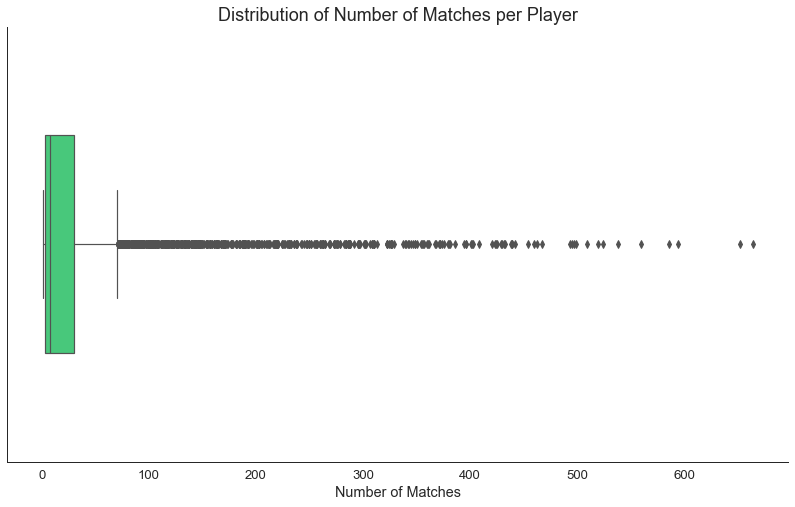

In [1215]:
sns.boxplot(x="Mat", data=players_df, orient="h", color="#33dd77", width=0.5)
sns.despine(left=False, bottom=False)
plt.title('Distribution of Number of Matches per Player', fontsize=18)
plt.xlabel('Number of Matches')

The boxplot above shows the distribution of the number of matches played per player. The data is reasonable since it shows that every player has played at least one match and the maximum numner of matches played by any single player does not exceed 700. The distribution is significantly skewed as evidenced by the fact that more than 75% of the players have played less than 50 matches. 

Text(0.5, 0, 'Number of Runs Scored Per Player')

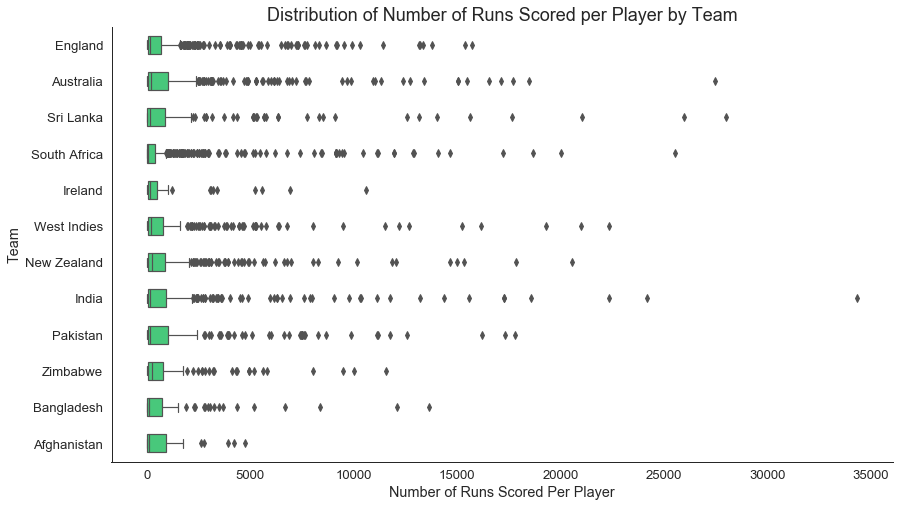

In [1216]:
sns.boxplot(x="Runs", y="Team", data=players_df, orient="h", color="#33dd77", width=0.5)
sns.despine(left=False, bottom=False)
plt.title('Distribution of Number of Runs Scored per Player by Team', fontsize=18)
plt.xlabel('Number of Runs Scored Per Player')

The boxplot above shows the distribution of number of runs score per player. Even if several outliers are visible based on the 150% range interquartile criteria, it is notable that all the values make sense as there are no negative values or extreme values. 

The highest number of runs scored by a single player is around 34,000 as represented by the far-right dot in the boxplot for Team India. Any avid fan of the game of Cricket knows that this dot pertains to Sachin Tendulkar - one of the greatest players of all time. 

Text(0.5, 0, 'Highest Score Achieved by Player')

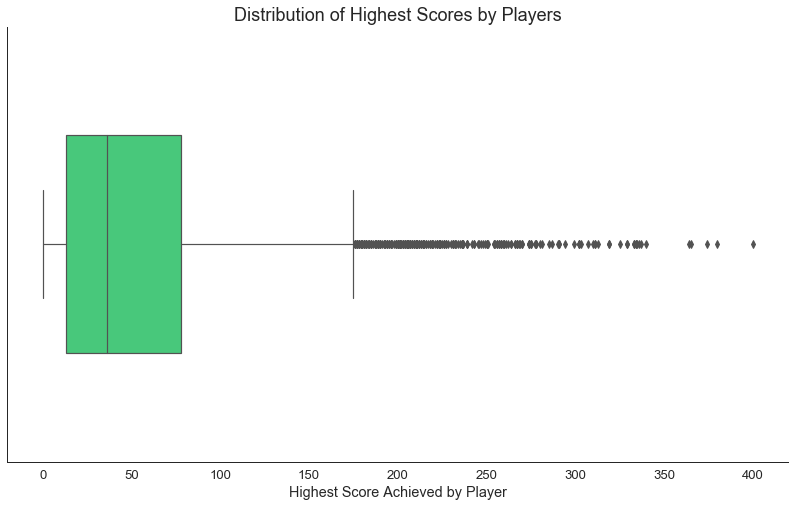

In [1217]:
sns.boxplot(x="HS", data=players_df, orient="h", color="#33dd77", width=0.5)
sns.despine(left=False, bottom=False)
plt.title('Distribution of Highest Scores by Players', fontsize=18)
plt.xlabel('Highest Score Achieved by Player')

The boxplot above shows the distribution of the highest scores achieved by players throughout their careers. The values range from 0 to a little less than 400. Around 50% of the data falls between 10 and 80 and the average highest score is around 40. No negative values or unreasonably high values are found. 

Text(0.5, 0, 'Batting Average of Player')

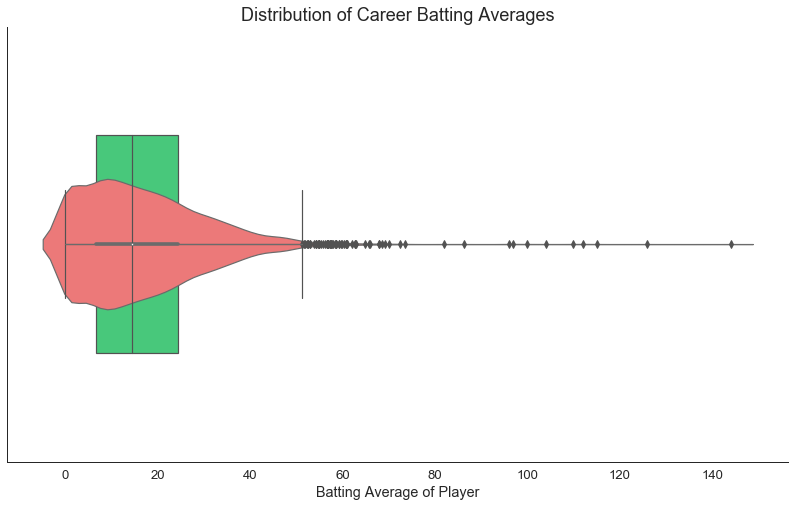

In [1218]:
sns.boxplot(x="Bat Av", data=players_df, orient="h", color="#33dd77", width=0.5)
sns.violinplot(x="Bat Av", data=players_df, orient="h", color="#ff6666", width=0.3)
sns.despine(left=False, bottom=False)
plt.title('Distribution of Career Batting Averages', fontsize=18)
plt.xlabel('Batting Average of Player')

For the batting average of players, the data ranges from 0 to not more than 150 - which appears reasonable. More than 75% of the players have a batting average of less than 25. Several outliers are found but these points represent exceptional players with high batting averages.

Text(0.5, 0, 'Number of Wickets Taken Per Player')

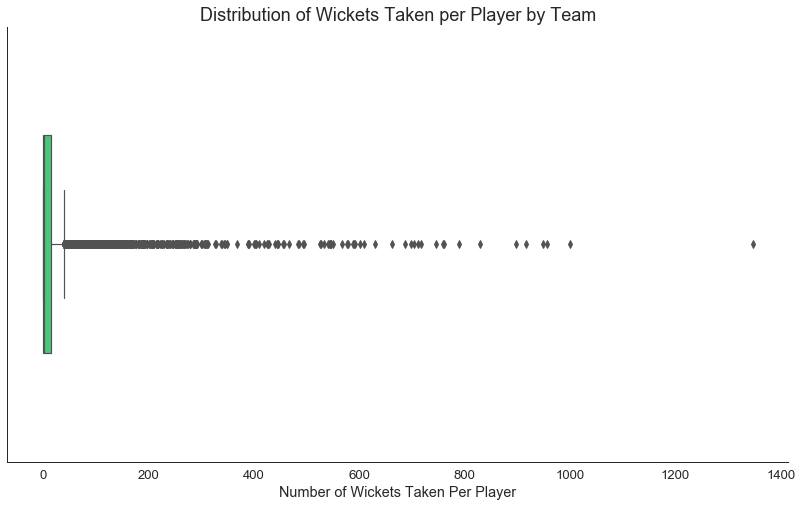

In [1219]:
sns.boxplot(x="Wkts", data=players_df, orient="h", color="#33dd77", width=0.5)
sns.despine(left=False, bottom=False)
plt.title('Distribution of Wickets Taken per Player by Team', fontsize=18)
plt.xlabel('Number of Wickets Taken Per Player')

The boxplot above shows the distribution of number of wickets taken per player. Even if several outliers are visible based on the 150% range interquartile criteria, it is notable that all the values make sense as they range from 0 to 800 and there are no negative values or extreme values. 

The highest number of wickets taken by a single player is a little less than 1400 as represented by the far-right dot in the boxplot. This point pertains to Mutthiah Muralitharan of Sri Lanka - one of the greatest spin bowlers of all time.  

Text(0.5, 0, 'Bowling Average of Player')

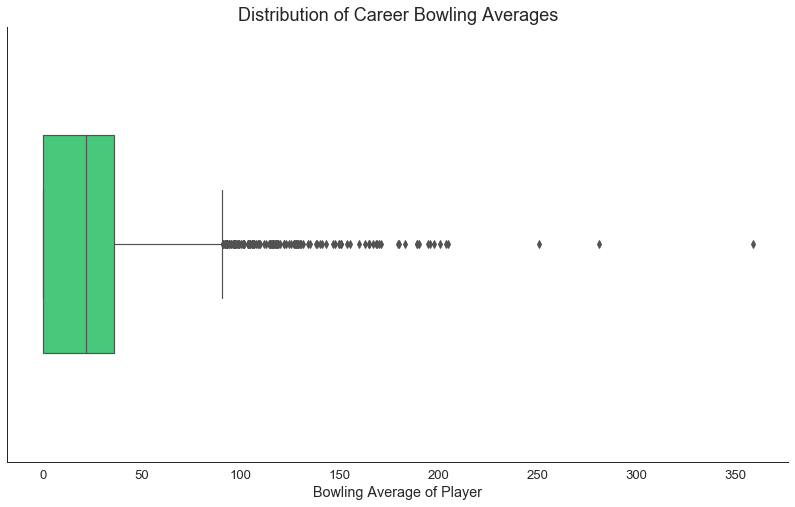

In [1220]:
sns.boxplot(x="Bowl Av", data=players_df, orient="h", color="#33dd77", width=0.5)
sns.despine(left=False, bottom=False)
plt.title('Distribution of Career Bowling Averages', fontsize=18)
plt.xlabel('Bowling Average of Player')

For the bowling average of players, the data ranges from 0 to about 350 which makes sense. More than 50% of the players have a bowling average of less than 40. Unlike batting averages, the lower the bowling average the better. Several outliers are found but these points likely represent non-bowlers who are expected to have weak bowling averages.

Text(0.5, 0, 'Career Length of Player in Years')

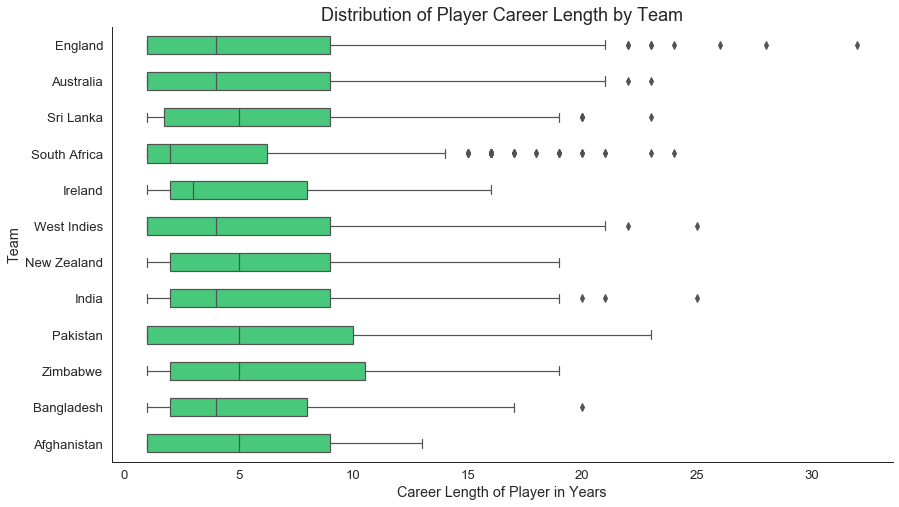

In [1221]:
sns.boxplot(x="career_length", y="Team", data=players_df, orient="h", color="#33dd77", width=0.5)
sns.despine(left=False, bottom=False)
plt.title('Distribution of Player Career Length by Team', fontsize=18)
plt.xlabel('Career Length of Player in Years')

The visualization above shows the distribution of career length by team. Only a few statistical outliers exist, generally reflected by players who have had a career spanning more than 15 years. England and South Africa in particular appear to have more of such distinctive players while players from Ireland tend to retire much earlier than the rest of the teams. While no single player has had a career of more than 35 years, it appears that 75% of the players do not play for more than 10 years. Despite the visible outliers, the distribution is reasonable.

Overall, there were no undesirable data points detected as far as outliers are concerned. While several statistical outliers were observed, all these data points were deemed to be valid for analysis. 

## - The Rules: Analysis Assumptions

All analyses are hinged on the following assumptions:
 - The data represents combined records for all-time players and matches across all three formats of the game: Tests, One-Day Internationals, and T20 Internations. Women's Tests, ODIs, and T20 matches are not included. 
 - The analysis mainly covers the 12 main cricketing nations that are full members of the International Cricket Council (ICC). These full member nations represent their respective geographic regions. These teams are qualified to play all three formats of the game and are listed in the ICC official rankings (Williamson, 2017).
 - Observed visual differences in variables do not necessarily indicate statistically significant differences unless tested. Similarly, strong correlations and associations do not necessarily indicate causation. 
 - Green and red are the preferred colors of choice for visualizations to support the "Cricket" theme of the report. The red color choice does not necessarily indicate negative values or downtrends.
 - The data is updated as of 14 February 2021; the data sources are set to be dynamic and can be updated anytime by running the code in the data acquisition section above.

## - Play Time: Exploratory Data Analysis

Now that the data is fundamentally prepared and ready for analysis, the exploratory data analysis and remaining data analytics process can be smoothly carried out.

###  - Distributions

As an initial step in EDA, the distributions of several key variables to be used in analysis are examined. This helps to get a feel of the data and inspect whether any skewness exists.

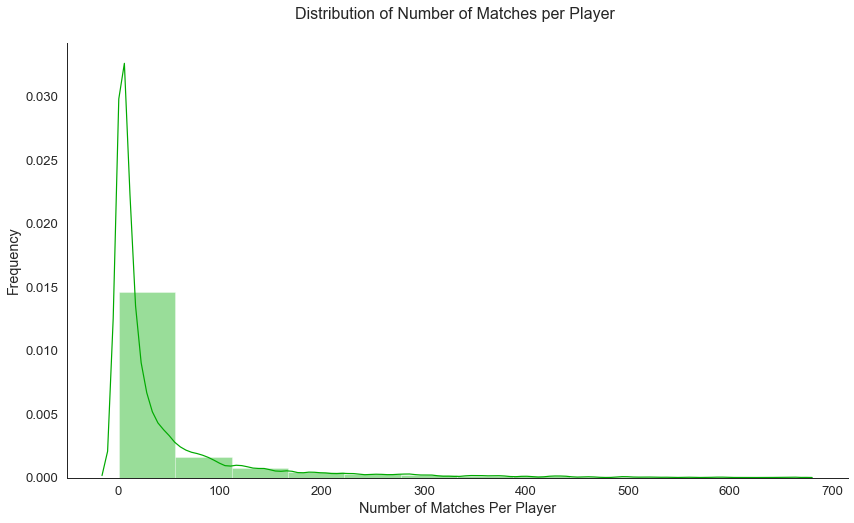

In [514]:
sns.distplot(players_12teams_df['Mat'], color="#00aa00", hist=True, bins=12)
plt.title("Distribution of Number of Matches per Player \n", size=16)
plt.xlabel("Number of Matches Per Player")
plt.ylabel("Frequency")
sns.despine(left=False, bottom=False)

The graph above shows the distribution of the total number of matches played per player. The distribution is skewed to the right and does not appear to be normally distributed. 

This histogram also shows that most players do not play more than 100 matches in their lifetime - which is quite alarming as it's also visible that some exceptional players are capable of playing north of 500 matches across all three formats. 

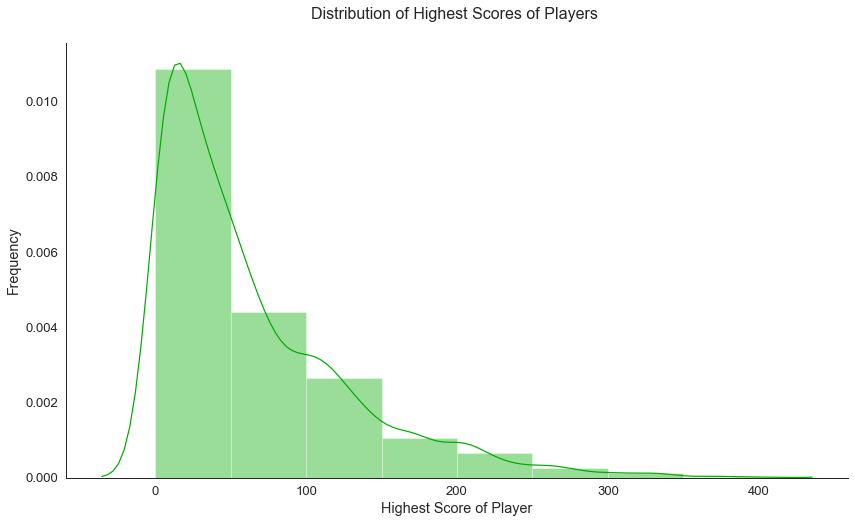

In [515]:
sns.distplot(players_12teams_df['HS'], color="#00aa00", hist=True, bins=8)
plt.title("Distribution of Highest Scores of Players \n", size=16)
plt.xlabel("Highest Score of Player")
plt.ylabel("Frequency")
sns.despine(left=False, bottom=False)

The highest score variable contains information about highest score each player has ever scored in any match. The graph above shows the distribution of highest scores achieved by players. The data for this column is moderately skewed to the right. It can also be inferred that most players are not likely have highest scores more than 200.

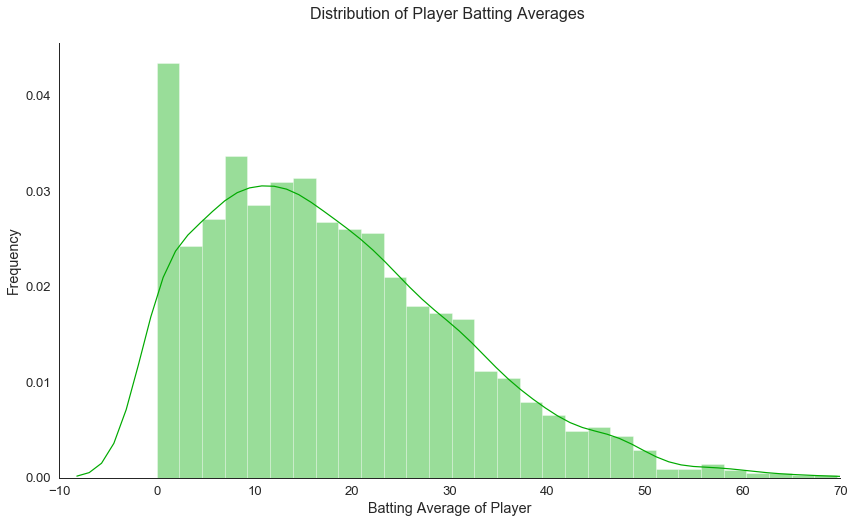

In [532]:
sns.distplot(players_12teams_df['Bat Av'], color="#00aa00", hist=True, bins=int(np.sqrt(len(players_12teams_df))))
plt.title("Distribution of Player Batting Averages \n", size=16)
plt.xlabel("Batting Average of Player")
plt.ylabel("Frequency")
plt.xlim(-10,70)
sns.despine(left=False, bottom=False)

In [533]:
isnormal(players_12teams_df['Bat Av'])

Test for Normality Results: Statistic = 1010.85 , p-value = 3.14484e-220

The null hypothesis can be rejected - the variable is normally distributed.


A player's batting average is simply the total number of runs he has scored in his career divided by the number of matches played. 

As compared to the number of matches and highest scores variables, the distribution of batting averages is less skewed - although still slightly skewed to the right. The test for normality reveals that it is normally distributed. That said, the histogram may be more indicative of the distribution compared to the normality test given the high sample size which tends to push down p-values significantly. 

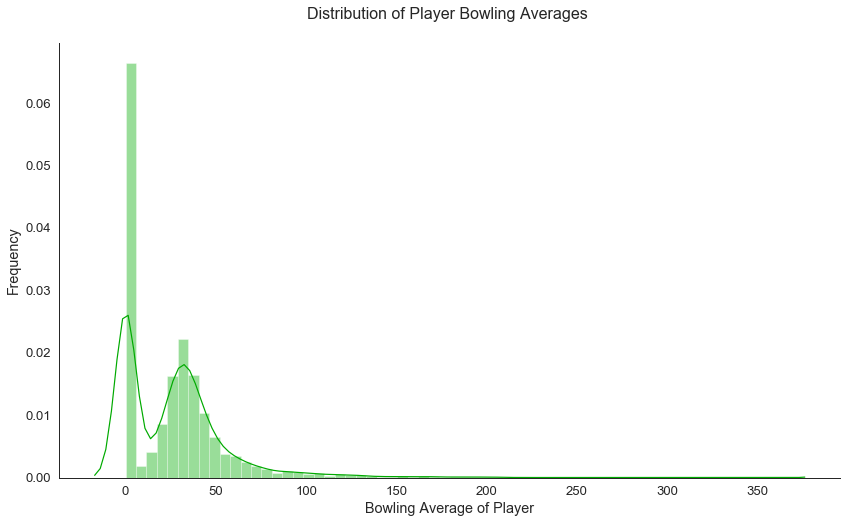

In [540]:
sns.distplot(players_12teams_df['Bowl Av'], color="#00aa00", hist=True, bins=int(np.sqrt(len(players_12teams_df))))
plt.title("Distribution of Player Bowling Averages \n", size=16)
plt.xlabel("Bowling Average of Player")
plt.ylabel("Frequency")
sns.despine(left=False, bottom=False)

Bowling average measures the average number of runs a bowler concedes per wicket taken. As such, lower values are more desirable. The histogram above shows a rather peculiar distribution that is bimodal in nature. Most players have a bowling average of 0 but outside this value, the distribution appears to be symmetric and normal for values greater than 0.

Not all Cricket players bowl, and if a player has never bowled a ball in his life, the bowling average would be zero or blank. As such, it is reasonable to see that the mode of this distribution is zero. The second mode appears to be around the 20 to 30 range. 

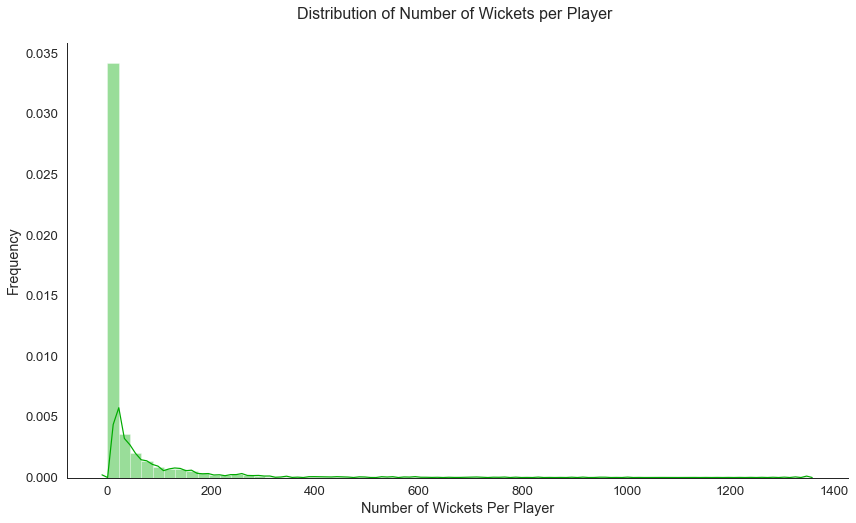

In [541]:
sns.distplot(players_12teams_df['Wkts'], color="#00aa00", hist=True, bins=int(np.sqrt(len(players_12teams_df))))
plt.title("Distribution of Number of Wickets per Player \n", size=16)
plt.xlabel("Number of Wickets Per Player")
plt.ylabel("Frequency")
sns.despine(left=False, bottom=False)

The graph above shows the distribution of the number of wickets taken per player. The graph is considerably skewed to the right. This is consistent with what the boxplot for this variable revealed in the previous section. Because a handful of bowlers have taken a significantly high number of wickets over their careers, the data is skewed to account for these exceptional bowlers. Otherwise, it is notable in the histogram that most players have not taken more than 100 wickets in their careers.

In [543]:
players_12teams_df['Wkts'].describe()

count    3918.000000
mean       33.490046
std        88.751369
min         0.000000
25%         0.000000
50%         3.000000
75%        23.000000
max      1347.000000
Name: Wkts, dtype: float64

The describe process above reveals 1347 as the highest wickets taken by a single player with the mean just being 33.5. The median is only 3 wickets which is far less than the mean - this further emphasizes the skewness of this variable.

Text(0.5, 0, 'Number of Catches by Player')

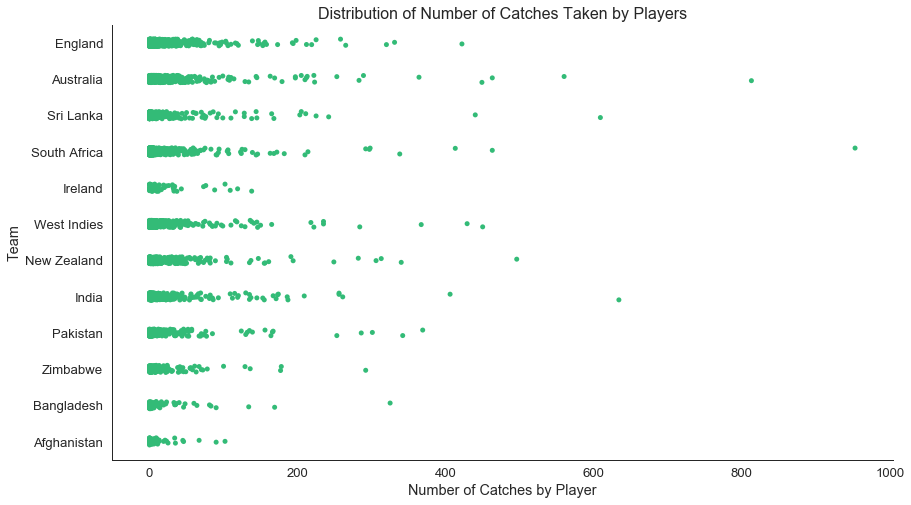

In [549]:
sns.stripplot(y="Team", x="Ct", data=players_df, orient="h", color="#33bb77", jitter=True)
sns.despine(left=False, bottom=False)
plt.title('Distribution of Number of Catches Taken by Players', fontsize=16)
plt.xlabel('Number of Catches by Player')

Aside from batting and bowling, fielding is also extremely important in Cricket. One statistic that separates good fielders from bad fielders is the number of catches taken. The points in the visualization above represent the number of times a player succesfully catches a ball which results in a wicket. 

The distribution shows that most of the points are less than 100 and this is consistent across teams. Only two players have more than 600 catches and these are likely wicketkeepers. It is also notable that England, Australia, and South Africa have more points gravitating to the right as well as outliers in that direction. 

Text(0, 0.5, '')

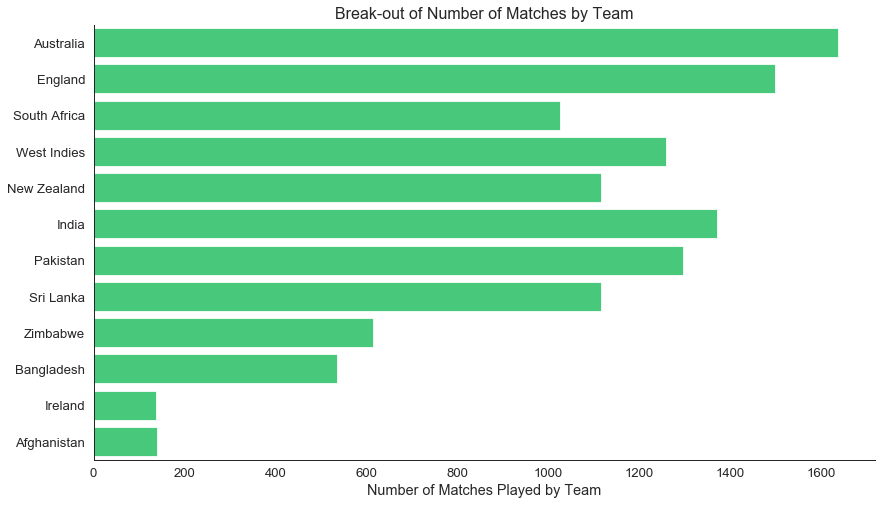

In [561]:
sns.countplot(y = 'Team', data = matches_12teams_df, orient="h", color="#33dd77")
sns.despine(left=False, bottom=False)
plt.title('Break-out of Number of Matches by Team', fontsize=16)
plt.xlabel('Number of Matches Played by Team')
plt.ylabel('')

The graph above breaks out the total number of Cricket matches ever played by each of the 12 major Cricketing nations. At a country level, the distribution is notably unbalanced. Some countries have played a high number of matches while others low. A lot factors such as a country's sports budget, location constraints, opposition willingness, schedule planning, and public demand affect the number of matches a country plays.

It can immediately be seen that England and Australia have played the most matches followed by India and Pakistan. It comes as no surprise that these four teams form two of the greatest rivalry pairs in Cricket. 

Text(0, 0.5, 'Number of Matches')

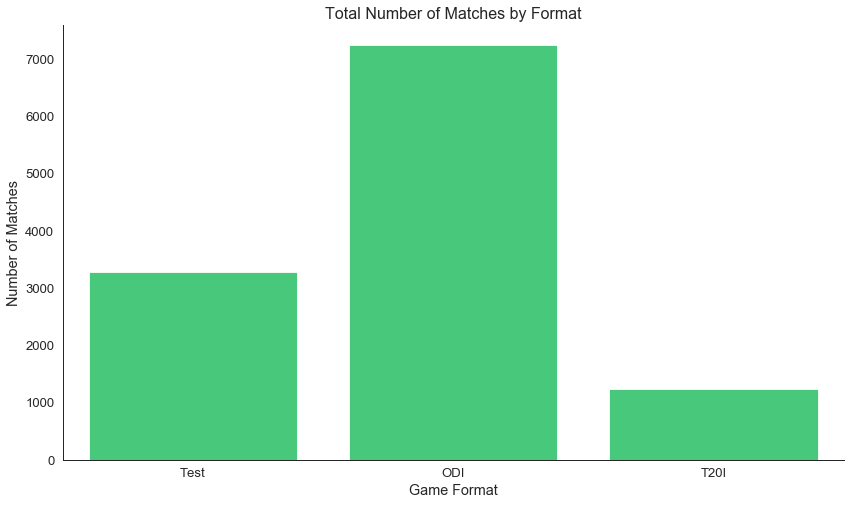

In [661]:
sns.countplot(x = 'Format', data = matches_12teams_df, orient="v", color="#33dd77")
sns.despine(left=False, bottom=False)
plt.title('Total Number of Matches by Format', fontsize=16)
plt.xlabel('Game Format')
plt.ylabel('Number of Matches')

The graph above shows how the number of matches are distributed by different game formats. One-day Internationals (ODIS) are clearly the most popular format, followed by Test matches and then T20 Internationals. ODIs and T20Is are relatively newer formats compared to test matches, yet there are a higher number of ODI matches played compared to Test matches.   

Text(0.5, 0.98, 'Joint Distribution Plot of Number of Runs Scored and Batting Average')

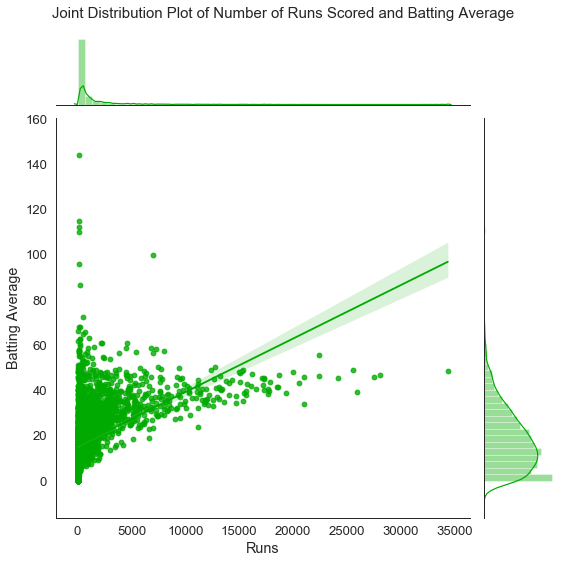

In [562]:
sns.jointplot( "Runs", "Bat Av", players_12teams_df, kind='reg', height=8,  color="#00aa00");
plt.xlabel('Runs')
plt.ylabel('Batting Average')
plt.subplots_adjust(top=0.93)
plt.suptitle('Joint Distribution Plot of Number of Runs Scored and Batting Average', fontsize = 15)

The joint plot above generates the distribution of the number of runs scored and batting average per player. While both variables appear skewed, the number of runs scored is skewed to a larger degree. In addition, the best-fit line shows a positive association. This is expected to an extent since the batting average is likely to increase as a player scores more runs, but intuitively it may plateau or decrease after a certain level of experience. 

To further explore this association, a correlation test is conducted:

In [564]:
linreg(players_12teams_df['Runs'], players_12teams_df['Bat Av'])

Linear regression output: 

Equation: y = 0.0023636625152754437 x  +  15.599364371119904 
Correlation coefficient (r):  0.46463730080217297 
p-value 4.270605784185989e-209 
Standard error: 7.198452681742686e-05


The test shows a moderate correlation of 0.46 and a statistically significant p-value that is close to zero.

Text(0, 0.5, 'Cumulative Density')

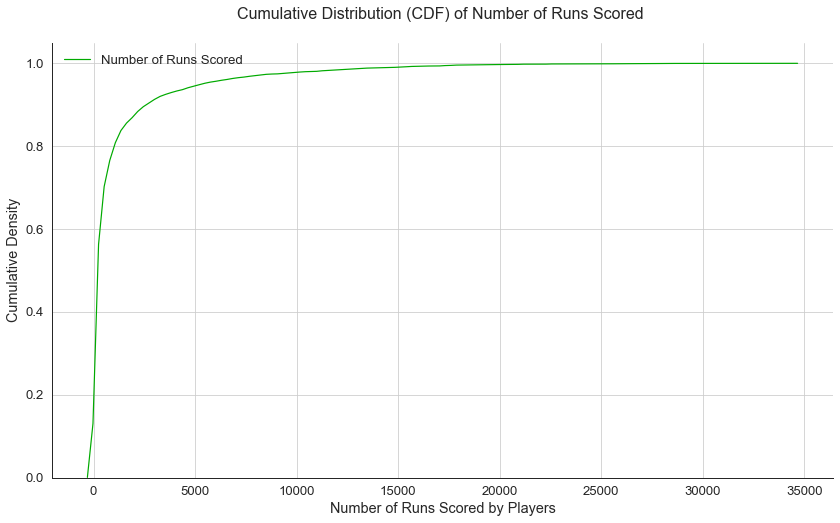

In [568]:
sns.kdeplot(players_12teams_df['Runs'], cumulative=True, label='Number of Runs Scored', color="#00aa00")
plt.title("Cumulative Distribution (CDF) of Number of Runs Scored \n", size=16)
sns.despine(left=False, bottom=False)
plt.grid(True)
plt.xlabel("Number of Runs Scored by Players")
plt.ylabel("Cumulative Density")

The CDF plot on the number of runs scored reveals insights not directly visible in the histogram or kde plot.

 - 80% of the players have scored less than 2,500 runs throughout their Cricketing careers
 - Half (50%) of the players data falls between 0 and 1,000 runs
 - Only around 5% of players have scored more than 5,000 runs in their career
 - About 1% of players have scored more than 10,000 runs in their career

Text(0, 0.5, 'Cumulative Density')

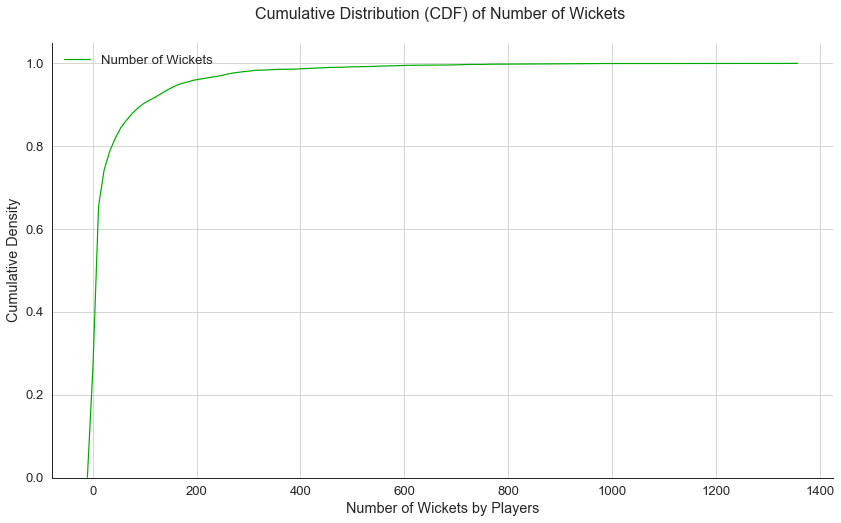

In [569]:
sns.kdeplot(players_12teams_df['Wkts'], cumulative=True, label='Number of Wickets', color="#00aa00")
plt.title("Cumulative Distribution (CDF) of Number of Wickets \n", size=16)
sns.despine(left=False, bottom=False)
plt.grid(True)
plt.xlabel("Number of Wickets by Players")
plt.ylabel("Cumulative Density")

The CDF plot for the number of wickets taken appears very similar to that for the number of runs scored. Around 90% of players have taken less than 100 total wickets and only a little under 5% of players have taken more than 200 wickets. That is, any bowler who has taken more than 200 wickets would sit in the 95th percentile for this statistic. 

Text(0, 0.5, 'Cumulative Density')

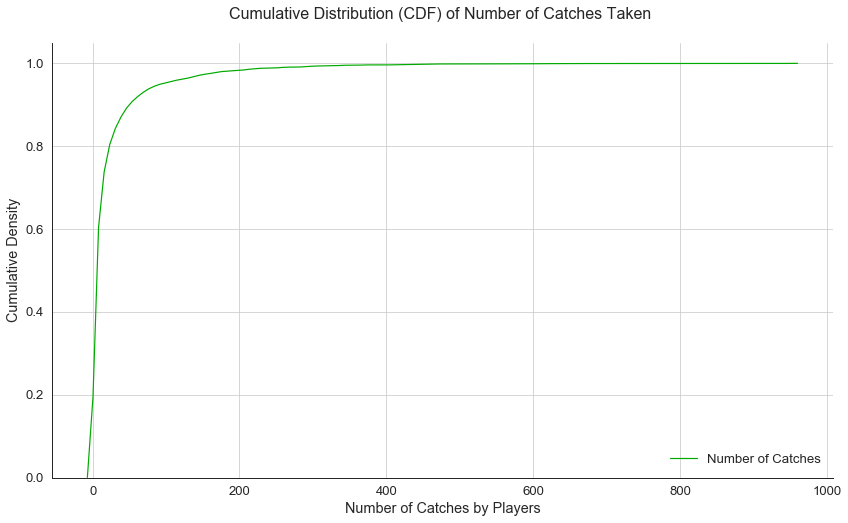

In [572]:
sns.kdeplot(players_12teams_df['Ct'], cumulative=True, label='Number of Catches', color="#00aa00")
plt.title("Cumulative Distribution (CDF) of Number of Catches Taken \n", size=16)
sns.despine(left=False, bottom=False)
plt.grid(True)
plt.xlabel("Number of Catches by Players")
plt.ylabel("Cumulative Density")

The CDF plot for the number of catches taken (a fielding metric) looks similar to both the number of runs and number of wickets taken which in turn are batting and bowling metrics, respectively. 90% of players have taken less than 100 catches and only around 1% have taken more than 200 catches. Wicketkeepers, fielders who are naturally likely to take more catches that result in wickets, form a big part of this top 1%. 

It is interesting to see similar distributions for the number of runs scored, wickets taken, and catches taken as these are arguably the biggest factors that affect a team's ability to win. 

Overall, most variables were found to be skewed to the right and only a few can be considered to normally distributed. This also means that when sum is not an option, median values should be preferred over mean values since most of the variables are skewed. There are a number of reasons that can be attributed to the skewness. Primarily, the data is considerably large and encompasses all-time Cricket data as far as players and matches go. Moreover, the level of complexity in Cricket naturally means there is higher dispersion which pushes data points away from each other. Players with different skill levels and playing styles coming from different teams and playing at different venues means that there are many factors that affect these data points. When there are exceptional or underperforming batters, bowlers, or fielders, they contribute to the skewness of this data while still remaining valid data points.

###  - Analytics and Insights

In this section, the data is explored at a deeper level to generate meaningful insights. 

Wall time: 0 ns


Text(0.5, 1.0, 'Total Number of Runs Scored by Team')

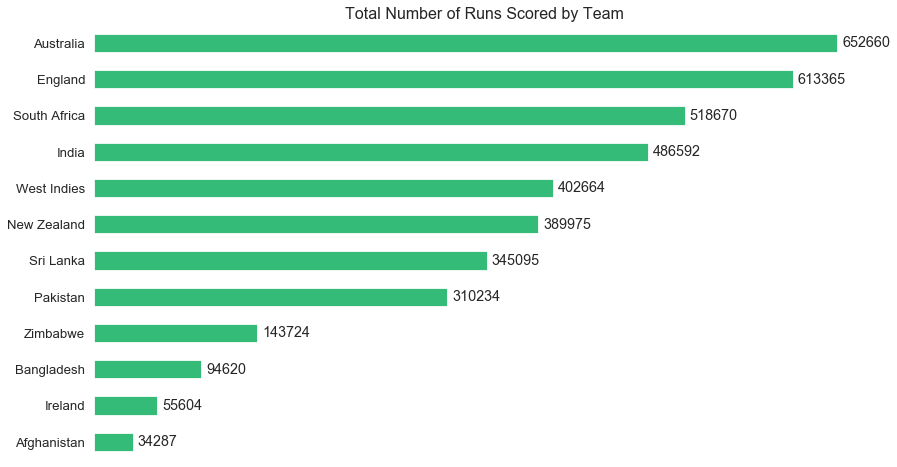

In [676] used 4.012 MiB RAM in 0.301s, peaked 2.137 MiB above current, total RAM usage 451.348 MiB


In [676]:
#aggregating data through pivot table

%time 
toprunsbyteam = players_12teams_df.pivot_table(values=['Runs'], index=['Team'], aggfunc='sum', 
                margins=False).sort_values('Runs', ascending=True)

#plotting data

ax = toprunsbyteam.plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Total Number of Runs Scored by Team", size=16)

The graph above shows the total number of runs scored by players belonging to each of the 12 major cricket teams. Players from Australia combined have scored a total of 652,660 runs -  the highest among the teams. To add context, Australia is often regarded as one of the best teams in the world. 

From the ranking it can be seen that the difference among the runs scored by teams is quite significant. For instance, Afghanistan - the lowest in the list - has scored only 34,287 runs in total which is below 10% that of Australia. To test this difference statistically, an ANOVA test is done among the country groups.

ANOVA Test: 
    
 - Ho: There is no difference in the number of runs scored by players between the 12 major cricket teams.
 - Ha: Not all of the means are same across the 12 cricket teams.

In [668]:
#using anova custom function to compare difference between country groups:

%time 

anova(players_12teams_df[players_12teams_df['Team']=='Australia'].Runs, 
      players_12teams_df[players_12teams_df['Team']=='Pakistan'].Runs,
      players_12teams_df[players_12teams_df['Team']=='India'].Runs,
      players_12teams_df[players_12teams_df['Team']=='Sri Lanka'].Runs,
      players_12teams_df[players_12teams_df['Team']=='New Zealand'].Runs,
      players_12teams_df[players_12teams_df['Team']=='England'].Runs,
      players_12teams_df[players_12teams_df['Team']=='South Africa'].Runs,
      players_12teams_df[players_12teams_df['Team']=='Afghanistan'].Runs,
      players_12teams_df[players_12teams_df['Team']=='Bangladesh'].Runs,
      players_12teams_df[players_12teams_df['Team']=='West Indies'].Runs,
      players_12teams_df[players_12teams_df['Team']=='Zimbabwe'].Runs,
      players_12teams_df[players_12teams_df['Team']=='Ireland'].Runs)

Wall time: 0 ns
ANOVA results: 

F-statistic = 2.55783  P-Value = 0.00316106
Decision: Reject null hypothesis
In [668] used 3.832 MiB RAM in 0.038s, peaked 0.000 MiB above current, total RAM usage 410.621 MiB


The ANOVA result validates what the visual EDA process revealed. The p-value of 0.003, much below 0.05, indicates that the players between the 12 major countries differ in their nunmber of runs scored.

Text(0.5, 1.0, 'Total Number of Wickets Taken by Team')

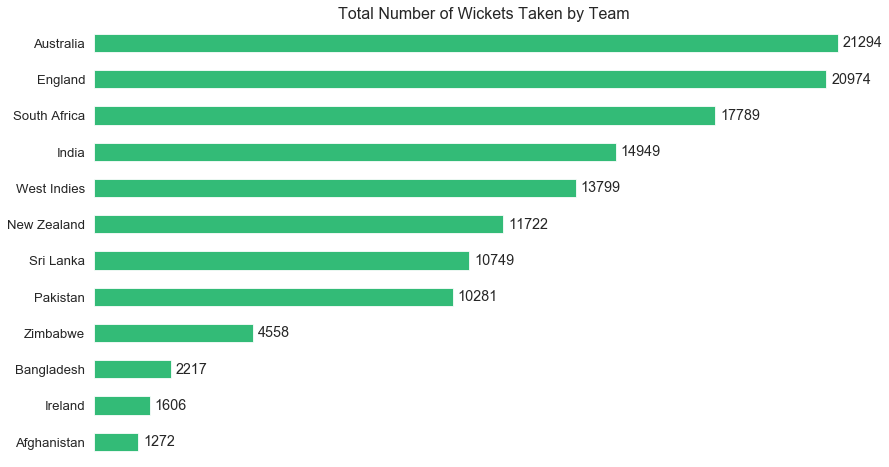

In [1257]:
#aggregating data for plot

topwktsbyteam = players_12teams_df.pivot_table(values=['Wkts'], index=['Team'], aggfunc='sum', 
                margins=False).sort_values('Wkts', ascending=True)

#plotting data

ax = topwktsbyteam.plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Total Number of Wickets Taken by Team", size=16)

The bar plot above shows the total number of wickets by players of the different teams. The results align very closely with the previous chart for the number of runs scored. In fact, the order is exactly the same which is remarkable. Australia is again the leading team when it comes to wickets taken. Afghanistan is also at the bottom again. 

Text(0.5, 1.0, 'Total Number of 100s Scored by Team')

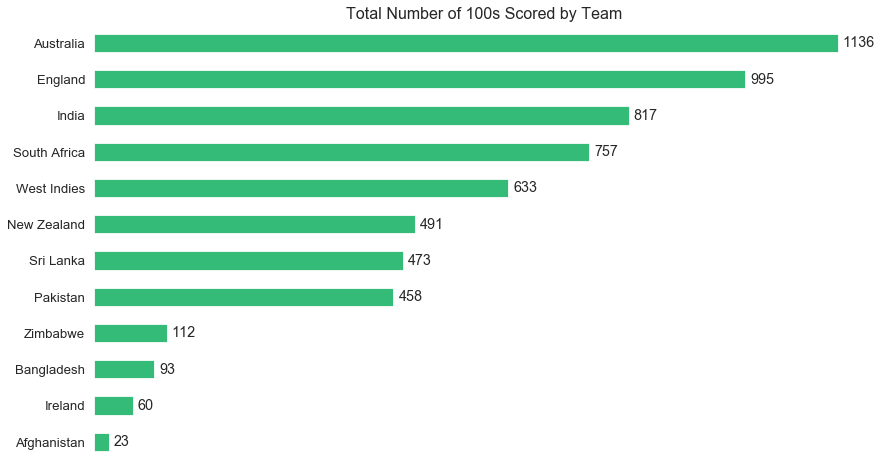

In [1258]:
#aggregating data for plot

top100sbyteam = players_12teams_df.pivot_table(values=['100'], index=['Team'], aggfunc='sum', 
                margins=False).sort_values('100', ascending=True)

#plotting data

ax = top100sbyteam.plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Total Number of 100s Scored by Team", size=16)

The chart above shows the total number of 100s scored by players of each team. Australia is the leading country for this metric as well, with over a 1000 hundreds scored by its players.  

Text(0.5, 1.0, 'Total Number of Field Catches by Team')

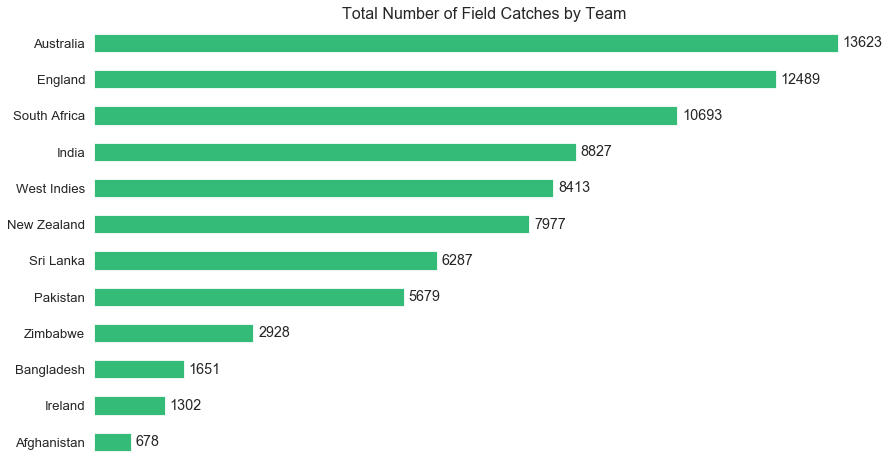

In [1259]:
#aggregating data for plot

topcatchesbyteam = players_12teams_df.pivot_table(values=['Ct'], index=['Team'], aggfunc='sum', 
                margins=False).sort_values('Ct', ascending=True)

#plotting data

ax = topcatchesbyteam.plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Total Number of Field Catches by Team", size=16)


The graph above shows the number of catches by team. Australia has the most number of catches, followed by England, and then South Africa.

Text(0.5, 1.0, 'Median Batting Average of Players by Team')

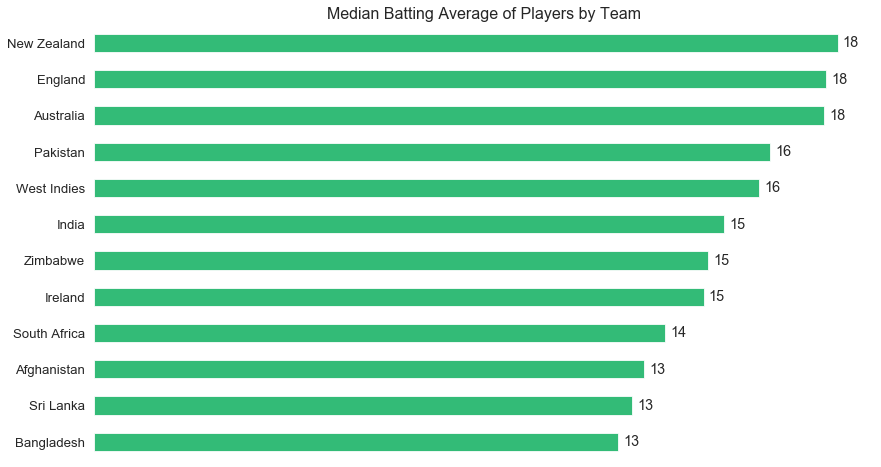

In [589]:
#aggregating data for plot

batavbyteam = players_12teams_df.pivot_table(values=['Bat Av'], index=['Team'], aggfunc='median', 
                margins=False).sort_values('Bat Av', ascending=True)

#plotting data

ax = batavbyteam.plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Median Batting Average of Players by Team", size=16)

While the the number of runs scored may be influenced largely by the number of matches a team plays relative to other countries, the batting average is not. The chart above shows that New Zealand, England, and Australia are tied for the highest median batting average. Surprsingly, South Africa - arguably one of the best teams - appears at the bottom half of the chart.  

Text(0.5, 1.0, 'Median Bowling Average of Players by Team')

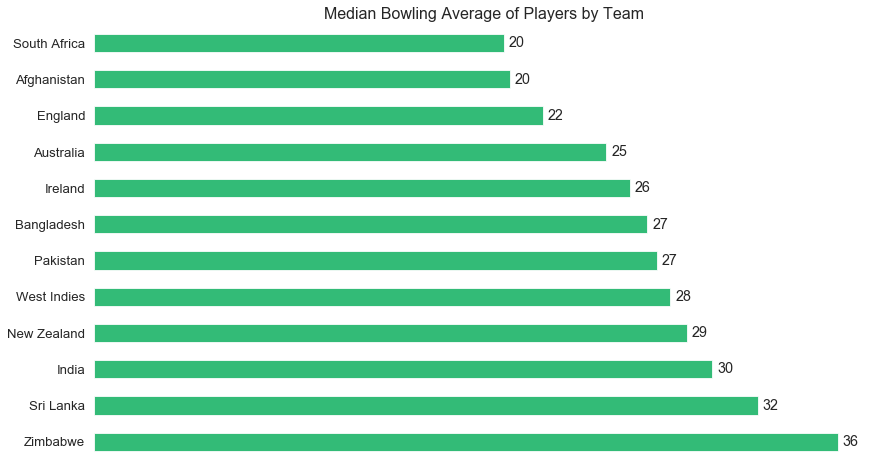

In [591]:
#aggregating data for plot

bowlavbyteam = players_12teams_df.pivot_table(values=['Bowl Av'], index=['Team'], aggfunc='median', 
                margins=False).sort_values('Bowl Av', ascending=False)

#plotting data

ax = bowlavbyteam.plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Median Bowling Average of Players by Team", size=16)

Similarly, the total number of wickets is influenced by the number of matches a team has played. Hence, the bowling average may be a better indicator of bowling performance, relatively speaking. For bowling averages, the lower the number, the better.

While South Africa appeared at the bottom for batting average, the chart above shows that South Africa, tied with Afghanistan, has the best bowling average of 20 (i.e only 20 runs conceded for every wicket taken). This may mean that South Africa is stronger in bowling compared to batting. 

It is notable that New Zealand appears at the bottom of this chart but was the best team for batting averages. This might indicate that New Zealand's strength lies in its batting. Moreover, India and Sri Lanka both have one of the worst bowling averages despite being strong teams overall. Bowling may be an area for improvement for both these teams. 

Text(0.5, 1, 'Average Player Career Span By Team')

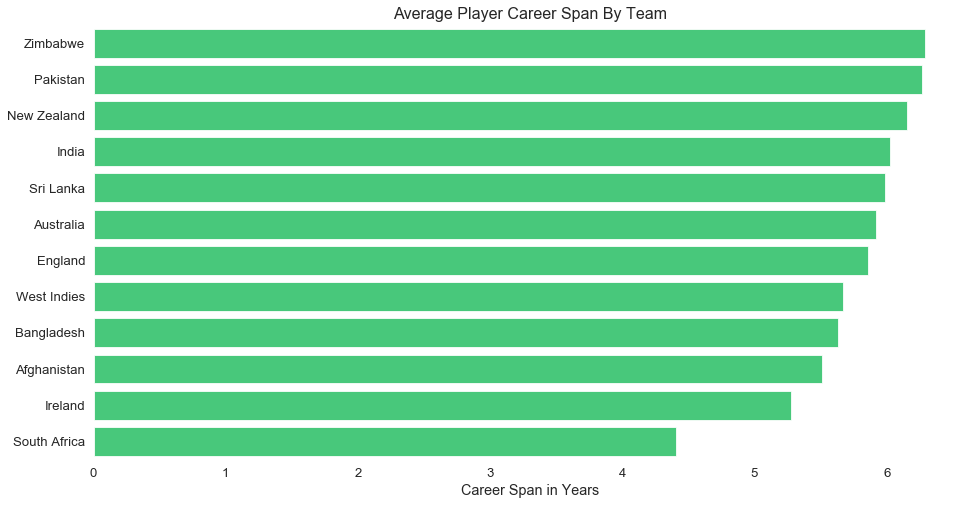

In [601]:
#aaggregating data

topspanbyteam = players_12teams_df.pivot_table(values=['career_length'], index=['Team'], aggfunc='mean', 
                margins=False).sort_values('career_length', ascending=False)
topspanbyteam.reset_index(inplace=True)

#plotting data

plot = sns.catplot(y="Team", x="career_length", estimator=np.sum,
            data=topspanbyteam,height=7, aspect=2/1, kind="bar", orient = "h", color = "#33dd77", ci=None)
sns.despine(left=True, bottom=True)
plt.xlabel("Career Span in Years")
plt.ylabel("")
plt.title("Average Player Career Span By Team", size=16)

Another interesting metric to look at is the career span of players. The chart above shows that players from Zimbabwe and Pakistan have the longest average career span of a little over 6 years while South African players have the lowest career span on average. A number of factors may affect a player's decision to retire early or late. Perhaps, a low average player career span for a team may indicate poor fitness levels or lower interest levels resulting from underdeveloped team dynamics.

An ANOVA test would illuminate if this visually perceivable difference is statistically significant. 

ANOVA Test: 
    
 - Ho: There is no difference in the career span of players between the 12 major cricket teams.
 - Ha: Not all of the means are same across the 12 cricket teams.

In [677]:
#using anova custom function to compare difference between country groups:

%time
anova(players_12teams_df[players_12teams_df['Team']=='Australia'].career_length, 
      players_12teams_df[players_12teams_df['Team']=='Pakistan'].career_length,
      players_12teams_df[players_12teams_df['Team']=='India'].career_length,
      players_12teams_df[players_12teams_df['Team']=='Sri Lanka'].career_length,
      players_12teams_df[players_12teams_df['Team']=='New Zealand'].career_length,
      players_12teams_df[players_12teams_df['Team']=='England'].career_length,
      players_12teams_df[players_12teams_df['Team']=='South Africa'].career_length,
      players_12teams_df[players_12teams_df['Team']=='Afghanistan'].career_length,
      players_12teams_df[players_12teams_df['Team']=='Bangladesh'].career_length,
      players_12teams_df[players_12teams_df['Team']=='West Indies'].career_length,
      players_12teams_df[players_12teams_df['Team']=='Zimbabwe'].career_length,
      players_12teams_df[players_12teams_df['Team']=='Ireland'].career_length)

Wall time: 0 ns
ANOVA results: 

F-statistic = 5.64246  P-Value = 4.57133e-09
Decision: Reject null hypothesis
In [677] used 0.020 MiB RAM in 0.024s, peaked 0.000 MiB above current, total RAM usage 451.367 MiB


The test reveals that the difference is indeed significant.

Text(0.5, 1.0, 'Top Players by Number of Runs Scored')

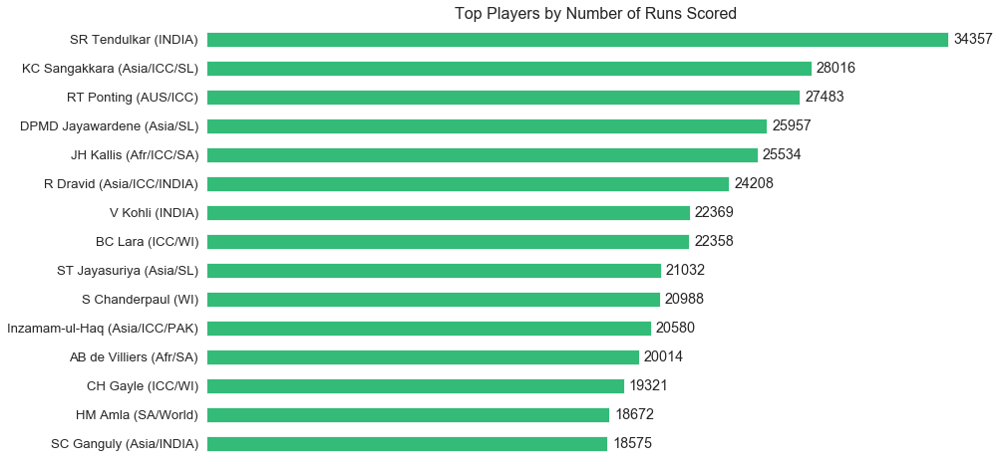

In [599]:
#aggregating data for plot

toprunsbyplayer = players_12teams_df.pivot_table(values=['Runs'], index=['Player'], aggfunc='sum', 
                margins=False).sort_values('Runs', ascending=False)

#plotting data

ax = toprunsbyplayer[:15].sort_values('Runs', ascending=True).plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Top Players by Number of Runs Scored", size=16)

Perhaps the best way to gauge the success of a batsman is to look at how many runs he has scored over his career. The chart above shows the top 15 players ranked by number of runs scored. Sachin Tendulkar of Team India has scored the highest number of runs across all three formats of the game: 34,357 runs. This is almost twice that of Saurav Ganguly who is 15th on the chart. 

Text(0.5, 1.0, 'Top Players by Number of Wickets Taken')

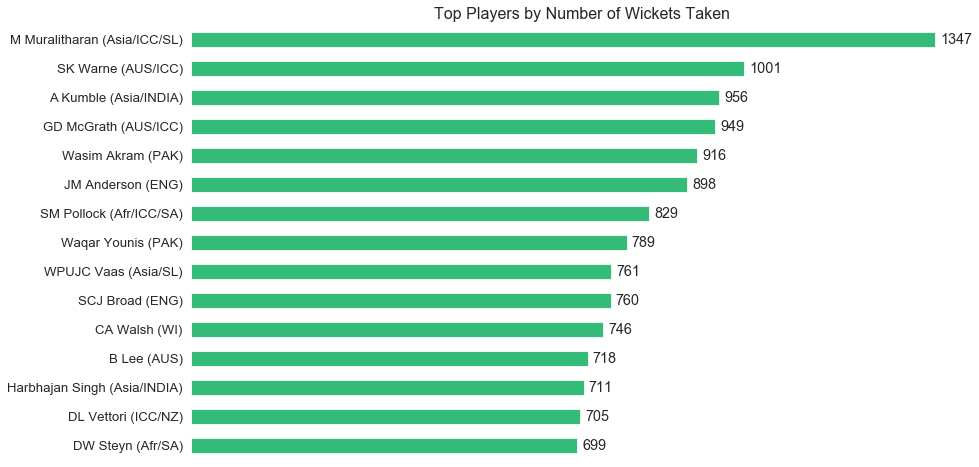

In [603]:
#aggregating data

topwktsbyplayer = players_12teams_df.pivot_table(values=['Wkts'], index=['Player'], aggfunc='sum', 
                margins=False).sort_values('Wkts', ascending=False)

#plotting data

ax = topwktsbyplayer[:15].sort_values('Wkts', ascending=True).plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Top Players by Number of Wickets Taken", size=16)

The plot above shows the best bowlers in terms of number of wickets taken. M Muralitharan of Sri Lanka has taken the highest number of wickets by a big margin. Only two bowlers in history have touched the 1000 wicket mark across the three formats. 

Text(0.5, 1.0, 'Top Players by Number of Hundreds Scored')

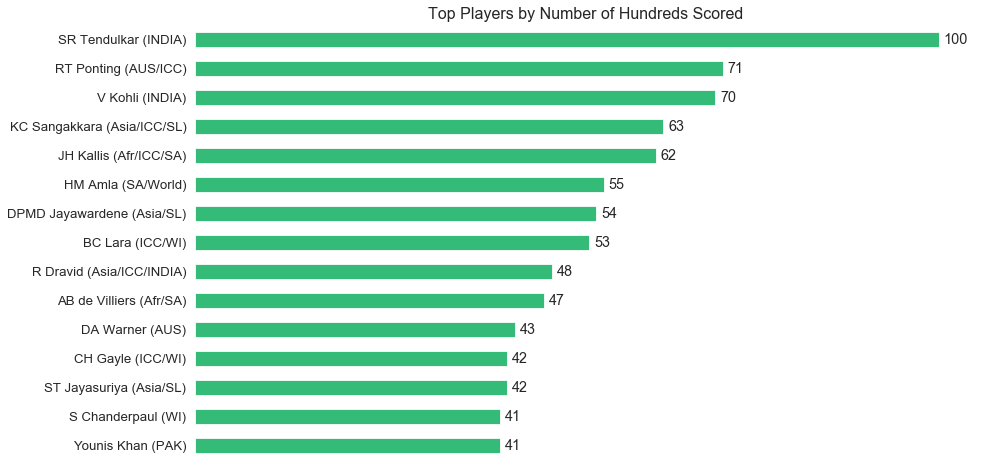

In [605]:
#aggregating data

top100sbyplayer = players_12teams_df.pivot_table(values=['100'], index=['Player'], aggfunc='sum', 
                margins=False).sort_values('100', ascending=False)

#plotting data

ax = top100sbyplayer[:15].sort_values('100', ascending=True).plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Top Players by Number of Hundreds Scored", size=16)

In Cricket, scoring a hundred runs in a single innings or match is a great achievement. As such, the number of hundreds scored is a key metric that indicates a batsman's skill level and his ability to bat for a long duration in addition to simply scoring runs. Sachin Tendular of India coincidentally scored a total of hundred 100s - which is the world record for most hundreds scored. Ricky Ponting of Australia comes in second and Virat Kohli of India is a close third. 

Text(0.5, 1.0, 'Top Players by Number of Catches Taken')

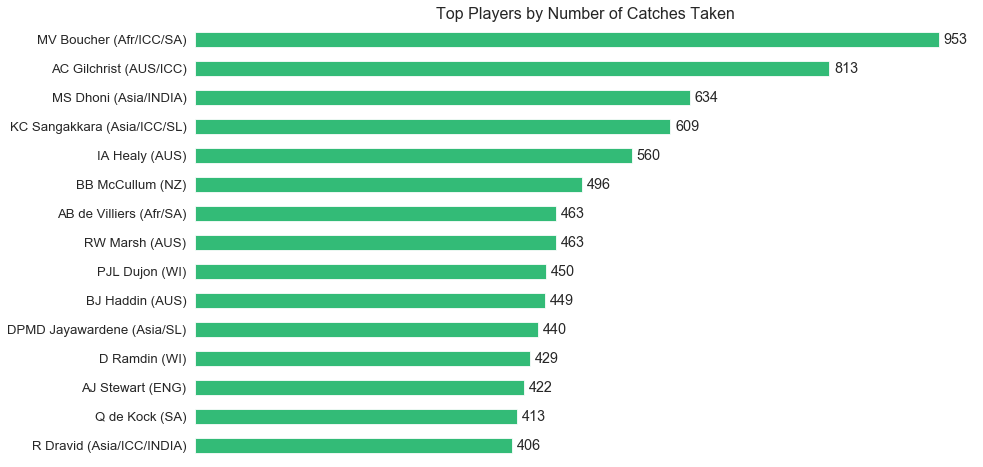

In [608]:
#aggregating data

topcatchesbyplayer = players_12teams_df.pivot_table(values=['Ct'], index=['Player'], aggfunc='sum', 
                margins=False).sort_values('Ct', ascending=False)
#plotting data

ax = topcatchesbyplayer[:15].sort_values('Ct', ascending=True).plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Top Players by Number of Catches Taken", size=16)

The graph above shows players with the highest number of catches taken. Catches can either be taken by fielders or the wicketkeeper. However, it is much more probable for a caught out wicket to result from a catch taken by a wicketkeeper than any of the 10 fielders. To add context, this is perhaps why most of the players in the chart above are/were wicketkeepers for their teams, although not stated in the graph. 

Text(0.5, 1.0, 'Top Players by Career Span in Years')

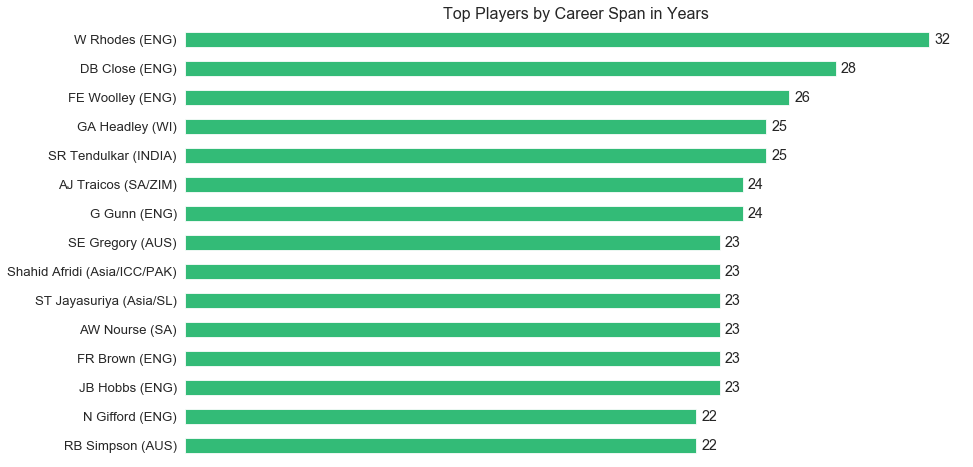

In [612]:
#aggregating data

topspanbyplayer = players_12teams_df.pivot_table(values=['career_length'], index=['Player'], aggfunc='sum', 
                  margins=False).sort_values('career_length', ascending=False)

#plotting data

ax = topspanbyplayer[:15].sort_values('career_length', ascending=True).plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Top Players by Career Span in Years", size=16)

In most cases, players with longer careers accumulate match experience that provides invaluable and intangible benefits to their teams. However, a long career span does not always mean a fruitful one. For example, a player with recurring injuries may have a longer career span.

The chart above reveals the players who have had the longest Cricketing careers. W Rhodes of England had the longest career spanning 32 years. In fact, the top three players are all from England and 7 out of 15 players in the visualization are from England. With this information, it would be interesting to see if the career span of English players is statistically longer than that of all other teams.

Upper-Tailed Hypothesis Test:
 - Ho: The mean career span of players from England is the same as that of other teams.
 - Ha: The mean career span of players from England is higher than that of other teams.

In [613]:
uppertailtest(players_12teams_df[players_12teams_df['Team']=='England'].career_length, 
              players_12teams_df[players_12teams_df['Team']!='England'].career_length)

Upper-tailed Hypothesis Test Results: 

Statistic = 1.16368  P-Value = 0.122414
Decision: Failed to reject null hypothesis


Given the p-value of 0.12 which is not statistically significant, there is not enough evidence to conclude that English players have higher career lengths than players from other teams. 

Wall time: 0 ns


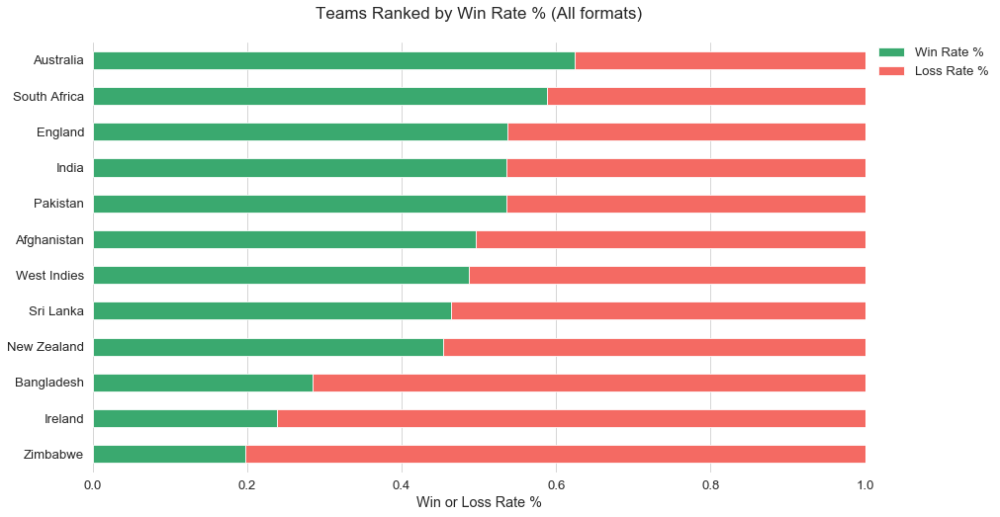

In [678] used 8.789 MiB RAM in 0.513s, peaked 0.160 MiB above current, total RAM usage 460.156 MiB


In [678]:
#aggregating and transforming data for plot

%time
wonmatches = pd.DataFrame(matches_12teams_df[matches_12teams_df['Result']=="won"]['Team'].value_counts())
wonmatches.index.names = ['Team']
wonmatches = wonmatches.rename(columns={"Team": "Won"})

lostmatches = pd.DataFrame(matches_12teams_df[matches_12teams_df['Result']=="lost"]['Team'].value_counts())
lostmatches.index.names = ['Team']
lostmatches = lostmatches.rename(columns={"Team": "Lost"})

allmatches = pd.DataFrame(matches_12teams_df['Team'].value_counts())
allmatches.index.names = ['Team']
allmatches = allmatches.rename(columns={"Team": "Total"})

winlossdf = pd.merge(wonmatches, lostmatches, on="Team")
winlossdf = pd.merge(winlossdf, allmatches, on="Team")
winlossdf['Win Rate %']=winlossdf['Won']/winlossdf['Total']
winlossdf['Loss Rate %']=winlossdf['Lost']/winlossdf['Total']

#plotting data

cmap = sns.diverging_palette(143, 14, l=62, s=85, as_cmap=True) #(Seaborn, 2021)

ax = winlossdf[['Win Rate %','Loss Rate %']].sort_values(by=['Win Rate %'], ascending=True).plot(
         kind="barh", 
         cmap=cmap,
         stacked=True, 
         legend=True)

plt.title('Teams Ranked by Win Rate % (All formats)\n', fontsize=17)
plt.ylabel('')
plt.xlabel('Win or Loss Rate %')
plt.xlim(0,1)
plt.legend(bbox_to_anchor=(1.01,1),borderaxespad=0)
noborders(ax)
plt.grid(True)

Like in any sport, the ultimate objective of every team is to win matches and tournaments. It follows that a team's Win Rate % is an incredibly important metric. The visualization above reveals how the different teams perform in terms of win rate percentage. 

Australia is the most formidable team with the highest win rate percetange having won a little over 60% of all its games, followed by South Africa at just under 60%. England, India, and Pakistan win roughly half of their games coming in at 3rd, 4th, and 5th respectively. Only these five out of the twelve teams have win rates over the 50% mark: the expected win rate percentage if all teams played at the same level, ceteris paribus. 

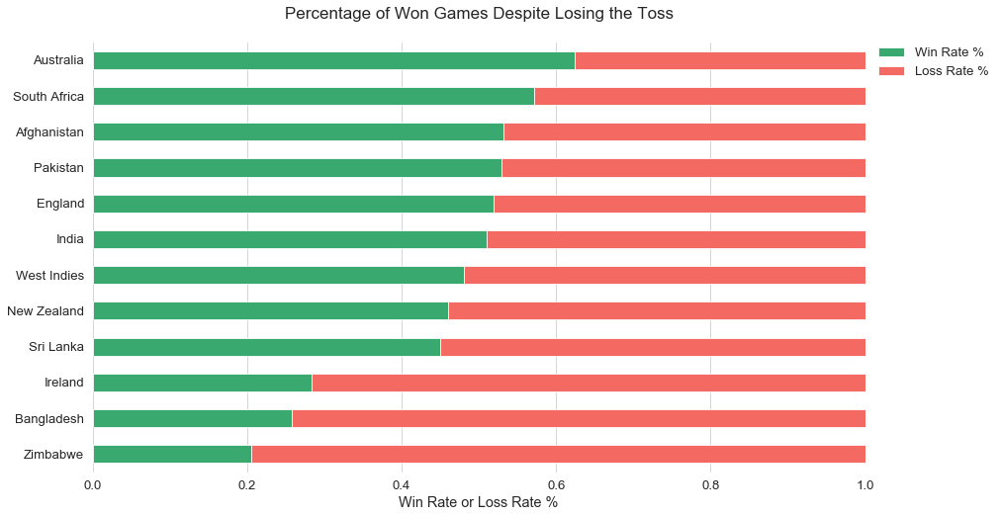

In [73]:
wontoss_df = matches_12teams_df[matches_12teams_df['Toss']=="lost"]

#aggregating and transforming data for plot

wonmatches = pd.DataFrame(wontoss_df[wontoss_df['Result']=="won"]['Team'].value_counts())
wonmatches.index.names = ['Team']
wonmatches = wonmatches.rename(columns={"Team": "Won"})
lostmatches = pd.DataFrame(wontoss_df[wontoss_df['Result']=="lost"]['Team'].value_counts())
lostmatches.index.names = ['Team']
lostmatches = lostmatches.rename(columns={"Team": "Lost"})
allmatches = pd.DataFrame(wontoss_df['Team'].value_counts())
allmatches.index.names = ['Team']
allmatches = allmatches.rename(columns={"Team": "Total"})
winlossdf = pd.merge(wonmatches, lostmatches, on="Team")
winlossdf = pd.merge(winlossdf, allmatches, on="Team")
winlossdf['Win Rate %']=winlossdf['Won']/winlossdf['Total']
winlossdf['Loss Rate %']=winlossdf['Lost']/winlossdf['Total']

#plotting data

cmap = sns.diverging_palette(143, 14, l=62, s=85, as_cmap=True) #(Seaborn, 2021)

ax = winlossdf[['Win Rate %','Loss Rate %']].sort_values(by=['Win Rate %'], ascending=True).plot(
         kind="barh", 
         cmap = cmap,
         legend=True,
         stacked=True,)

plt.title('Percentage of Won Games Despite Losing the Toss\n', fontsize=17)
plt.ylabel('')
plt.xlabel('Win Rate or Loss Rate %')
plt.xlim(0,1)
plt.legend(bbox_to_anchor=(1.01,1),borderaxespad=0)
noborders(ax)
plt.grid(True)

An interesting angle to further explore win rate percentages is to investigate how it is impacted by other variables. The chart above shows the win rate % for teams only in games where they won the toss and had the choice to either bat 1st or 2nd. This reveals the true importance of the toss and if it really affects outcomes.

The graph above closely coincides with the previous one in terms of win rate percentages and team rankings, with one exception; Afghanistan has a much higher win rate percentage after losing the toss. For the rest of the countries, the outcomes are similar. This could mean that the toss does not impact the result all that much. 

To find out the statistical significance, it would help to regress toss outcomes against match outcomes to see if any correlation exists.

In [ ]:
#Transforming data for toss-to-win data and other analyses

matches_12teams_forhm = matches_12teams_df.copy()
matches_12teams_forhm['Result'] = matches_12teams_forhm['Result'].str.replace('won','1')
matches_12teams_forhm['Result'] = matches_12teams_forhm['Result'].str.replace('lost','0')
matches_12teams_forhm['Toss'] = matches_12teams_forhm['Toss'].str.replace('won','1')
matches_12teams_forhm['Toss'] = matches_12teams_forhm['Toss'].str.replace('lost','0')
matches_12teams_forhm['Result'] = matches_12teams_forhm['Result'].apply(pd.to_numeric)
matches_12teams_forhm['Toss'] = matches_12teams_forhm['Toss'].apply(pd.to_numeric)

In [616]:
#correlation and regression test

linreg(matches_12teams_forhm['Toss'], matches_12teams_forhm['Result'])

Linear regression output: 

Equation: y = 0.018051771117166212 x  +  0.4909741144414169 
Correlation coefficient (r):  0.018051771117166212 
p-value 0.050439614438215104 
Standard error: 0.009226950472368867


The test shows a very low correlation between the two. This explains why the win rate % remained mostly the same for the two charts above. This also means that winning or losing the toss generally does not affect the match outcome as much. Perhaps, it is more of a psychological win or loss at the beginning of the match. This finding supports the fact that teams should not worry much about losing the toss and should focus on playing to the best of their abilities. 

Wall time: 0 ns


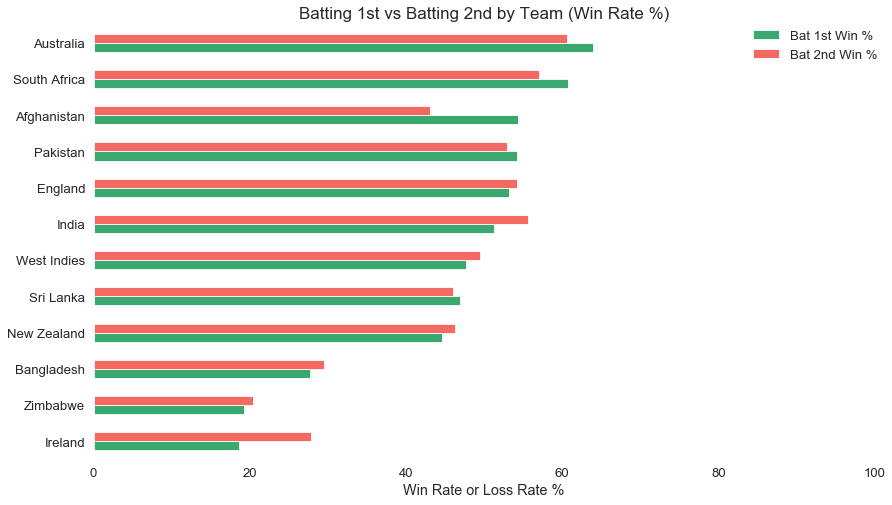

In [679] used 3.699 MiB RAM in 0.484s, peaked 0.469 MiB above current, total RAM usage 463.855 MiB


In [679]:
#transforming and grappling with data to feed into plot

%time
bat1stmatches = matches_12teams_df[matches_12teams_df['Bat']=="1st"]
bat2ndmatches = matches_12teams_df[matches_12teams_df['Bat']=="2nd"]

bat1stmatches_vc = pd.DataFrame(bat1stmatches['Team'].value_counts())
bat1stmatches_vc.index.names = ['Team']
bat1stmatches_vc = bat1stmatches_vc.rename(columns={"Team": "Bat 1st Matches"})

bat2ndmatches_vc = pd.DataFrame(bat2ndmatches['Team'].value_counts())
bat2ndmatches_vc.index.names = ['Team']
bat2ndmatches_vc = bat2ndmatches_vc.rename(columns={"Team": "Bat 2nd Matches"})

bat1stwins_vc = pd.DataFrame(bat1stmatches[bat1stmatches['Result']=="won"]['Team'].value_counts())
bat1stwins_vc.index.names = ['Team']
bat1stwins_vc = bat1stwins_vc.rename(columns={"Team": "Bat 1st Wins"})

bat2ndwins_vc = pd.DataFrame(bat2ndmatches[bat2ndmatches['Result']=="won"]['Team'].value_counts())
bat2ndwins_vc.index.names = ['Team']
bat2ndwins_vc = bat2ndwins_vc.rename(columns={"Team": "Bat 2nd Wins"})

bat1st2nd_df = pd.merge(bat1stmatches_vc, bat2ndmatches_vc, on="Team")
bat1st2nd_df = pd.merge(bat1st2nd_df, bat1stwins_vc, on="Team")
bat1st2nd_df = pd.merge(bat1st2nd_df, bat2ndwins_vc, on="Team")
bat1st2nd_df['Bat 1st Win %']=bat1st2nd_df['Bat 1st Wins']*100/bat1st2nd_df['Bat 1st Matches']
bat1st2nd_df['Bat 2nd Win %']=bat1st2nd_df['Bat 2nd Wins']*100/bat1st2nd_df['Bat 2nd Matches']

#plotting data

cmap = sns.diverging_palette(143, 14, l=62, s=85, as_cmap=True) #(Seaborn, 2021)

ax = bat1st2nd_df[['Bat 1st Win %','Bat 2nd Win %']].sort_values(by=['Bat 1st Win %'], ascending=True).plot(
         kind="barh", 
         cmap = cmap,
         legend=True,
         stacked=False,)

plt.title('Batting 1st vs Batting 2nd by Team (Win Rate %)', fontsize=17)
plt.ylabel('')
plt.xlabel('Win Rate or Loss Rate %')
plt.xlim(0,100)
plt.legend(bbox_to_anchor=(1.01,1),borderaxespad=0)
noborders(ax)

The chart above shows the win rates of each team when they bat 1st or 2nd during a match. 

The following teams have higher win rates and are slightly more likely to win when batting 1st:
 - Australia
 - South Africa
 - Afghanistan
 - Pakistan
 - Sri Lanka
 
And the following teams have higher win rates and are slightly more likely to win when batting 2nd or "chasing":
 - England
 - India
 - West Indies
 - New Zealand
 - Bangladesh
 - Zimbabwe
 - Ireland

While the difference is marginal, this information may be especially useful in cases where a team captain is unsure whether to bat 1st or 2nd during a toss. Realistically speaking, a lot of factors such as ground location, weather, home court advantage, pitch dew, team strengths, or opposition weaknesses should be taken into consideration while deciding to bat 1st or 2nd during the toss. However, resorting to a probability-backed decsion is perhaps the best method when the toss decision is too tough or neutral. Additionally, knowing this information can help a captain decide what toss decision to make depending on the opposition's likelihood of winning or losing. Finally, teams can use this information to improve their weaker side, whether that is batting first or second.

Wall time: 0 ns


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5]),
 <a list of 12 Text xticklabel objects>)

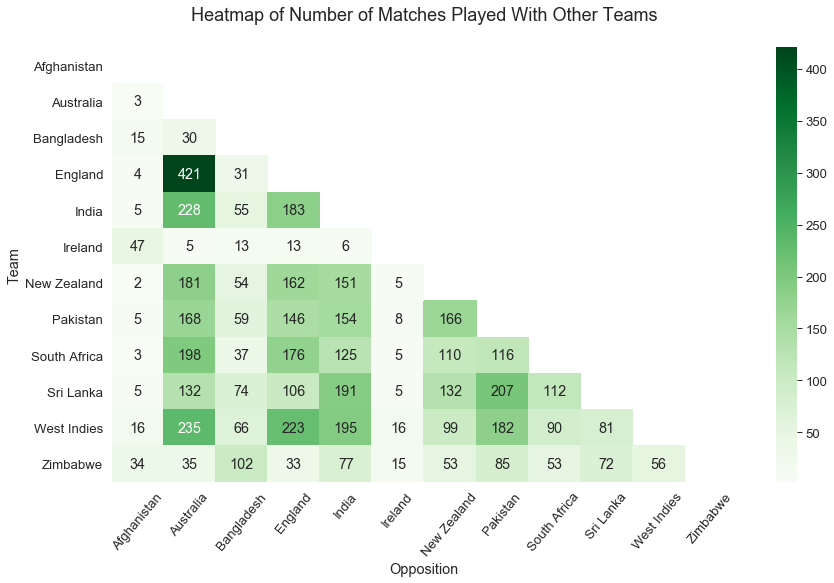

In [680] used 5.809 MiB RAM in 0.910s, peaked 2.199 MiB above current, total RAM usage 469.664 MiB


In [680]:
#aggregating data for plot

%time
crossmatches = matches_12teams_forhm.pivot_table(values='Result', 
                index=['Team','Opposition'], aggfunc='count', margins=False)
crossmatches = crossmatches.rename(columns={"Result": "Matches"})   
crossmatches = crossmatches.pivot_table(values='Matches', 
                index=['Team'], columns=['Opposition'],aggfunc='sum', margins=False)  

#cutting out redundant values from upper right triangle in heatmap

mask = np.zeros_like(crossmatches)
triangle_indices = np.triu_indices_from(mask)
mask[triangle_indices]=True

#plotting into heatmap

sns.heatmap(crossmatches, cmap="Greens", mask=mask, annot=True, fmt='.0f')
plt.xlabel("Opposition")
plt.ylabel("Team")
plt.title("Heatmap of Number of Matches Played With Other Teams\n", size=18)
plt.xticks(rotation=50)

The heatmap above neatly shows how many matches each of the 12 main teams has played with every other team. The darkest cell is 421 matches between England and Australia followed by 235 matches between Australia and West Indies and 228 matches between Australia and India. This information can be useful for Cricket boards in balancing out game pairings to make sure teams are playing enough games against every other team.

Next, it would be much more useful to see how the different teams perform against each other in terms of win rate percentages.

Wall time: 0 ns


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5]),
 <a list of 12 Text xticklabel objects>)

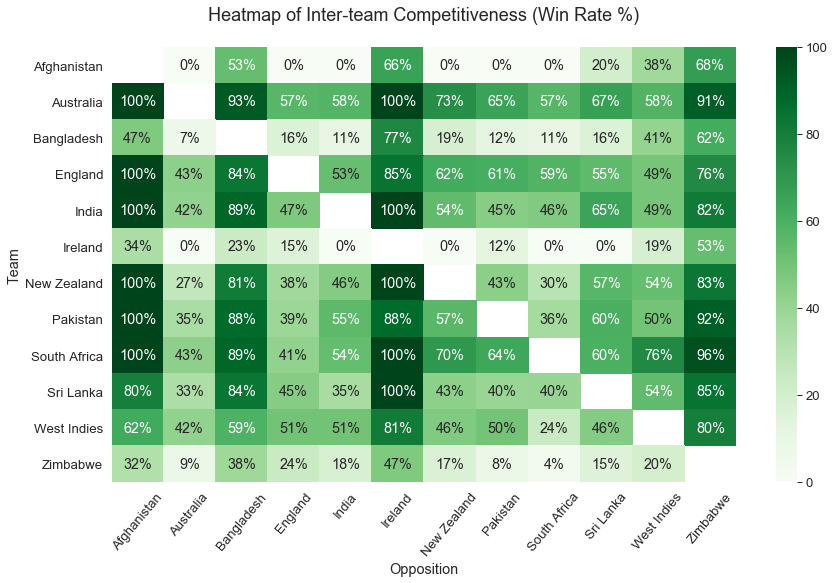

In [681] used 4.410 MiB RAM in 1.069s, peaked 2.000 MiB above current, total RAM usage 474.074 MiB


In [681]:
#aggregating data for plot

%time
crossmatches = matches_12teams_forhm.pivot_table(values='Result', 
                index=['Team','Opposition'], aggfunc='count', margins=False)
crossmatches = crossmatches.rename(columns={"Result": "Matches"})
crosswins = matches_12teams_forhm.pivot_table(values='Result', 
                index=['Team','Opposition'], aggfunc='sum', margins=False)
crosswins = crosswins.rename(columns={"Result": "Wins"})
crosscomp = pd.merge(crossmatches, crosswins, on=["Team","Opposition"])
crosscomp['Win %'] = (crosscomp['Wins'] / crosscomp['Matches'])*100
crosscomp = crosscomp.pivot_table(values='Win %', 
                index=['Team'], columns=['Opposition'],aggfunc='sum', margins=False)     

#plotting data

res = sns.heatmap(crosscomp, cmap="Greens", annot=True, fmt='.0f')
for t in res.texts: t.set_text(t.get_text() + "%")
plt.xlabel("Opposition")
plt.ylabel("Team")
plt.title("Heatmap of Inter-team Competitiveness (Win Rate %)\n", size=18)
plt.xticks(rotation=50)

The heatmap above can be read from left-right-down, showing the win rate percentage of each team against every other opposition. Several insights can be obtained from this visualization:
- Cells that contain the value 100% indicate that the team has never lost a match with the opposition involved. For example, Australia and India have both never lost a match against Afghanistan and Ireland. 
- The column Afghanistan features the most number of 100% cells in darker green. This means that many teams have a 100% win rate against Afghanistan. 
- The darkest columns are that of Afghanistan, Bangladesh, Ireland, and Zimbabwe. So, other teams have the highest win rates against these teams. 
- Row-wise, Australia and England have the darkest rows which indicates they have the highest win rates against other teams. 
- England and South Africa have been the toughest opponents for Australia (win rate of 57%).
- Australia has been the toughest opponent for most of the other teams.

Text(0.5, 0.98, 'Wickets vs Runs Scatterplot by Team')

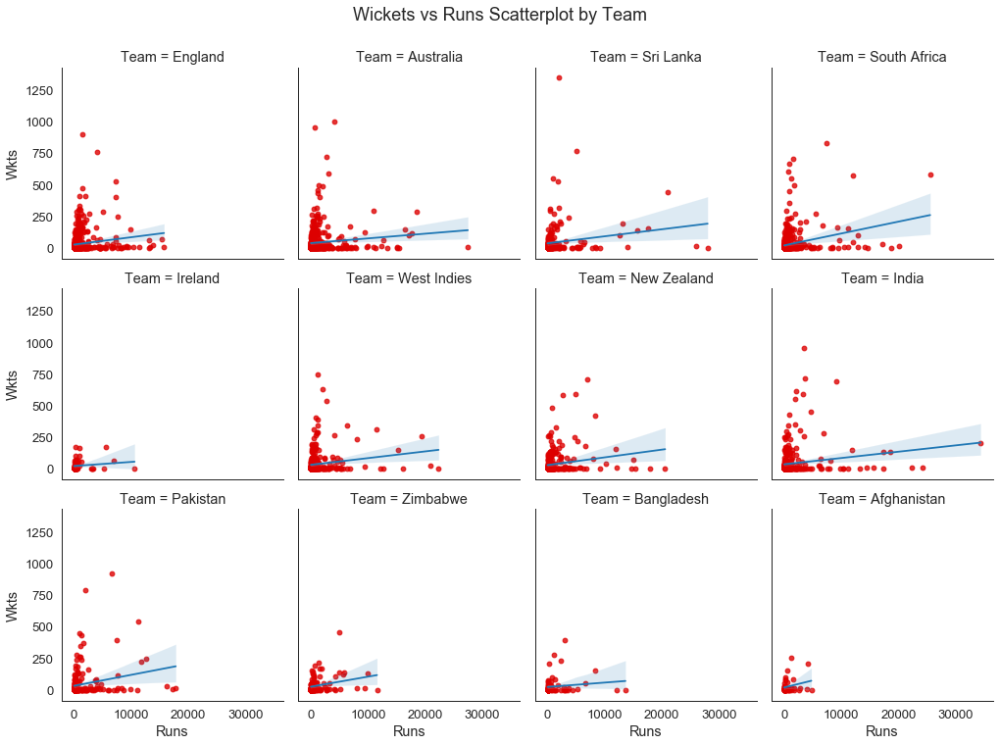

In [618]:
sns.lmplot(x='Runs', y='Wkts', 
           data=players_12teams_df, palette="muted", col="Team", col_wrap=4, height=3.6,
           scatter_kws={'linewidth':1,'color':'#dd0000'})
plt.subplots_adjust(top=0.9)
plt.suptitle('Wickets vs Runs Scatterplot by Team', fontsize = 18)

The plot above shows the associations between runs scored and wickets taken at a team level. One example where this chart is helpful is in investigating whether there are teams that score a lot of runs but do not take enough wickets, or vice versa. 

Generally, all the teams show positive weak to moderate correlations between the runs scored and wickets taken. The chart shows that teams with higher number of runs scored naturally tend to take more wickets as well, to a certain extent. That said, the correlations are weak to moderate and not high enough to invite decisive conclusions.

Looking at the spread and density of the dots, Ireland and Afghanistan clearly score the least number of runs and take the least number of wickets. India appears to score a lot of runs but does not take as much wickets. On the other hand, Sri Lanka takes more wickets than it scores runs as indicated by a relatively taller wedge. Overall, the plots show a similar distribution and relationship across the different teams.

Text(0.5, 1.0, 'Team Performance Based on Matches (circle size), Runs(x), and Wickets(y)\n')

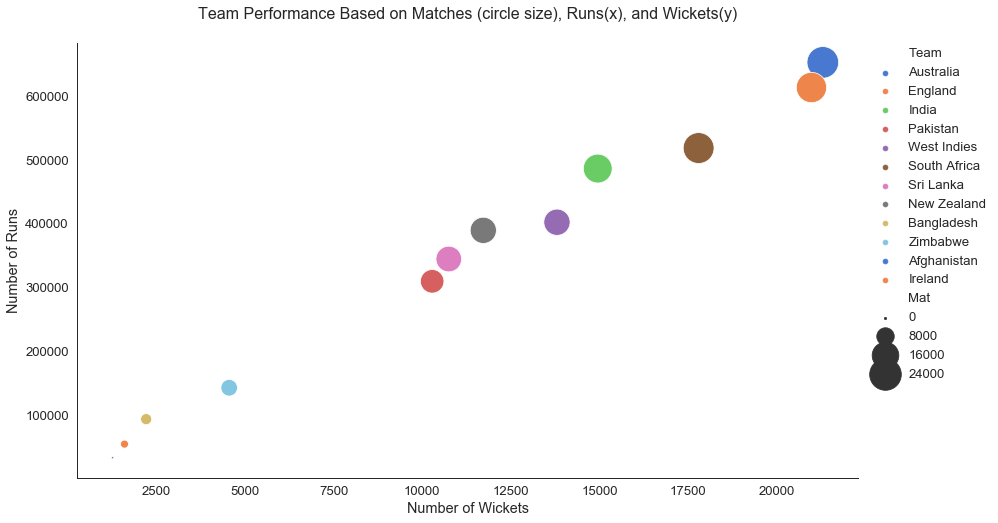

In [620]:
#aggregating data for plot

rankvizdf = players_12teams_df.pivot_table(values=['Wkts','Runs','Mat'], index='Team',aggfunc='sum')
rankvizdf.reset_index(inplace=True)
corrdf = pd.merge(winlossdf,rankvizdf, on="Team")
corrdf['Ave_runs_per_game'] = corrdf['Runs'] / corrdf['Total'] 
corrdf['Ave_wkts_per_game'] = corrdf['Wkts'] / corrdf['Total'] 

#plotting into bubble plot (3 variables)

ax = sns.scatterplot(x="Wkts",y="Runs",hue="Team", size = "Mat", sizes = (5,1000), palette="muted",data=corrdf)
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.xlabel("Number of Wickets")
plt.ylabel("Number of Runs")
plt.title("Team Performance Based on Matches (circle size), Runs(x), and Wickets(y)\n", fontsize=16)

The bubble plot shows team performance across three dimensions: number of matches played ("Mat" in legend), runs scored, and wickets taken. There is clearly a strong relationship between the three. Teams that take more wickets also score more runs as perceivable by the linear shape of the plot. Moreover, as the bubble size (i.e. number of matches) increases, so does the number of runs and wickets. To illustrate, Australia and England have played the most number of matches and have the most number of runs and wickets as well. 

In [621]:
linreg(rankvizdf['Runs'],rankvizdf['Wkts'])

Linear regression output: 

Equation: y = 0.033645913734476875 x  +  -413.958281763149 
Correlation coefficient (r):  0.9960753286668934 
p-value 7.284908994924062e-12 
Standard error: 0.0009454319040477226


The correlation test shows a statistically significant association between the number of runs and wickets. 

Text(0.5, 1, 'Wickets Taken vs Win Rate % (Points = Team)\n')

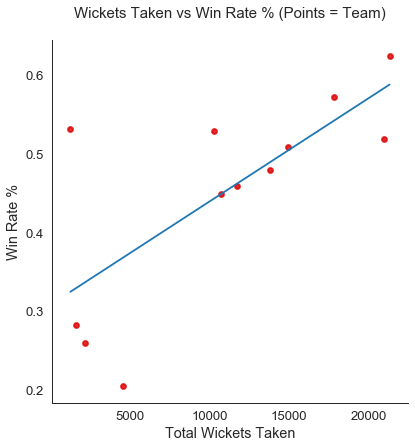

In [1377]:
sns.lmplot(x='Wkts', y='Win Rate %', 
           data=corrdf, height=6, aspect=1, ci=None,
           scatter_kws={'linewidth':2,'color':'#dd0000'})
plt.xlabel("Total Wickets Taken")
plt.ylabel("Win Rate %")
plt.title("Wickets Taken vs Win Rate % (Points = Team)\n", size=15)

The plot above explores the impact of the number of wickets taken by a team to its win rate percentage. There appears to be a strong positive correlation in that teams that take more wickets win more matches on average. 

In [1378]:
linreg(corrdf['Wkts'],corrdf['Win Rate %'])

Linear regression output: 

Equation: y = 1.316257383037844e-05 x  +  0.30819161490052877 
Correlation coefficient (r):  0.7220985358758114 
p-value 0.008002386627164123 
Standard error: 3.987665968417074e-06


Indeed, the correlation test reveals a correlation coefficient (r) of 0.72 which indicates a strong correlation. The p-value of 0.008 is less than 0.05 so the result is statistically significant. 

Text(0.5, 1, 'Runs Scored vs Win Rate % (Points = Team)\n')

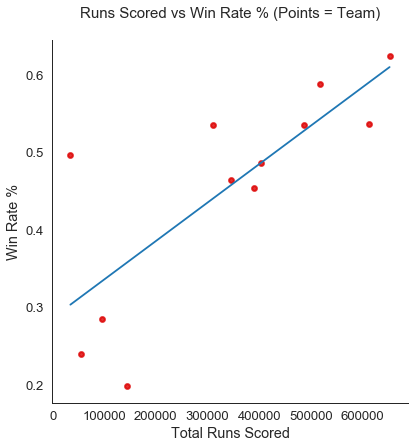

In [623]:
sns.lmplot(x='Runs', y='Win Rate %', 
           data=corrdf, height=6, aspect=1, ci=None,
           scatter_kws={'linewidth':2,'color':'#dd0000'})
plt.xlabel("Total Runs Scored")
plt.ylabel("Win Rate %")
plt.title("Runs Scored vs Win Rate % (Points = Team)\n", size=15)

Similarly, the numer of runs scored also has a strong association with win rate percentage. 

In [1386]:
linreg(corrdf['Runs'],corrdf['Win Rate %'])

Linear regression output: 

Equation: y = 4.367979595814933e-07 x  +  0.3047890103219867 
Correlation coefficient (r):  0.709438137420706 
p-value 0.009765680189816165 
Standard error: 1.3721831106112806e-07


The test resulted in a correlation coefficient (r) of 0.70 and a p-value of 0.009. Comparing this with the result for number of wickets, the association is slightly weaker. The reason it is important to emphasize this is because of the popular notion that runs scored are more important than wickets taken. These results show that the number of wickets taken have an equal if not higher impact on the win rate percentage. 

Text(0.5, 1.0, 'Team Performance Based on Average Runs Scored and Average Wickets Taken \n')

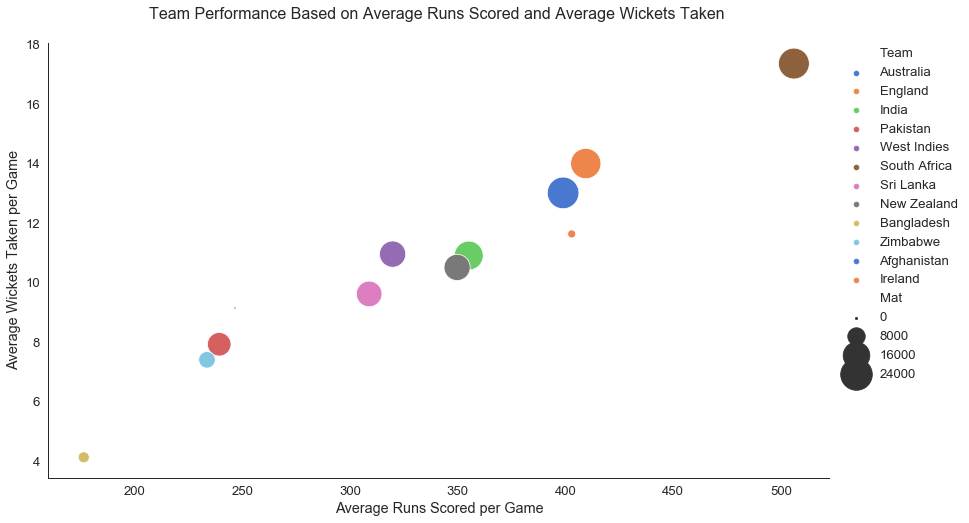

In [627]:
ax = sns.scatterplot(x="Ave_runs_per_game",y="Ave_wkts_per_game",
                     hue="Team", size = "Mat", sizes = (5,1000), palette="muted",data=corrdf)
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.xlabel("Average Runs Scored per Game")
plt.ylabel("Average Wickets Taken per Game")
plt.title("Team Performance Based on Average Runs Scored and Average Wickets Taken \n", fontsize=16)

Instead of adding up the total wickets and runs, the plot above visualizes the average number of runs and wickets per game in order to rule out the effect the number of matches might have on runs and wickets. While the previous plot showed that Australia and England have the highest total runs and wickets, this plot reveals that South Africa (in brown) has the highest average runs and wickets per game. It is just that South Africa has not played as many matches as Australia and England. 

Text(0.5, 1, 'Average Runs Scored vs Average Wickets Taken per Match (Points = Team)\n')

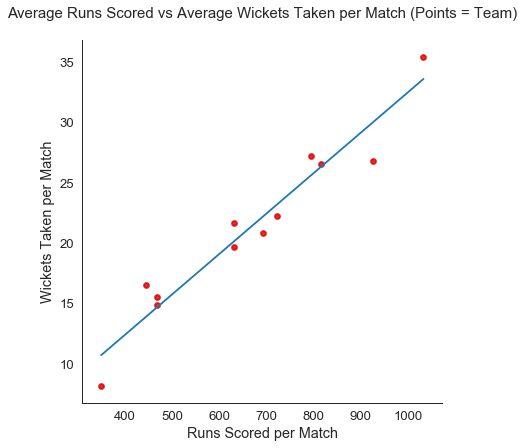

In [93]:
#plotting into correlation scatter plot

sns.lmplot(x='Ave_runs_per_game', y='Ave_wkts_per_game', 
           data=corrdf, height=6, aspect=1, ci=None,
           scatter_kws={'linewidth':2,'color':'#dd0000'})
plt.xlabel("Runs Scored per Match")
plt.ylabel("Wickets Taken per Match")
plt.title("Average Runs Scored vs Average Wickets Taken per Match (Points = Team)\n", size=15)

In [1371]:
linreg(corrdf['Ave_runs_per_game'],corrdf['Ave_wkts_per_game'])

Linear regression output: 

Equation: y = 0.03341967284779837 x  +  -0.9406104297793085 
Correlation coefficient (r):  0.9679174493749545 
p-value 2.536471341962926e-07 
Standard error: 0.002743479739630434


As seen in the regression results above, there is a strong correlation (r = 0.967) at a p-value of near zero between average runs per game and average wickets per game. 

Text(0.5, 1.0, 'Bowling and Batting Averages by Team\n')

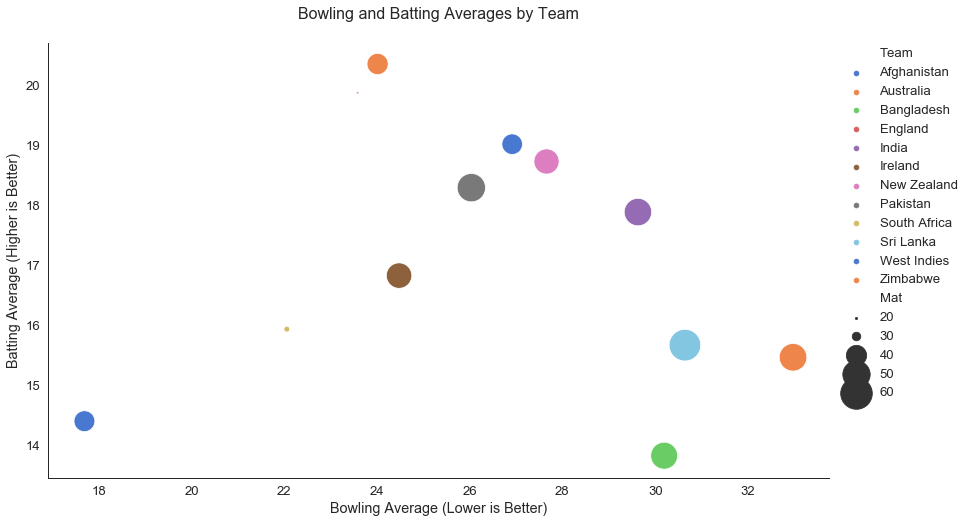

In [628]:
#aggregating data

rankvizdf1 = players_12teams_df.pivot_table(values=['Bowl Av','Bat Av','Mat'], index='Team',aggfunc='mean')
rankvizdf1.reset_index(inplace=True)

#plotting data

ax = sns.scatterplot(x="Bowl Av",y="Bat Av",
                     hue="Team",size = "Mat", sizes = (5,1000), palette="muted",data=rankvizdf1)
plt.legend(bbox_to_anchor=(1.01, 1),borderaxespad=0)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.xlabel("Bowling Average (Lower is Better)")
plt.ylabel("Batting Average (Higher is Better)")
plt.title("Bowling and Batting Averages by Team\n", fontsize=16)

The chart above assesses team performance based on batting and bowling averages. The size of the circle represents number of matches played while the color pertains to the Team. The key insight that can be derived from this visualization is the degree to which the strength or weakness of each team deviates towards batting or bowling.

Based on the position of the points across the grid, the following can be observed:

Teams that are relatively stronger in Bowling compared to Batting:
 - South Africa
 - Afghanistan
 - Bangladesh
 - Sri Lanka

Teams that are relatively stronger in Batting compared to Bowling:
 - India
 - Australia
 - West Indies
 - New Zealand
 - Zimbabwe
 - England
 
Teams that are balanced in Batting and Bowling:
 - Ireland
 - Pakistan

Moving on, it is meaningful to look at whether country indicators such as population or GDP per capita are associated with the number of players a country produces or the number of matches played by each country. A number of correlation tests are done to examine this.

In [ ]:
#aggregating matches played by year and country

m = matches_12teams_df.pivot_table(
    index=['Team', matches_12teams_df['Start Date'].dt.year], values='Ground', aggfunc = "count")
m.reset_index(inplace=True)
m.rename(columns = {'Team': 'country','Start Date': 'year', 'Ground': 'matches_played'}, inplace = True)

#aggregating players produced by year and country

pp = players_12teams_df.pivot_table(
    index=['Team','career_start'], values="Player", aggfunc="count")
pp.reset_index(inplace=True)
pp.rename(columns = {'Team': 'country','career_start': 'year', 'Player': 'players_produced'}, inplace = True)

#merging data for tests and plots
c3 = pd.merge(countries_12teams_df,pp, on = ['country','year'], how="left" )
c3 = pd.merge(c3,m, on = ['country','year'], how="left" )
c3.dropna(inplace=True)

GDP per Capita vs Players Produced:

In [136]:
linreg(c3['gdp_per_capita'], c3['players_produced'])

Linear regression output: 

Equation: y = 1.2028991686961401e-05 x  +  5.635973286421477 
Correlation coefficient (r):  0.028129320420269093 
p-value 0.5621341453808582 
Standard error: 2.073498053277659e-05


The correlation coefficient of 0.03 and p-value of 0.56 indicate that there is not enough evidence to conclude that a country's GDP per capita is related to the number of players produced. 

GDP per Capita vs Matches Played:

In [631]:
linreg(c3['gdp_per_capita'], c3['matches_played'])

Linear regression output: 

Equation: y = 0.00012361205076610404 x  +  23.15356207763552 
Correlation coefficient (r):  0.16230345430846058 
p-value 0.0007616988632594113 
Standard error: 3.6453707965928006e-05


The correlation coefficient of 0.16 indicates that a country's GDP per capita is not related to the number of matches played.

Total Population vs Matches Played:

In [634]:
linreg(c3['population_total'], c3['matches_played'])

Linear regression output: 

Equation: y = 7.528941664509962e-09 x  +  23.340508901879772 
Correlation coefficient (r):  0.18299045646023898 
p-value 0.00014331238701874289 
Standard error: 1.962073228084356e-09


The correlation coefficient of 0.18 indicates that a country's population is not related to the number of matches played.

Total Population vs Players Produced:

In [189]:
linreg(c3['population_total'], c3['players_produced'])

Linear regression output: 

Equation: y = -5.231511254474095e-10 x  +  5.8415113818285045 
Correlation coefficient (r):  -0.022645647151978192 
p-value 0.6407594067863709 
Standard error: 1.1203057772820525e-09


The correlation coefficient of -0.02 indicates that a country's population is not related to the number of players produced.

Overall, no strong correlations were found between country indicators and the number of matches or players of Cricketing countries. 

Text(0.5, 0, 'Year')

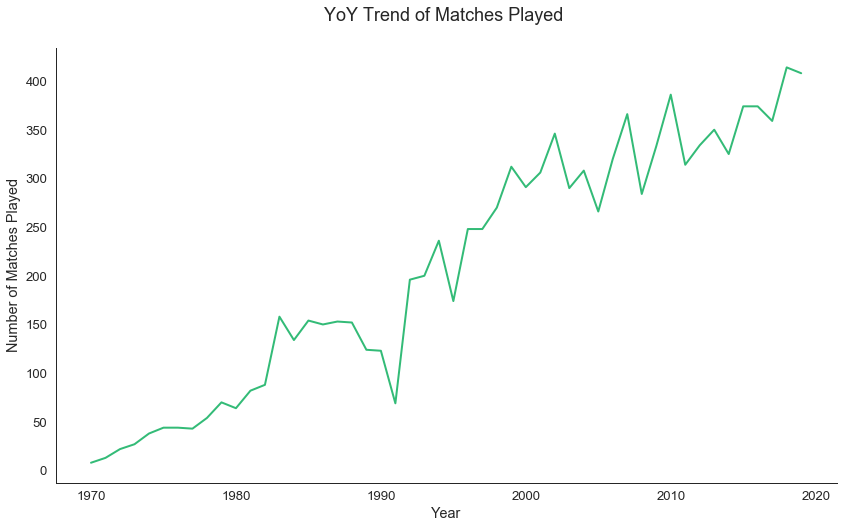

In [642]:
sns.lineplot(data = c3, y="matches_played", x="year", color="#33bb77", ci=None, linewidth=2, estimator=np.sum)
sns.despine(left=False, bottom=False)
plt.title('YoY Trend of Matches Played \n', fontsize=18)
plt.ylabel('Number of Matches Played')
plt.xlabel('Year')

As far as trends are concerned, the overall number of matches player per year has been increasing over the last 50 years as shown in the line chart above. This may indicate that the sport has grown over time in terms of popularity.

Text(0.5, 0, 'Year')

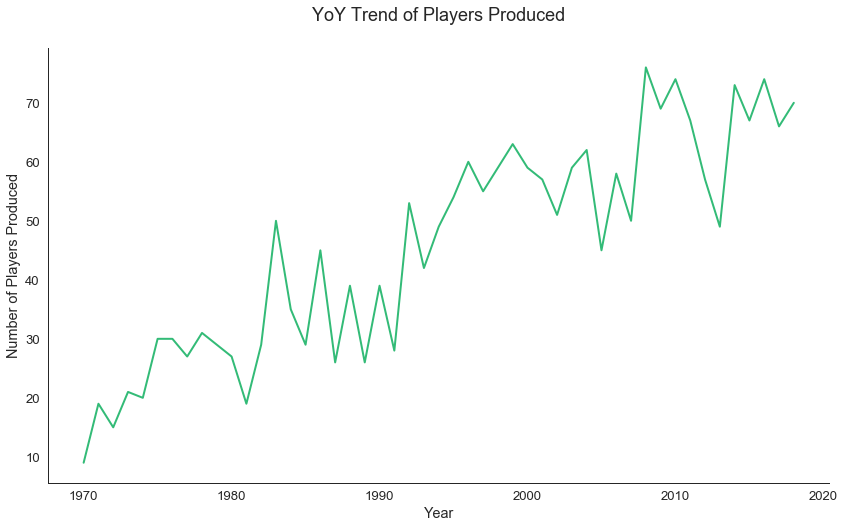

In [641]:
sns.lineplot(data = c3[c3['year']<2019], y="players_produced", x="year", color="#33bb77",ci=None, linewidth=2, estimator=np.sum)
sns.despine(left=False, bottom=False)
plt.title('YoY Trend of Players Produced\n', fontsize=18)
plt.ylabel('Number of Players Produced')
plt.xlabel('Year')

The chart above shows the overall number of players produced per year has been increasing over the last 50 years. This also indicates that the sport has grown over time in terms of popularity with countries producing more and more Cricket players every year. 

Text(0.5, 0, 'Year')

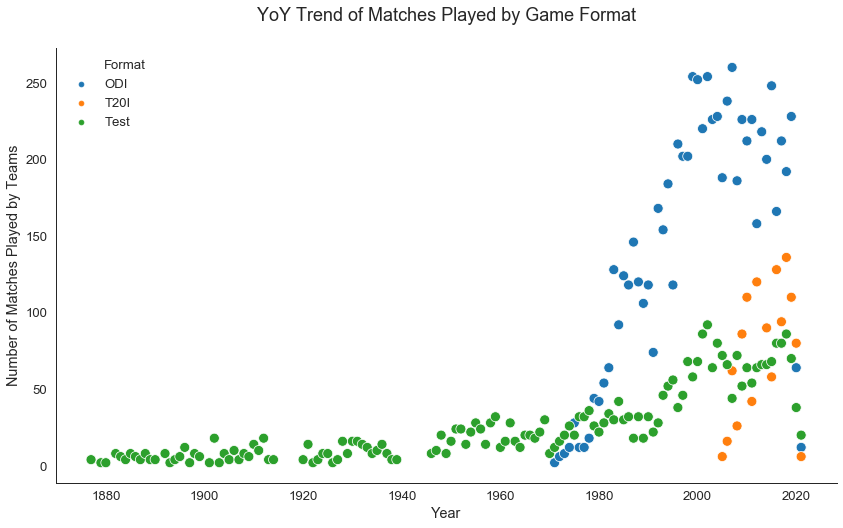

In [647]:
#aggregating data for plot

f = matches_12teams_df.pivot_table(
    index=['Format', matches_12teams_df['Start Date'].dt.year], values='Team', aggfunc = "count")
f.reset_index(inplace=True)
f.rename(columns = {'Start Date': 'year', 'Team': 'matches_played'}, inplace = True)

#plotting data

sns.scatterplot(data = f[f['year']>1800], y="matches_played", x="year", hue="Format", s=100)
sns.despine(left=False, bottom=False)
plt.title('YoY Trend of Matches Played by Game Format\n', fontsize=18)
plt.ylabel('Number of Matches Played by Teams')
plt.xlabel('Year')

The plot above shows the number of matches played by teams for each format of the game. 

From the plot, it can be inferred that Test matches are the oldest format - with the first match played way back around the 1880s. However, the birth of ODIs in around 1970 has been game-changing for the sport. Over the last 50 years, the number of ODIs per year has increased sharply. At present day, more ODIs are played than test matches despite test matches being the oldest format. In addition, the T20I format was introduced in around 2005 and has also been gaining popularity ever since. There is a visible drop in the year 2020 which is likely because not much sport activity took place because of the COVID-19 pandemic. 

Text(0.5, 0.98, 'YoY Trend of Win Rate % by Team (21st Century)')

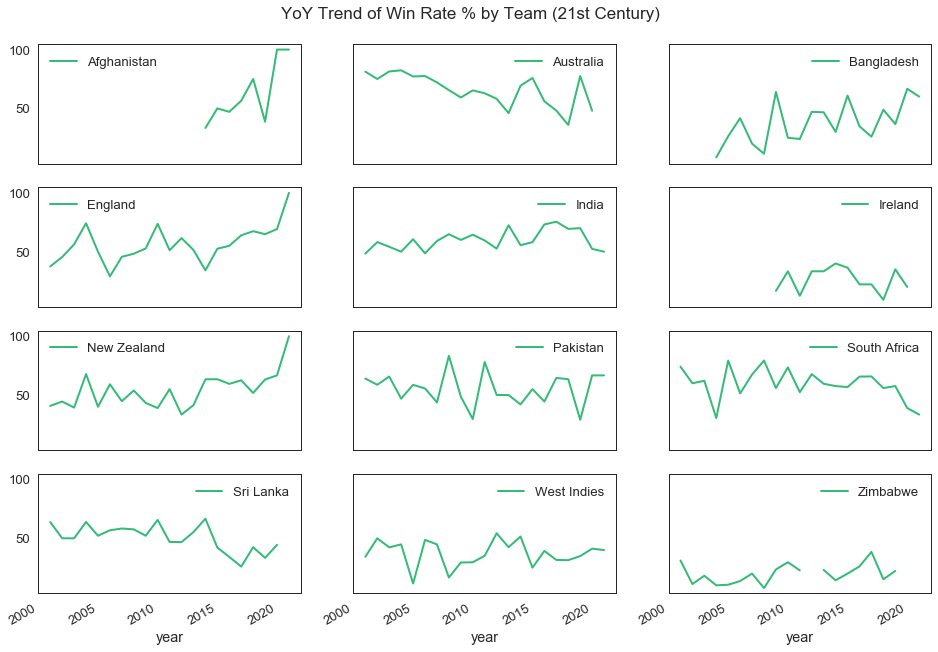

In [239]:
#transforming data for plot

w = matches_12teams_df[matches_12teams_df['Result']=="won"].pivot_table(
    index=['Team', matches_12teams_df['Start Date'].dt.year], values='Ground', aggfunc = "count")
w.reset_index(inplace=True)
w.rename(columns = {'Team': 'country','Start Date': 'year', 'Ground': 'matches_won'}, inplace = True)

wrtrend_df = pd.merge(m,w,on=['country','year'], how="inner")
wrtrend_df['win_rate']=wrtrend_df['matches_won']*100/wrtrend_df['matches_played']

#plotting data

p = wrtrend_df[wrtrend_df['year']>2000].pivot_table(
    values='win_rate', index='year', columns="country",aggfunc='sum')

p.plot(subplots=True, sharey=True, layout=(5,3), figsize=(16,13), linewidth=2, color="#33bb77") 
plt.subplots_adjust(top=0.94)
plt.suptitle('YoY Trend of Win Rate % by Team (21st Century)', fontsize = 17)

The visualization above shows win rate trends by country for the last 20 years. It is notable that the win rates of Bangladesh, England, Afghanistan, and New Zealand have increased over the last two decades. As such, it can be said that these three countries have improved the most as far as winning matches is concerned. On the other hand, the win rates of Sri Lanka and South Africa have been slightly decreasing over the last 20 years. The rest of the countries do not have notable uptrends or downtrends in win rates.

<b> The Player Value Index </b>

In the final part of this analysis, an attempt is made to build a player value index.

Player selection is often a tough process for Cricket teams. There is a lot of pressure faced by captains, coaches, and management teams to select the best set of players in order to maximize chances of winning.

One way to alleviate this dilemma is by using a data-driven approach and assessing players based on the overall value they bring to the team. Such a metric or index does not officially exist in the Cricket world, but can arguably ease the process in selecting players as compared to intuitive guesswork.

In order to build this novel metric, a player's batting value, bowling value, fielding value, and experience value are first calculated by applying relative percentile scoring on certain indicative variables. These four value scores are then taken as inputs into a mathematical function which weighs these inputs and returns an overall value for the player. Since the player value takes in inputs from all aspects of the game, it can be especially useful in selecting all-rounders (i.e players that can bat, bowl, and field well). 

What follows is the code to build the player value index:

In [684]:
%time
playervalue_df = players_12teams_df.copy()
playervalue_df['Ct Av'] = playervalue_df['Ct'] / playervalue_df['Mat']

worst_bowl_av = playervalue_df['Bowl Av'].max()
worst_bowl_av
playervalue_df=playervalue_df.replace({'Bowl Av': {0: worst_bowl_av}}) 

#assigning percentile rank scores to batting, bowling, fielding, and experience indicators

playervalue_df['Bat Av %tile'] = playervalue_df['Bat Av'].rank(pct = True) #batting value
playervalue_df['Bowl Av %tile'] = playervalue_df['Bowl Av'].rank(pct = True) #bowling value
playervalue_df['Ct Av %tile'] = playervalue_df['Ct Av'].rank(pct = True) #fielding value
playervalue_df['Exp %tile'] = playervalue_df['Mat'].rank(pct = True) #experience value

#calculating overall player value using custom mathematical function

playervalue_df['player_value'] = (playervalue_df['Bat Av %tile']*0.25 - playervalue_df['Bowl Av %tile']*0.25 + playervalue_df['Ct Av %tile']*0.1 +  playervalue_df['Exp %tile']*0.4 + 0.25)*100
playervalue_df['player_value'].describe()

Wall time: 0 ns


count    3918.000000
mean       50.006381
std        19.138639
min         8.778076
25%        35.599796
50%        51.231177
75%        65.201953
max        95.696146
Name: player_value, dtype: float64

In [684] used 1.480 MiB RAM in 0.035s, peaked 0.000 MiB above current, total RAM usage 475.562 MiB


Text(0.5, 1.0, 'Top Players by Overall Player Value')

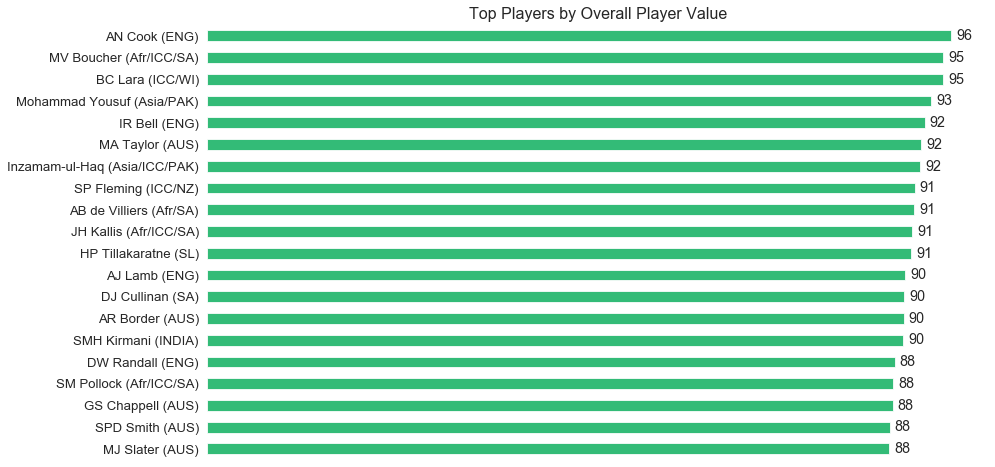

In [650]:
#aggregating data

topplayers = playervalue_df.pivot_table(values=['player_value'], index=['Player'], aggfunc='sum', 
             margins=False).sort_values('player_value', ascending=False)

#plotting data

ax = topplayers[:20].sort_values('player_value', ascending=True).plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Top Players by Overall Player Value", size=16)

The bar chart above shows the most valuable Cricket players based on the newly defined player value index. Among all players, Alastair Cook of England has the highest value of 96. 

Text(0.5, 1.0, 'Top Players by Overall Player Value (2010 and up)')

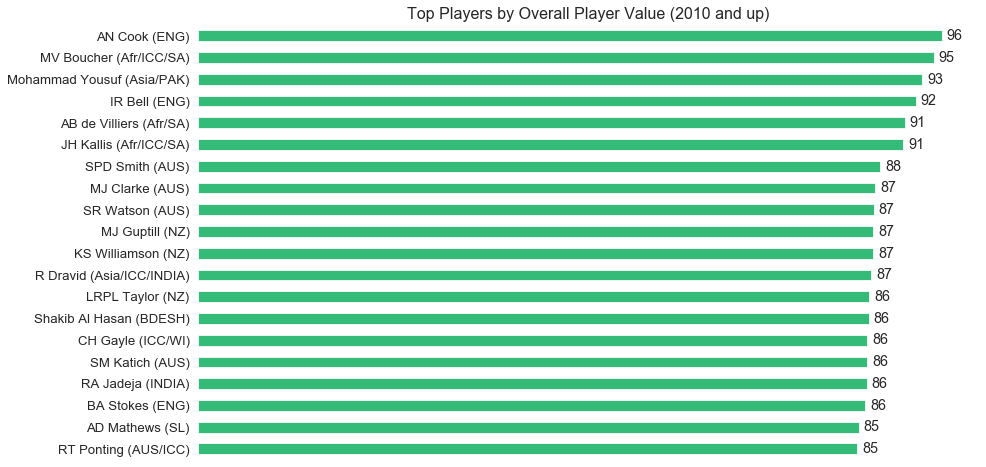

In [652]:
#aggregating data

topplayers = playervalue_df[playervalue_df['career_end']>2009].pivot_table(
             values=['player_value'], index=['Player'], aggfunc='sum', 
             margins=False).sort_values('player_value', ascending=False)

#plotting data

ax = topplayers[:20].sort_values('player_value', ascending=True).plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Top Players by Overall Player Value (2010 and up)", size=16)

The bar chart above shows the most valuable Cricket players not including players who retired before 2010.

Text(0.5, 1.0, 'Teams Ranked by Overall Player Value (21st Century)')

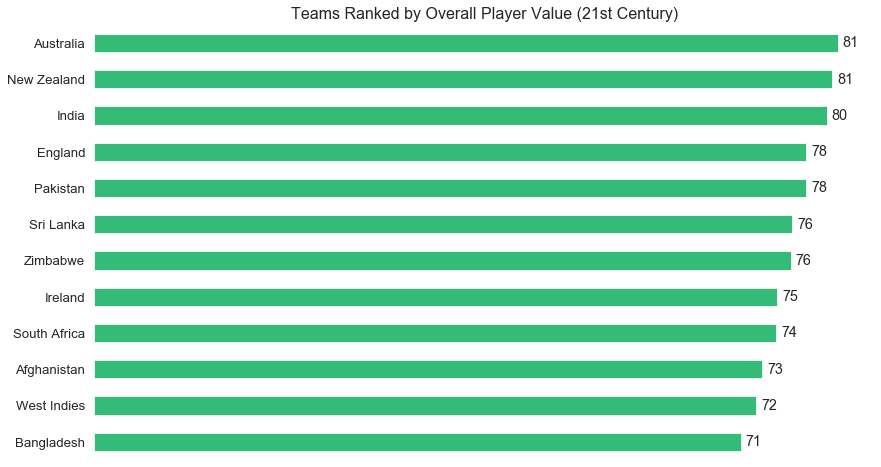

In [658]:
#aggregating data

topcountriesv = playervalue_df[playervalue_df['career_end']>1999].pivot_table(
                values=['player_value'], index=['Team'], aggfunc=lambda x: np.percentile(x, 90), 
                margins=False).sort_values('player_value', ascending=False)

#plotting data

ax = topcountriesv[:20].sort_values('player_value', ascending=True).plot(kind="barh",color="#33bb77",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Teams Ranked by Overall Player Value (21st Century)", size=16)

The chart above ranks teams by the 90th percentile player value of their players. It can be seen that the 90th percentile player value of all Australian players is 81, which is the highest among teams together with New Zealand.  

Text(0.5, 1.0, 'Team Case Study: India - Most Valuable Players')

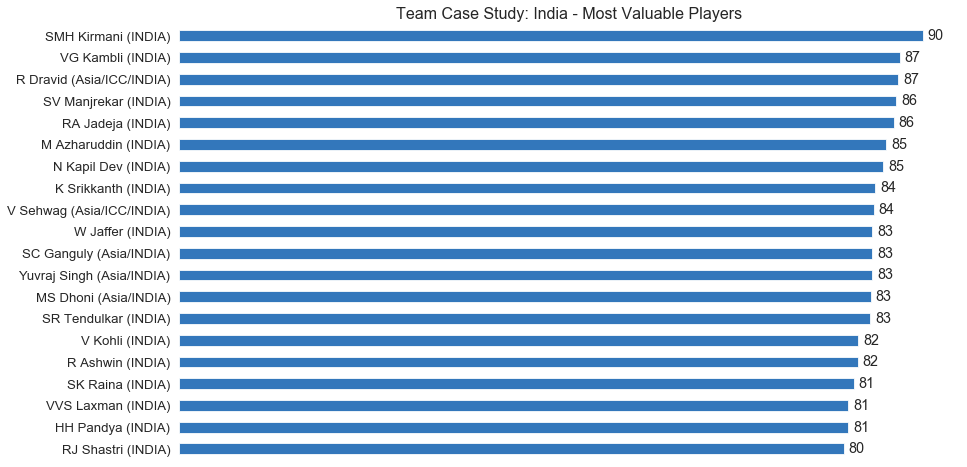

In [660]:
#aggregating data

topplayers = playervalue_df[playervalue_df['Team']=='India'].pivot_table(
             values=['player_value'], index=['Player'], aggfunc='sum', 
             margins=False).sort_values('player_value', ascending=False)

#plotting data

ax = topplayers[:20].sort_values('player_value', ascending=True).plot(kind="barh",color="#3377bb",legend=False)
addbarhlabels(ax)
noborders(ax)
plt.xticks([])
plt.ylabel("")
plt.title("Team Case Study: India - Most Valuable Players", size=16)

Considering the Indian Cricket Team as a case study example, players can be selected based on their player value index as shown in the chart above. Players with a higher player value index are more likely to score more runs, take more wickets, take more catches, and utilize their experience. So by using the player value index to select a pool of valuable players - especially all-rounders -  the Indian Cricket Team can increase their chances of winning. 

## Game Over: Key Takeaways and Conclusions

The following key findings can be summarized from the analyses:

- Statistically speaking, the toss outcome does not impact the match outcome. Win rate percentages across teams remained the same whether or not the team won the toss. 
- Australia, England, and South Africa have the highest win rate percentages. Australia consistently came out as the top team for a number of the metrics.
- Some teams are stronger in batting than bowling, and vice versa. Moreover, some teams win more matches batting first while others perform better batting second. This information can be useful when teams are unsure of whether to bat 1st or 2nd after winning the toss. 
- The number of runs scored and number of wickets taken were both positively correlated with a team's win rate percentage.
- The average number of runs scored was positively correlated with the average number of wickets taken. 
- There was no correlation found between a country's population or GDP per capita and the number of Cricket matches or players produced.
- In terms of win rate trends over the last twenty years, England, Bangladesh, New Zealand, and Afghanistan are the most improved teams. 
- Test matches are declining in popularity while newer formats such as ODIs and T20Is are becoming more popular. 
- The number of matches played and number of players produced by teams is increasing year over year. 
- Using indicators that relate to a player's batting, bowling, fielding, and match experience, it is possible to create a player value index to assess players based on how valuable they are to the team. 


Cricket is a data-rich sport. As data analytics continues to shape all types of sectors including sports, the use of analytics in Cricket will inevitably reach a mature state. Teams that better leverage analytics in their game preparation, strategy, and tactics would be positioned to win more games. Players, captains, coaches, and selection panels can all use these insights to make better decisions and improve performance. However, the manner in which the complex data and metrics are communicated to decision-makers is equally important. For example, coaches and captains may not understand what a certain metric means unless communicated intuitively together with practical game context. 

This analysis only scratches the surface for what is possible with Criclytics. To a large degree, the data that underlies Cricket will not change as much, but the data collection systems and data analysis techniques certanly will. In this regard, the future is bright for data science and machine learning in the world of Cricket.  

## - References

ESPN Cricinfo (2021). Cricket Statistics, Statsguru, and Overall Records. Retrieved from: https://stats.espncricinfo.com/

ICC (2018). What Is Cricket? Get to know the sport. Retrieved from: https://www.youtube.com/watch?v=g-beFHld19c&ab_channel=ICC

Kazmi, R (2019). I don’t Like Cricket…I love it. Retrieved from: https://towardsdatascience.com/i-dont-like-cricket-i-love-it-a710b8cc0f49

Seaborn (2021). Choosing a color palette. Retrieved from: https://seaborn.pydata.org/tutorial/color_palettes.html

Williamson, M (2017). International Cricket Council: A brief history. ESPNcricinfo.

<img src=../images/nv-analytics-footer.png>